In [1]:
import os
import glob
from icecream import ic
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import  Line2D
from matplotlib.path import Path
from matplotlib.patches import FancyArrowPatch
import matplotlib.path as mpltPath
import matplotlib.patches as patches
import pandas as pd
from scipy.stats import zscore
from skimage import filters, measure
from skimage.transform import resize as ResizeArray
from scipy.signal import find_peaks
import cv2
import pickle
from scipy.signal import find_peaks
from scipy.signal import savgol_filter
from scipy.interpolate import interp1d
from tqdm import tqdm

In [2]:
animals = ['khorne', 'kratos', 'larsson', 'ninja', 'korra']

data_root = '../../DATA/1T/trajectories'

experiments = ['Food_eaten', 'Food_not_eaten', 'No_food_Control']

In [3]:
animal_codes_dict = {'khorne': 'O1', 'kratos': 'O2', 'larsson': 'O3', 'ninja': 'O4', 'korra': 'O5'}

In [4]:
target_dir = os.path.dirname(data_root)

  0%|          | 0/15 [00:00<?, ?it/s]

khorne


 20%|██        | 3/15 [00:08<00:31,  2.64s/it]

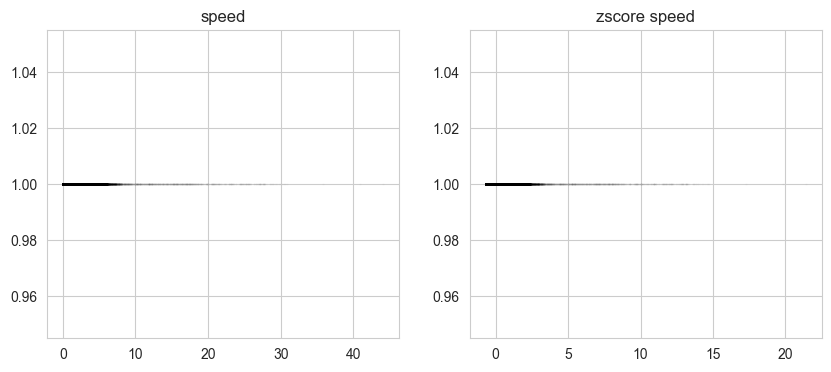

kratos


 40%|████      | 6/15 [00:20<00:31,  3.46s/it]

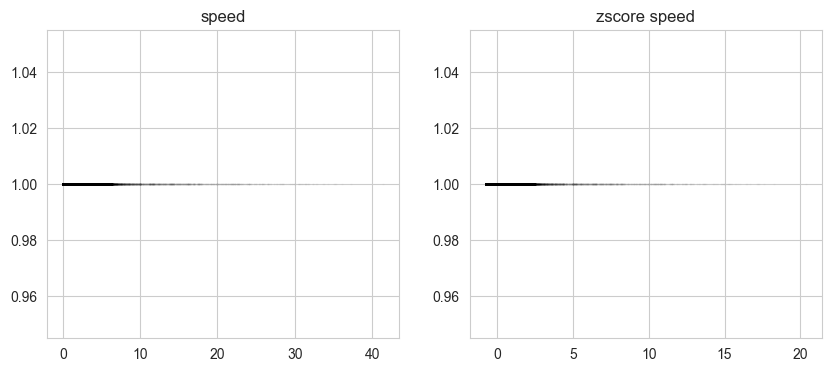

larsson


 60%|██████    | 9/15 [00:33<00:24,  4.08s/it]

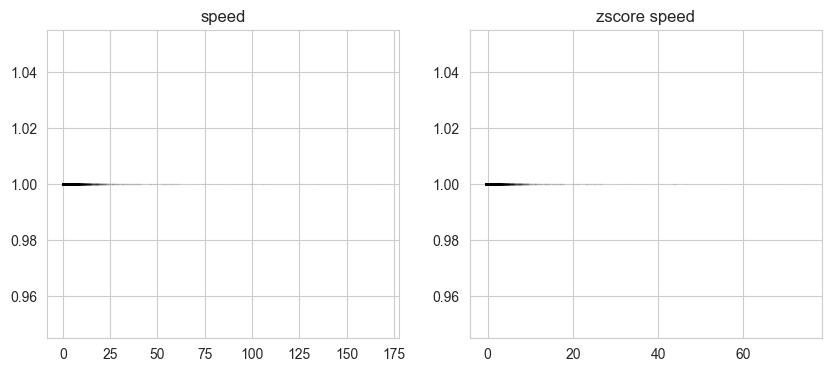

ninja


 80%|████████  | 12/15 [00:45<00:11,  3.79s/it]

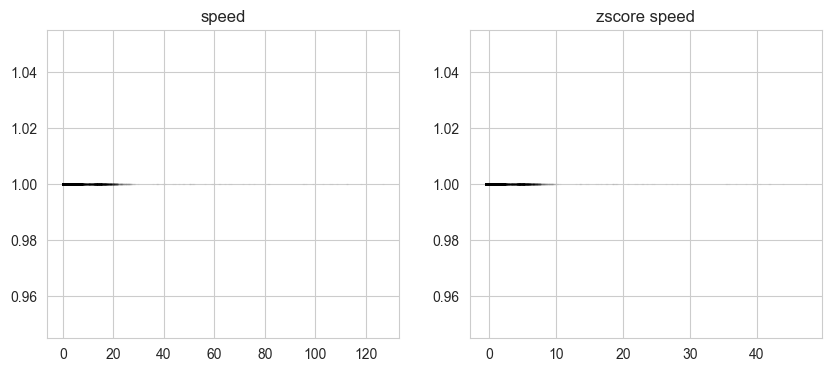

korra


100%|██████████| 15/15 [00:50<00:00,  2.20s/it]

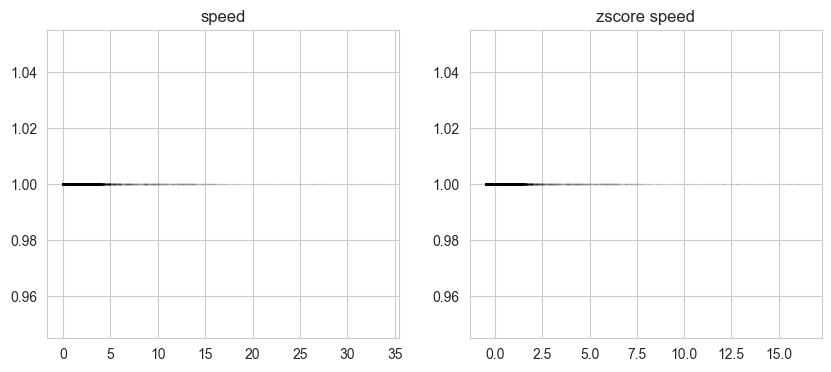

100%|██████████| 15/15 [00:50<00:00,  3.37s/it]


,animal,subdir,condition,inBox,mex,mey,lex,ley,rex,rey,bodyaxis_angle,dx,dy,speed,zscore_speed
0,khorne,../../DATA/1T/trajectories\khorne\Food_eaten\0,Food_eaten,"[False, False, False, False, False, False, Fal...","[177.72050495836032, 177.74265045203606, 177.7...","[1030.6818134346227, 1030.5089823648798, 1030....","[184.92591356861968, 185.06000055904875, 185.1...","[1036.9645717860667, 1036.6016309411318, 1036....","[170.515096348101, 170.42530034502337, 170.387...","[1024.3990550831786, 1024.4163337886278, 1024....","[-3.9952888452234117, -4.018065658848434, -4.0...","[0.022145493675736816, 0.0302663060017494, 0.0...","[-0.17283106974286966, -0.13057073757340731, -...","[0.17424408615102774, 0.13403270790913363, 0.1...","[-0.6047759850086157, -0.6249215331801199, -0...."
1,khorne,../../DATA/1T/trajectories\khorne\Food_eaten\1,Food_eaten,"[False, False, False, False, False, False, Fal...","[172.46520504288856, 172.87348025547396, 173.2...","[794.2050549319365, 794.9513244451008, 795.317...","[174.3402981154274, 174.88044956218818, 175.35...","[801.9401532438574, 802.670213173437, 803.0415...","[170.59011197034974, 170.86651094875978, 171.1...","[786.4699566200158, 787.2324357167646, 787.593...","[-3.379418534752036, -3.3959677791812353, -3.4...","[0.40827521258540855, 0.3597175149157579, 0.32...","[0.7462695131642931, 0.3662108201609726, 0.077...","[0.8506508305351449, 0.5133293828918628, 0.335...","[-0.26590213267386104, -0.43489722236962747, -..."
2,khorne,../../DATA/1T/trajectories\khorne\Food_eaten\2,Food_eaten,"[False, False, False, False, False, False, Fal...","[1583.2159682766355, 1583.3460308016245, 1583....","[168.34263804539313, 167.9496794823648, 167.70...","[1591.3266332981386, 1591.3648832035635, 1591....","[169.49840652346364, 168.96471293737693, 168.6...","[1575.1053032551326, 1575.3271783996854, 1575....","[167.1868695673226, 166.93464602735267, 166.80...","[-4.570842098848657, -4.586477723591251, -4.59...","[0.13006252498894355, 0.09542273342935914, 0.0...","[-0.3929585630283441, -0.24011327031379892, -0...","[0.41392353480298827, 0.25837933476947805, 0.1...","[-0.48469868127901816, -0.5626249626345903, -0..."
3,khorne,../../DATA/1T/trajectories\khorne\Food_eaten\3,Food_eaten,"[False, False, False, False, False, False, Fal...","[813.3132709534189, 809.3831645143719, 806.070...","[105.78128201221806, 105.85738577471176, 105.5...","[805.0911457634741, 800.6260005976815, 796.999...","[104.76748506831113, 104.60341658450436, 104.0...","[821.5353961433635, 818.1403284310621, 815.142...","[106.79507895612498, 107.11135496491914, 106.9...","[-1.4481144599391411, -1.4285696309915121, -1....","[-3.9301064390469946, -3.3121893194127097, -2....","[0.07610376249370177, -0.3132486243032133, -0....","[3.9308432180518658, 3.326969009212362, 2.8928...","[1.2772472651642344, 0.9747115776152118, 0.757..."
4,khorne,../../DATA/1T/trajectories\khorne\Food_eaten\4,Food_eaten,"[False, False, False, False, False, False, Fal...","[1424.9673597450815, 1424.765136029252, 1424.6...","[1049.7891444804675, 1049.7677190710895, 1049....","[1428.5776197738173, 1428.5276042116373, 1428....","[1044.0158797040456, 1043.991157129785, 1043.9...","[1421.3570997163456, 1421.002667846867, 1420.7...","[1055.5624092568894, 1055.5442810123939, 1055....","[0.5588445983556269, 0.5773120683804636, 0.588...","[-0.20222371582940468, -0.12675010813927656, -...","[-0.021425409378025506, -0.0075754800666345545...","[0.2033555492502425, 0.1269762883831398, 0.075...","[-0.590191397067355, -0.6284567375350691, -0.6..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266,korra,../../DATA/1T/trajectories\korra\No_food_Contr...,No_food_Control,"[False, True, True, True, True, True, True, Tr...","[399.9455565361995, 401.3393228531709, 402.405...","[833.2626320186538, 830.5283943082273, 828.320...","[400.34567051310836, 401.89683215200444, 403.0...","[839.0631771096374, 836.3474775670134, 834.134...","[399.5454425592906, 400.7818135543374, 401.739...

In [5]:
def apply_savgol_filter(x, y, window_size=29, poly_degree=5):
    """
    Apply Savitzky-Golay filter to smooth 2D pose estimation data.

    Parameters:
    - x, y: Arrays containing the x and y coordinates of the pose estimation data
    - window_size: The window size for the Savitzky-Golay filter (must be odd and >= poly_degree + 1)
    - poly_degree: The polynomial degree for the Savitzky-Golay filter

    Returns:
    - smoothed_x, smoothed_y: Arrays containing the smoothed x and y coordinates
    """

    # Check if the window size and polynomial degree are compatible
    if window_size % 2 == 0 or window_size < poly_degree + 1:
        return "Invalid window size or polynomial degree"

    # Apply Savitzky-Golay filter
    smoothed_x = savgol_filter(x, window_size, poly_degree)
    smoothed_y = savgol_filter(y, window_size, poly_degree)

    return smoothed_x, smoothed_y

def detect_outliers_statistical(x, y, window_size=5, k=2.0):
    """
    Detect outliers in 2D pose estimation data based on a moving window statistical method.

    Parameters:
    - x, y: Arrays containing the x and y coordinates of the pose estimation data
    - window_size: The window size for calculating mean and std deviation (should be odd)
    - k: The factor for defining the threshold based on std deviation

    Returns:
    - outlier_indices: List of indices where outliers are located
    """

    # Ensure window_size is odd for symmetry
    if window_size % 2 == 0:
        window_size += 1

    half_window = window_size // 2
    n = len(x)

    outlier_indices = []

    for i in range(n):
        # Define the window boundaries
        start_idx = max(0, i - half_window)
        end_idx = min(n, i + half_window + 1)

        # Extract window data
        x_window = x[start_idx:end_idx]
        y_window = y[start_idx:end_idx]

        # Calculate mean and standard deviation for x and y
        mean_x = np.mean(x_window)
        mean_y = np.mean(y_window)

        std_x = np.std(x_window)
        std_y = np.std(y_window)

        # Check if the point is an outlier
        if abs(x[i] - mean_x) > k * std_x or abs(y[i] - mean_y) > k * std_y:
            outlier_indices.append(i)

    return outlier_indices

def impute_outliers(x, y, outlier_indices):
    """
    Robustly impute outliers in 2D pose estimation data using linear interpolation between valid regions.

    Parameters:
    - x, y: Arrays containing the x and y coordinates of the pose estimation data
    - outlier_indices: List of indices where outliers are located

    Returns:
    - imputed_x, imputed_y: Arrays containing the imputed x and y coordinates
    """

    # Initialize imputed arrays with original data
    imputed_x = np.array(x)
    imputed_y = np.array(y)

    # Create a boolean mask where True indicates an outlier
    outlier_mask = np.zeros(len(x), dtype=bool)
    outlier_mask[outlier_indices] = True

    # Find valid regions in the data
    valid_regions = []
    start_idx = 0
    for i in range(1, len(x)):
        if outlier_mask[i] and not outlier_mask[i-1]:
            end_idx = i
            valid_regions.append((start_idx, end_idx))
        elif not outlier_mask[i] and outlier_mask[i-1]:
            start_idx = i

    if not outlier_mask[-1]:
        valid_regions.append((start_idx, len(x)))

    # Perform interpolation based on valid regions
    for i in range(len(valid_regions) - 1):
        start_idx1, end_idx1 = valid_regions[i]
        start_idx2, end_idx2 = valid_regions[i+1]

        interp_func_x = interp1d([end_idx1, start_idx2], [x[end_idx1-1], x[start_idx2]], kind='linear')
        interp_func_y = interp1d([end_idx1, start_idx2], [y[end_idx1-1], y[start_idx2]], kind='linear')

        imputed_x[end_idx1:start_idx2] = interp_func_x(np.arange(end_idx1, start_idx2))
        imputed_y[end_idx1:start_idx2] = interp_func_y(np.arange(end_idx1, start_idx2))

    return imputed_x, imputed_y

def given_xy_xy_get_bodyaxis_angle(x1, y1, x2, y2):
    '''
    given two points, get the angle of the body axis
    '''
    dx = x2 - x1
    dy = y2 - y1
    angle = np.arctan2(dy, dx)
    angle = angle - np.pi/2 ## shifting into image space of numpy and cv2 ##

    return np.array(angle)

window_size = 29
poly_degree = 5
bbox_x0_y0_x1_y1 = [400, 220, 1550, 965]

data = pd.DataFrame(columns = ['animal', 'subdir', 'condition', 'inBox',
                              'mex', 'mey', 'lex', 'ley', 'rex', 'rey',
                              'bodyaxis_angle', 'dx', 'dy', 'speed'])

zscores_speed = []
pbar = tqdm(total=len(animals)*len(experiments))
for animal in animals:
    print(animal)
    speeds = []
    starts = []
    stops = []
    start = 0
    stop = 0
    for experiment in experiments:
        data_dirs = glob.glob(os.path.join(data_root, animal, experiment, '*'))
        for data_dir in data_dirs:

            ffmodel_path = glob.glob(os.path.join(data_dir, '*.h5'))[0]
            ffmodel = pd.read_hdf(ffmodel_path)

            tmp = pd.DataFrame(columns = ['animal', 'subdir', 'condition', 'inBox',
                                          'mex', 'mey', 'lex', 'ley', 'rex', 'rey',
                                          'bodyaxis_angle', 'dx', 'dy', 'speed'])

            tmp['animal'] = [animal]
            tmp['subdir'] = [data_dir]
            tmp['condition'] = [experiment]

            if experiment == 'Food_eaten':
                subset_idxs = [0,1,3,4]
                tracking_cols = ffmodel.columns
            else:
                subset_idxs = [9, 10, 12, 13]
                tracking_cols = ffmodel.columns

            lex = ffmodel[tracking_cols[subset_idxs[0]]].values
            ley = ffmodel[tracking_cols[subset_idxs[1]]].values

            detected_outliers_statistical = detect_outliers_statistical(lex, ley, window_size=40, k=3.0)
            imputed_lex, imputed_ley = impute_outliers(lex, ley, detected_outliers_statistical)
            smoothed_lex, smoothed_ley = apply_savgol_filter(imputed_lex, imputed_ley,
                                                             window_size=window_size, poly_degree=poly_degree)

            rex = ffmodel[tracking_cols[subset_idxs[2]]].values
            rey = ffmodel[tracking_cols[subset_idxs[3]]].values

            detected_outliers_statistical = detect_outliers_statistical(rex, rey, window_size=40, k=3.0)
            imputed_rex, imputed_rey = impute_outliers(rex, rey, detected_outliers_statistical)
            smoothed_rex, smoothed_rey = apply_savgol_filter(imputed_rex, imputed_rey,
                                                             window_size=window_size, poly_degree=poly_degree)

            #bodyaxis_angle = given_xy_xy_get_bodyaxis_angle(lex, ley, rex, rey)
            bodyaxis_angle = given_xy_xy_get_bodyaxis_angle(smoothed_lex, smoothed_ley, smoothed_rex, smoothed_rey)

            mex = (smoothed_lex + smoothed_rex)/2
            mey = (smoothed_ley + smoothed_rey)/2

            dx = np.diff(mex)
            dy = np.diff(mey)

            speed = np.sqrt(dx**2 + dy**2)
            speeds += list(speed)
            starts.append(start)
            stop += len(speed)
            stops.append(stop)
            start = stop

            tmp['mex'] = [mex[:-1]]
            tmp['mey'] = [mey[:-1]]
            tmp['lex'] = [smoothed_lex[:-1]]
            tmp['ley'] = [smoothed_ley[:-1]]
            tmp['rex'] = [smoothed_rex[:-1]]
            tmp['rey'] = [smoothed_rey[:-1]]
            tmp['bodyaxis_angle'] = [bodyaxis_angle[:-1]]
            tmp['dx'] = [dx]
            tmp['dy'] = [dy]
            tmp['speed'] = [speed]

            inBox = []
            for x, y in zip(mex, mey):
               if bbox_x0_y0_x1_y1[0] < x < bbox_x0_y0_x1_y1[2] and bbox_x0_y0_x1_y1[1] < y < bbox_x0_y0_x1_y1[3]:
                   inBox.append(True)
               else:
                   inBox.append(False)
            tmp['inBox'] = [inBox[:-1]]

            data = pd.concat([data, tmp], ignore_index=True)
        pbar.update(1)

    zscore_speed = zscore(speeds)

    ## plot all speed all zscore for animal
    fig, ax = plt.subplots(1, 2, figsize=(10, 4))

    ax[0].scatter(speeds, np.ones_like(speeds), s=1, color='k', alpha=0.01)
    ax[0].set_title('speed')

    ax[1].scatter(zscore_speed, np.ones_like(zscore_speed), s=1, color='k', alpha=0.01)
    ax[1].set_title('zscore speed')

    plt.show(fig)
    plt.close(fig)

    for i, (start, stop) in enumerate(zip(starts, stops)):
        zscores_speed.append(zscore_speed[start:stop])

pbar.close()

data['zscore_speed'] = zscores_speed

data


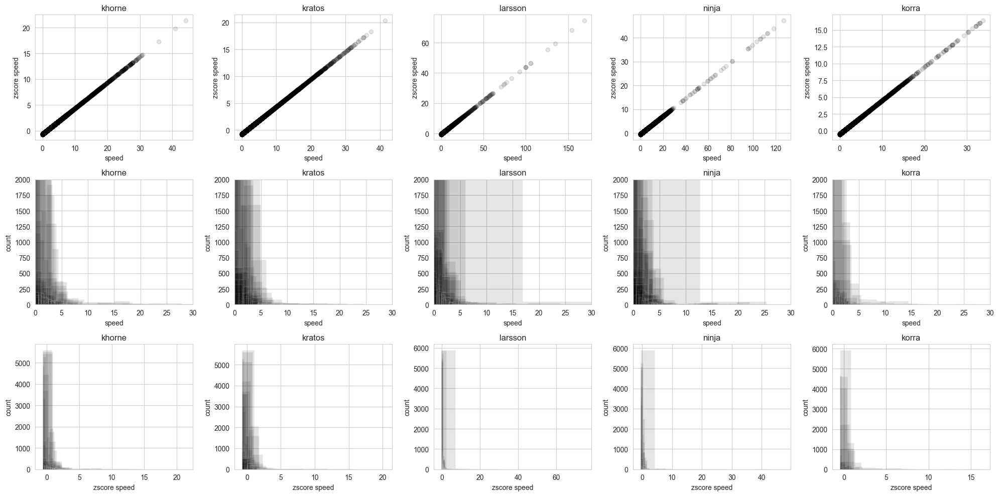

In [6]:

fig, axs = plt.subplots(3, len(animals), figsize=(20, 10))

## plot speed vs zscore speed
for i, animal in enumerate(animals):
    ax = axs[0, i]
    tmp = data[data['animal'] == animal]

    for row in tmp.iterrows():
        ax.scatter(row[1]['speed'], row[1]['zscore_speed'], color='k', alpha=0.1)

    ax.set_title(animal)
    ax.set_xlabel('speed')
    ax.set_ylabel('zscore speed')

## plot speed distributions
for i, animal in enumerate(animals):
    ax = axs[1, i]
    tmp = data[data['animal'] == animal]

    for row in tmp.iterrows():
        ax.hist(row[1]['speed'], color='k', alpha=0.1)

    ax.set_title(animal)
    ax.set_xlabel('speed')
    ax.set_ylabel('count')

    ax.set_ylim(0, 2000)
    ax.set_xlim(0, 30)

## plot zscore speed distributions
for i, animal in enumerate(animals):
    ax = axs[2, i]
    tmp = data[data['animal'] == animal]

    for row in tmp.iterrows():
        ax.hist(row[1]['zscore_speed'], color='k', alpha=0.1)

    ax.set_title(animal)
    ax.set_xlabel('zscore speed')
    ax.set_ylabel('count')

fig.tight_layout()

plt.show()
plt.close()

getting animal radius:   0%|          | 0/5 [00:00<?, ?it/s]

khorne
mean frames already exists
mean frames shape: (600, 600)
threshold: 28
mask shape: (600, 600)
labels shape: (600, 600)
props shape: 1
minr: 248, minc: 269, maxr: 340, maxc: 331
box: [[248, 269], [248, 300.0], [248, 331], [294.0, 269], [294.0, 331], [340, 269], [340, 300.0], [340, 331]]
radius: 66.59316781772738
saving figure to ../../DATA/1T/trajectories\khorne\mean_frames_plotkhorne.png


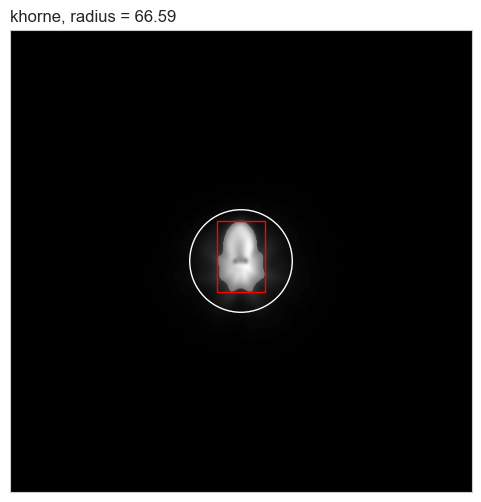

getting animal radius:  20%|██        | 1/5 [00:00<00:02,  1.67it/s]

saving image to ../../DATA/1T/trajectories\khorne\mean_frames_khorne.png
kratos
mean frames already exists
mean frames shape: (600, 600)
threshold: 29
mask shape: (600, 600)
labels shape: (600, 600)
props shape: 1
minr: 236, minc: 256, maxr: 357, maxc: 344
box: [[236, 256], [236, 300.0], [236, 344], [296.5, 256], [296.5, 344], [357, 256], [357, 300.0], [357, 344]]
radius: 85.43254649136945
saving figure to ../../DATA/1T/trajectories\kratos\mean_frames_plotkratos.png


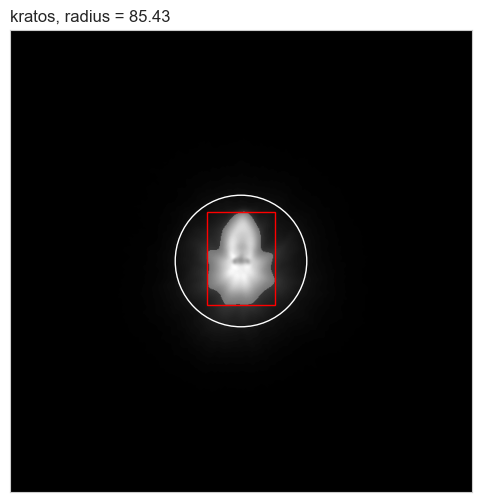

getting animal radius:  40%|████      | 2/5 [00:01<00:02,  1.38it/s]

saving image to ../../DATA/1T/trajectories\kratos\mean_frames_kratos.png
larsson
mean frames already exists
mean frames shape: (600, 600)
threshold: 22
mask shape: (600, 600)
labels shape: (600, 600)
props shape: 1
minr: 262, minc: 274, maxr: 340, maxc: 326
box: [[262, 274], [262, 300.0], [262, 326], [301.0, 274], [301.0, 326], [340, 274], [340, 300.0], [340, 326]]
radius: 52.478185944256886
saving figure to ../../DATA/1T/trajectories\larsson\mean_frames_plotlarsson.png


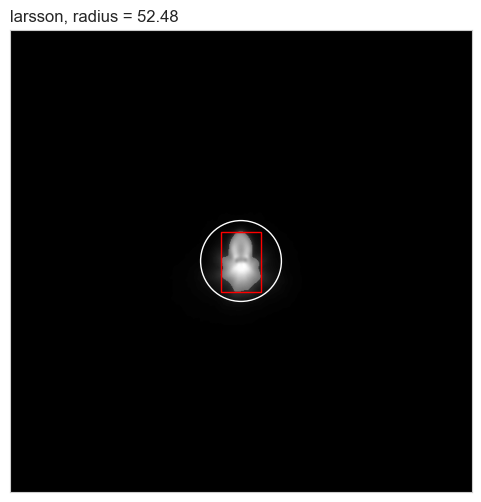

getting animal radius:  60%|██████    | 3/5 [00:02<00:01,  1.33it/s]

saving image to ../../DATA/1T/trajectories\larsson\mean_frames_larsson.png
ninja
mean frames already exists
mean frames shape: (600, 600)
threshold: 25
mask shape: (600, 600)
labels shape: (600, 600)
props shape: 1
minr: 240, minc: 251, maxr: 368, maxc: 347
box: [[240, 251], [240, 299.0], [240, 347], [304.0, 251], [304.0, 347], [368, 251], [368, 299.0], [368, 347]]
radius: 92.19680037832116
saving figure to ../../DATA/1T/trajectories\ninja\mean_frames_plotninja.png


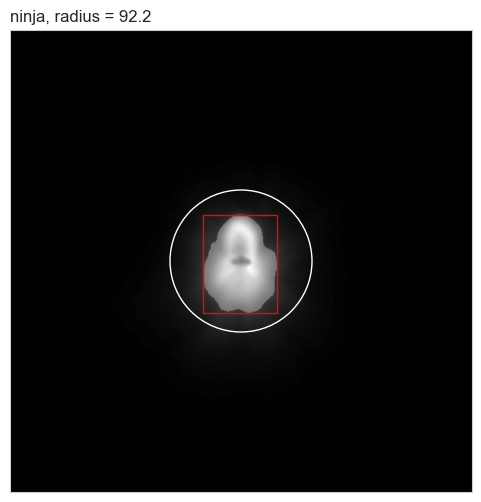

getting animal radius:  80%|████████  | 4/5 [00:03<00:00,  1.23it/s]

saving image to ../../DATA/1T/trajectories\ninja\mean_frames_ninja.png
korra
mean frames already exists
mean frames shape: (600, 600)
threshold: 35
mask shape: (600, 600)
labels shape: (600, 600)
props shape: 1
minr: 263, minc: 278, maxr: 335, maxc: 328
box: [[263, 278], [263, 303.0], [263, 328], [299.0, 278], [299.0, 328], [335, 278], [335, 303.0], [335, 328]]
radius: 51.0404741357288
saving figure to ../../DATA/1T/trajectories\korra\mean_frames_plotkorra.png


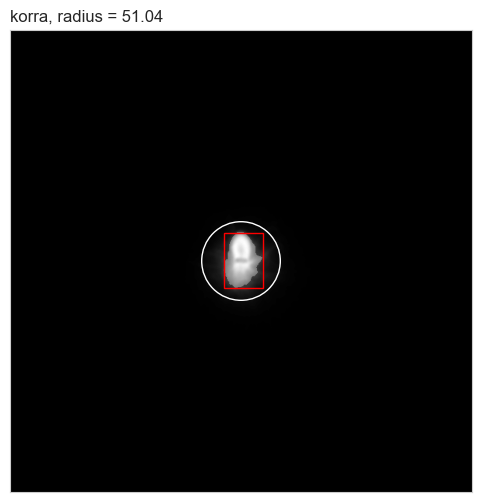

getting animal radius: 100%|██████████| 5/5 [00:03<00:00,  1.34it/s]

saving image to ../../DATA/1T/trajectories\korra\mean_frames_korra.png


In [7]:
def given_a_xy_crop_img (img, x_value, y_value, crop_size):

    img_dimensions = img.shape

    #x,y value minus half of the crop size gives upper right
    x = int((x_value) - crop_size/2)
    y = int((y_value) - crop_size/2)

    xr, yr = x,y

    #checks if x + crop_size falls outside of the image being cropped
    if x + crop_size < img_dimensions[1]:
        #x + crop falls within the image, no problem x_c = x + crop_size
        x_c = x + crop_size
    else:
        #x + crop falls outside the image so we need to limit x_c at the edge of the image
        x_c = img_dimensions[1]

    #same logic as above
    if y + crop_size < img_dimensions[0]:
        y_c = y + crop_size
    else:
        y_c = img_dimensions[0]

    #if x < 0 that means x falls outside of the image on the negative side, so we set to zero
    if x < 0:
        x = 0
    #same logic as above
    if y < 0:
        y = 0

    #crop the image out of the big image
    #starts at (x,y) goes to (x_c,y_c)
    crop_img = img[y:y_c, x:x_c]

    #makes a black background
    cropped_image = np.zeros((crop_size,crop_size),np.uint8)

    #puts the cropped image on top of the black background keeping center point of octopus eyes centered
    #x - xr gives the distances from the top left corner of the black background the paste is placed in
    #x_c - xr gives the distance from the bottom left corner of the black background the paste is placed in
    cropped_image[int(y - yr):int(y_c - yr),
                  int(x - xr):int(x_c - xr)] = crop_img

    return cropped_image

def rotate_image(image, angle):
    # Get image height and width
    (h, w) = image.shape[:2]

    # Define the center of the image
    center = (w / 2, h / 2)

    # Perform the rotation
    angle = np.rad2deg(angle) - 90
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), borderMode=cv2.BORDER_CONSTANT, borderValue=0)

    return rotated

radius_scalar = 1.1
animal_radius_key = {}
crop_width = 600
center = (int(crop_width/2), int(crop_width/2))

rerun = False

mean_images_by_animal = {animal:[] for animal in animals}

pbar = tqdm(total=len(animals), desc='getting animal radius', position=0, leave=True)
for animal in animals:
    print(animal)

    name_mean_frames_image = 'mean_frames_' + animal + '.png'
    path_mean_frames_image = os.path.join(data_root, animal, name_mean_frames_image)
    name_std_frames_image = 'std_frames_' + animal + '.png'
    path_std_frames_image = os.path.join(data_root, animal, name_std_frames_image)

    if os.path.exists(path_mean_frames_image) != True or os.path.exists(path_std_frames_image) != True or rerun == True:

        frames = []
        tmp = data[data['animal'] == animal]
        vbar = tqdm(total=tmp.shape[0], desc='getting animal radius', position=1, leave=True)
        for row in tmp.iterrows():
            subdir = row[1]['subdir']
            path_video = os.path.join(subdir, 'background_sub_ff_video.mp4')
            # print('\t', m, 'of', tmp.shape[0], path_video)

            cap = cv2.VideoCapture(path_video)
            tmp_frames = []
            for i in range(int(cap.get(cv2.CAP_PROP_FRAME_COUNT))):
                ret, frame = cap.read()
                if ret:
                    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
                    tmp_frames.append(frame)
                else:
                    print(i, 'failed to read frame', path_video, 'breaking')
                    break
            cap.release()

            mex = row[1]['mex']
            mey = row[1]['mey']
            inBox = row[1]['inBox']
            angles = row[1]['bodyaxis_angle']

            rotated_video = cv2.VideoWriter(os.path.join(subdir, 'rotated_bg_sub_fc_video.mp4'),
                                            cv2.VideoWriter_fourcc(*'mp4v'),
                                            10,
                                            (crop_width, crop_width), isColor=False)

            n = 0
            for x, y, ib, angle in list(zip(mex, mey, inBox, angles)):
                x = int(x)
                y = int(y)
                frame = tmp_frames[n]
                frame = given_a_xy_crop_img(frame, x, y, crop_width)
                frame = rotate_image(frame, angle)
                if ib:
                    frames.append(frame)
                rotated_video.write(frame)
                n += 1
            vbar.update(1)

            rotated_video.release()

        vbar.close()

        frames = np.array(frames)
        print(f'frames shape: {frames.shape}')
        mean_frames = np.mean(frames, axis=0)
        mean_images_by_animal[animal].append(mean_frames)
        print(f'mean frames shape: {mean_frames.shape}')

        std_frames = np.std(frames, axis=0)
        cv2.imwrite(path_std_frames_image, std_frames)
    else:
        print('mean frames already exists')
        mean_frames = cv2.imread(path_mean_frames_image, cv2.IMREAD_GRAYSCALE)
        mean_images_by_animal[animal].append(mean_frames)
        print(f'mean frames shape: {mean_frames.shape}')

    fig, ax = plt.subplots(1,1, figsize=(6,6))

    ax.imshow(mean_frames, cmap='gray', zorder = 0)

    threshold = filters.threshold_otsu(mean_frames)
    print(f'threshold: {threshold}')
    mask = mean_frames > threshold
    mean_images_by_animal[animal].append(mask)
    print(f'mask shape: {mask.shape}')

    ax.imshow(mask, cmap='gray', alpha=0.25, zorder = 1)

    labels = measure.label(mask)
    print(f'labels shape: {labels.shape}')
    props = measure.regionprops(labels)
    mean_images_by_animal[animal].append(props)
    print(f'props shape: {len(props)}')
    minr, minc, maxr, maxc = props[0].bbox
    print(f'minr: {minr}, minc: {minc}, maxr: {maxr}, maxc: {maxc}')
    rect = patches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                                  fill=False, edgecolor='red', linewidth=1, zorder = 2)
    ax.add_patch(rect)
    max_dist = 0
    box = [[minr, minc], [minr, (maxc+minc)/2], [minr, maxc],
           [(minr+maxr)/2, minc], [(minr+maxr)/2, maxc],
           [maxr, minc], [maxr, (maxc+minc)/2], [maxr, maxc]]
    print(f'box: {box}')
    box=np.array(box)
    for p in box:
      d = ((center[0]-p[0])**2 + (center[1]-p[1])**2)**(1/2)
      if d > max_dist:
        max_dist = d
    r = max_dist*radius_scalar
    print(f'radius: {r}')
    circ = patches.Circle(center, radius=r, color='white', fill=False, linewidth=1, zorder = 2)
    animal_radius_key[animal] = r

    ax.add_patch(circ)

    ax.set_xlim(0, crop_width)
    ax.set_ylim(crop_width, 0)

    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')

    ax.set_title(f'{animal}, radius = {round(r,2)}', loc='left')

    name_fig = 'mean_frames_plot' + animal + '.png'
    path_fig = os.path.join(data_root, animal, name_fig)
    print(f'saving figure to {path_fig}')

    fig.savefig(path_fig, dpi=300)

    plt.show(fig)
    plt.close(fig)

    print(f'saving image to {path_mean_frames_image}')

    cv2.imwrite(path_mean_frames_image, mean_frames)

    pbar.update(n=1)
pbar.close()



In [8]:
import json

path_animal_radius_key = os.path.join(target_dir, 'animal_radius_key')
print(f'saving animal radius key to {path_animal_radius_key}')

with open(path_animal_radius_key , 'w') as json_file:
    json.dump(animal_radius_key, json_file)

animal_radius_key

saving animal radius key to ../../DATA/1T\animal_radius_key


{'khorne': 66.59316781772738,
 'kratos': 85.43254649136945,
 'larsson': 52.478185944256886,
 'ninja': 92.19680037832116,
 'korra': 51.0404741357288}

making the figure of the mean images for the shell algorithm


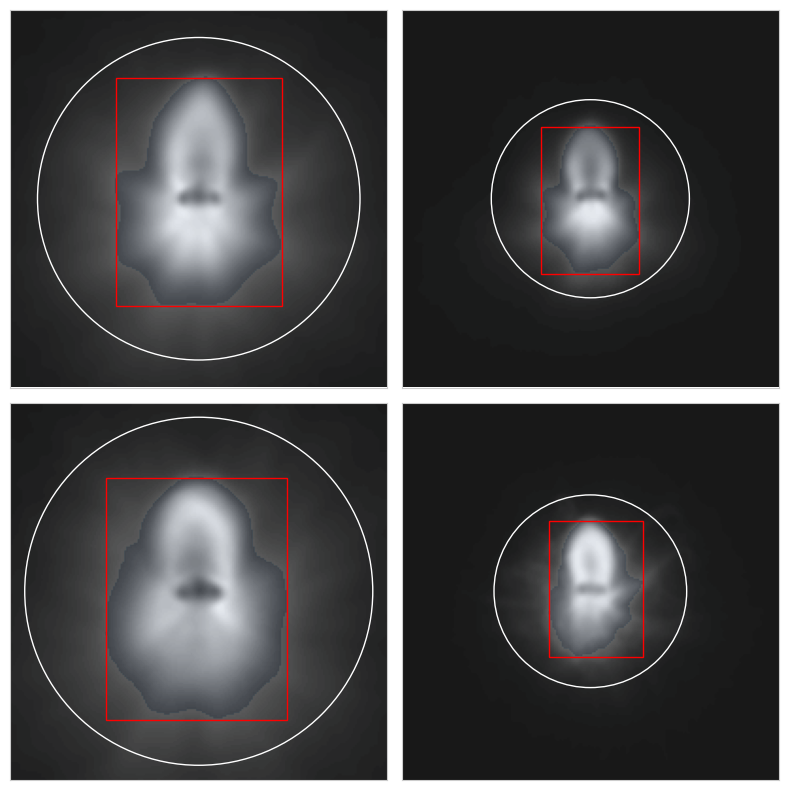

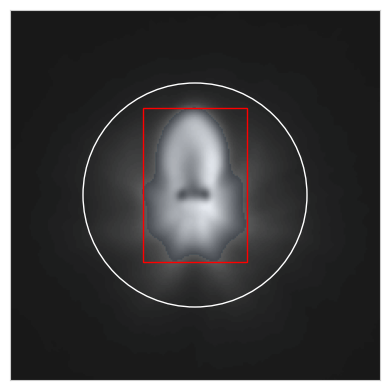

In [9]:
print('making the figure of the mean images for the shell algorithm')

fig, axs = plt.subplots(2,2, figsize=(8,8))

for i, animal in enumerate(animals[1:]):
    ax = axs.flatten()[i]
    ax.imshow(mean_images_by_animal[animal][0], cmap='gray', zorder=0)
    ax.imshow(mean_images_by_animal[animal][1], cmap='Blues', alpha=0.1, zorder=1)
    ## plot box
    minr, minc, maxr, maxc = mean_images_by_animal[animal][2][0].bbox
    rect = patches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                                  fill=False, edgecolor='red', linewidth=1, zorder = 2)
    ax.add_patch(rect)
    ## plot circle
    center = (crop_width/2, crop_width/2)
    r = animal_radius_key[animal]
    circ = patches.Circle(center, radius=r, color='white', fill=False, linewidth=1, zorder = 2)
    ax.add_patch(circ)

    ## plot text
    #ax.text(0.5, 0.05, f'Radius = {round(r/20 * 2.54,2)} cm', horizontalalignment='center',
    #        verticalalignment='center', transform=ax.transAxes, color='white', fontsize=12)

    #ax.set_title(animal)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    lim = 100
    ax.set_xlim(crop_width/2-lim, crop_width/2+lim)
    ax.set_ylim(crop_width/2+lim, crop_width/2-lim)
    ax.set_aspect('equal')

name_fig = 'normalized_octopus_metrics_1on.png'
path_fig = os.path.join(data_root, name_fig)

fig.tight_layout()

fig.savefig(path_fig, dpi=300)

plt.show(fig)
plt.close(fig)

####

fig, axs = plt.subplots(1,1, figsize=(4,4))

for i, animal in enumerate(animals[:1]):
    ax = axs
    ax.imshow(mean_images_by_animal[animal][0], cmap='gray', zorder=0)
    ax.imshow(mean_images_by_animal[animal][1], cmap='Blues', alpha=0.1, zorder=1)
    ## plot box
    minr, minc, maxr, maxc = mean_images_by_animal[animal][2][0].bbox
    rect = patches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                                  fill=False, edgecolor='red', linewidth=1, zorder = 2)
    ax.add_patch(rect)
    ## plot circle
    center = (crop_width/2, crop_width/2)
    r = animal_radius_key[animal]
    circ = patches.Circle(center, radius=r, color='white', fill=False, linewidth=1, zorder = 2)
    ax.add_patch(circ)

    ## plot text
    #ax.text(0.5, 0.05, f'Radius = {round(r/20 * 2.54,2)} cm', horizontalalignment='center',
    #        verticalalignment='center', transform=ax.transAxes, color='white', fontsize=12)

    #ax.set_title(animal)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    lim = 110
    ax.set_xlim(crop_width/2-lim, crop_width/2+lim)
    ax.set_ylim(crop_width/2+lim, crop_width/2-lim)
    ax.set_aspect('equal')

name_fig = 'normalized_octopus_metrics_1.png'
path_fig = os.path.join(data_root, name_fig)

fig.tight_layout()

fig.savefig(path_fig, dpi=300)

plt.show(fig)
plt.close(fig)

In [10]:
data.columns

Index(['animal', 'subdir', 'condition', 'inBox', 'mex', 'mey', 'lex', 'ley',
       'rex', 'rey', 'bodyaxis_angle', 'dx', 'dy', 'speed', 'zscore_speed'],
      dtype='object')

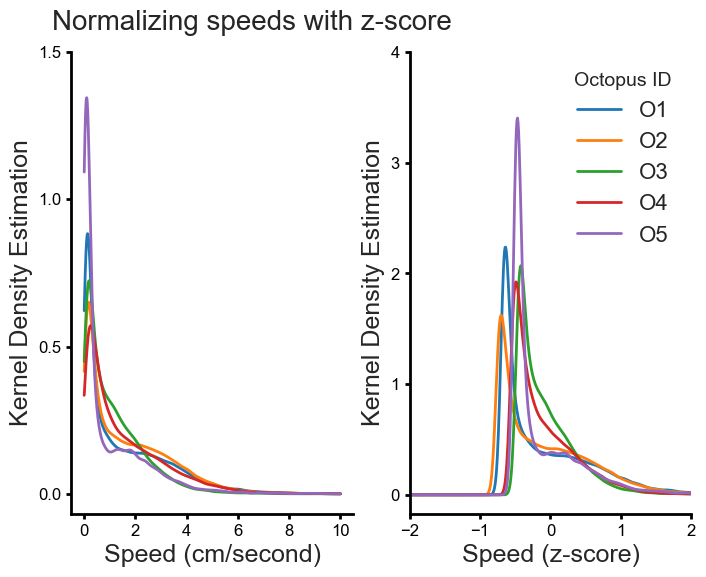

In [11]:
from scipy.stats import gaussian_kde

fig, axs = plt.subplots(1,2, figsize=(8, 6))

## speeds ##
ax = axs[0]
for animal in animals:
    speed = data[data['animal'] == animal]['speed'].values
    speed = (np.concatenate(speed)/20)*10*2.54

    density = gaussian_kde(speed, bw_method=0.05)
    xs = np.linspace(0,10,1000)

    ax.plot(xs, density(xs), linewidth=2)

ax.set_xlabel('Speed (cm/second)', fontsize=18)
ax.set_ylabel('Kernel Density Estimation', fontsize=18)

ax.get_xaxis().set_major_formatter(plt.ScalarFormatter())  # Display as scalar numbers
ax.tick_params(axis='both', which='major', labelsize=12)

yticks = [0.0, 0.5, 1.0, 1.5]
ax.set_yticks(yticks)

xticks = [0, 2, 4, 6, 8, 10]
ax.set_xticks(xticks)

ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True)
ax.tick_params(axis='y', which='both', left=True, right=False, labelleft=True)
## make the ticks markers thicker
ax.tick_params(axis='x', width=2, colors='black')
ax.tick_params(axis='y', width=2, colors='black')

for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2)
    ax.spines[axis].set_color('black')

## speed zscores ##
ax = axs[1]
for animal in animals:
    zscore_speed = data[data['animal'] == animal]['zscore_speed'].values
    zscore_speed = np.concatenate(zscore_speed)

    density = gaussian_kde(zscore_speed, bw_method=0.05)
    xs = np.linspace(-4,4,1000)

    ax.plot(xs, density(xs), label=animal_codes_dict[animal], linewidth=2)

ax.set_xlabel('Speed (z-score)', fontsize=18)
ax.set_ylabel('Kernel Density Estimation', fontsize=18)

ax.get_xaxis().set_major_formatter(plt.ScalarFormatter())  # Display as scalar numbers
ax.tick_params(axis='both', which='major', labelsize=12)

yticks = [0.0, 1.0, 2.0, 3.0, 4.0]
ax.set_yticks(yticks)

xticks = [-2, -1, 0, 1, 2]
ax.set_xticks(xticks)

ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True)
ax.tick_params(axis='y', which='both', left=True, right=False, labelleft=True)
## make the ticks markers thicker
ax.tick_params(axis='x', width=2, colors='black')
ax.tick_params(axis='y', width=2, colors='black')

for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2)
    ax.spines[axis].set_color('black')

# Legend
ax.legend(fontsize=16, loc='upper right', frameon=False, title = 'Octopus ID', title_fontsize=14)

# Log scale on x-axis
#ax.set_xscale('log')

ax.set_xlim(-2,2)

## set super title in top left corner
fig.suptitle('Normalizing speeds with z-score', fontsize=20, x=0.35, y=0.95)

# Saving
name_fig = 'speed_zscore_distributions.png'
fig.savefig(os.path.join(target_dir, name_fig), dpi=300, bbox_inches='tight')  # bbox_inches ensures legend isn't cut off

# Display
plt.show(fig)
plt.close(fig)

checking that the speed z-score was computed correctly


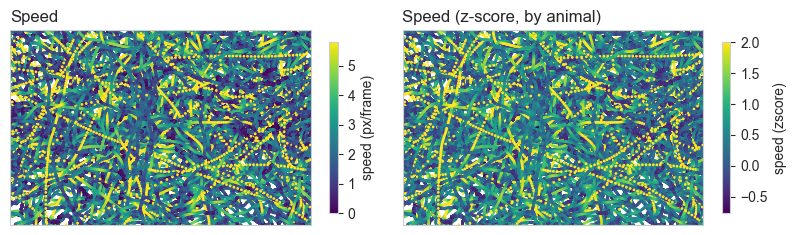

In [12]:
print('checking that the speed z-score was computed correctly')

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(8,6))

ax = ax1
c = data['speed'].values
c = np.concatenate(c)
x = data['mex'].values
x = np.concatenate(x)
y = data['mey'].values
y = np.concatenate(y)

g = ax.scatter(x, y, c=c, cmap='viridis', s=1, vmin=0, vmax=(np.mean(c)+np.std(c)*2))
cbar = fig.colorbar(g, ax=ax, label='speed (px/frame)', shrink=0.3)

ax.set_aspect('equal')

ax.set_xlim([400, 1550])
ax.set_ylim([965, 220])
ax.set_yticks([])
ax.set_xticks([])

ax.set_title('Speed', loc='left')

ax=ax2
c = data['zscore_speed'].values
c = np.concatenate(c)

g = ax.scatter(x, y, c=c, cmap='viridis', s=1, vmin=np.min(c), vmax=2)
fig.colorbar(g, ax=ax, label='speed (zscore)', shrink=0.3)

ax.set_aspect('equal')

ax.set_xlim([400, 1550])
ax.set_ylim([965, 220])
ax.set_yticks([])
ax.set_xticks([])

ax.set_title('Speed (z-score, by animal)', loc='left')

fig.tight_layout()

name_fig = 'speed_scatter.png'
fig.savefig(os.path.join(target_dir, name_fig), dpi=300)

plt.show(fig)
plt.close(fig)


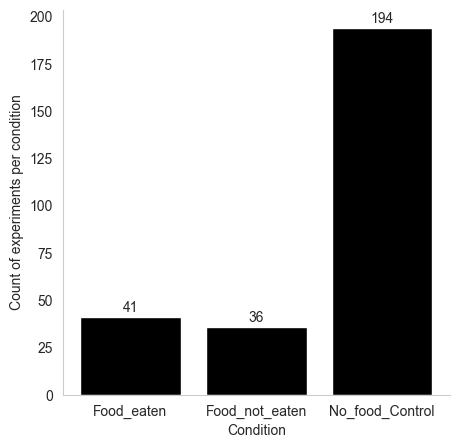

In [13]:
## make bar plot of condition counts

fig, ax = plt.subplots(1,1, figsize=(5,5))

conditions = ['Food_eaten', 'Food_not_eaten', 'No_food_Control']
counts = [len(data[data['condition'] == c]) for c in conditions]

ax.bar(conditions, counts, color='k')

# Remove grid
ax.grid(False)

## add text with count to the top of each bar
for i, c in enumerate(conditions):
    ax.text(i, counts[i]+5, str(counts[i]), ha='center', va='center')

ax.set_ylabel('Count of experiments per condition')
ax.set_xlabel('Condition')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

name_fig = 'condition_counts.png'
fig.savefig(os.path.join(target_dir, name_fig), dpi=300)

plt.show(fig)
plt.close(fig)

plotting the positional data for each animal in each condition


C:\Users\wlwee\AppData\Local\Temp\ipykernel_23652\1979174765.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


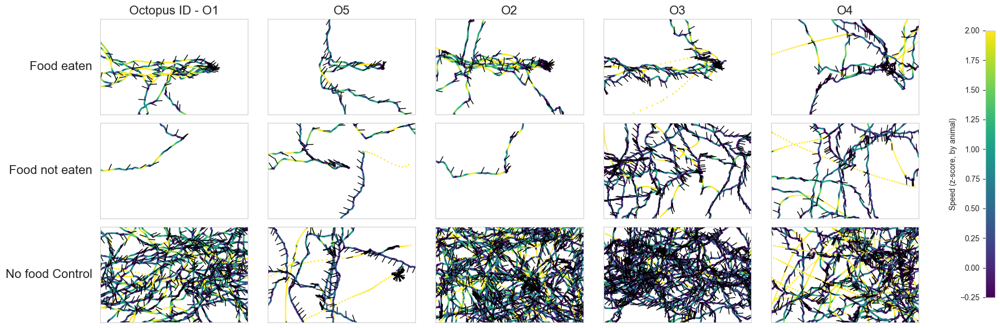

In [62]:
print('plotting the positional data for each animal in each condition')

nrows = len(conditions)
ncols = len(animals)

subset_angles = 40 ## plot every nth angle as a hair coming out of mex,mey
angle_scalar = 50 ## scale the length of the hair by this amount

fig, axs = plt.subplots(nrows, ncols, figsize=(ncols*3.4, nrows*2))

for i, condition in enumerate(conditions):
    for j, animal in enumerate(animals):
        ax=axs[i,j]
        tmp = data[(data['condition'] == condition) & (data['animal'] == animal)]

        mex = tmp['mex'].values
        mex = np.concatenate(mex)
        mey = tmp['mey'].values
        mey = np.concatenate(mey)

        c = tmp['zscore_speed'].values
        c = np.concatenate(c)

        angles = tmp['bodyaxis_angle'].values
        angles = np.concatenate(angles)

        g = ax.scatter(mex, mey, c=c, cmap='viridis', s=1, vmin=-0.25, vmax=2)

        for x, y, angle in zip(mex[::subset_angles], mey[::subset_angles], angles[::subset_angles]):
            dx = np.cos(angle)*angle_scalar
            dy = np.sin(angle)*angle_scalar
            ax.plot([x, x+dx], [y, y+dy], color='black', linewidth=1)

        ax.set_aspect('equal')
        ax.set_xlim([400, 1550])
        ax.set_ylim([965, 220])
        ax.set_yticks([])
        ax.set_xticks([])

        if j == 0:
            ylabel = condition.split('_')
            ylabel = ' '.join(ylabel)
            ax.set_ylabel(ylabel, rotation=0, ha='right', va='center', labelpad=10, fontsize=16)
        if i == 0:
            if j == 0:
                ax.set_title('Octopus ID - ' + animal_codes_dict[animal], loc='center', fontsize=16)
            else:
                ax.set_title(animal_codes_dict[animal], loc='center', fontsize=16)

## add cbar that is the height of all the subplots to the far right of the plot
cax = fig.add_axes([1.05, 0.1, 0.01, 0.8])
cbar = fig.colorbar(g, cax=cax, label='Speed (z-score, by animal)')
cbar.ax.yaxis.set_ticks_position('left')
cbar.ax.yaxis.set_label_position('left')

fig.tight_layout()

name_fig = 'speed_scatter_by_condition_and_animal.png'
fig.savefig(os.path.join(target_dir, name_fig), dpi=300, bbox_inches='tight')

plt.show(fig)
plt.close(fig)

In [15]:
path_plume_video = '../../DATA/1T/plume_bgsub_nozzleheight_1in_100ke_30g_10fps_01.mp4'

video = cv2.VideoCapture(path_plume_video)

frames = []
while True:
    ret, frame = video.read()
    if ret:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        frames.append(frame)
    else:
        break
frames = np.array(frames[700:])

video.release()

In [16]:
frames.shape, frames.dtype, frames.min(), frames.max()

((1100, 1200, 1920), dtype('uint8'), 0, 255)

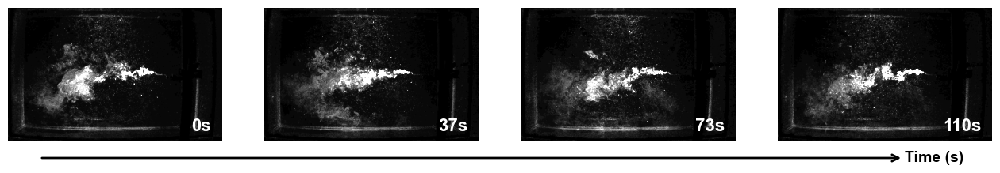

In [17]:

nrows = 1
ncols = 4

fig, axs = plt.subplots(nrows, ncols, figsize=(ncols*4, nrows*4))

for i, frame_idx in enumerate(np.linspace(0, len(frames)-1, ncols).astype(int)):
    ax = axs[i]

    frame = frames[frame_idx].copy()

    ax.imshow(frame, cmap='Greys_r', vmin=0, vmax=np.mean(frame)+3*np.std(frame))
    ## add frame number as text to bottom right corner of image
    ax.text(0.95, 0.05, f'{round(frame_idx/10)}s', transform=ax.transAxes, color='white', ha='right', va='bottom', fontsize=16, weight='bold')

    ax.axis('off')

# Create an arrow
arrow_start = (0.15, 0.25)
arrow_end = (0.83, 0.25)
arrow = FancyArrowPatch(arrow_start, arrow_end, mutation_scale=15,
                        arrowstyle='->', color='black', transform=fig.transFigure, clip_on=False,
                        linewidth=2)

# Add arrow to the figure
fig.patches.append(arrow)

# Add 't' text at the end of the arrow
fig.text(arrow_end[0] + 0.001, arrow_end[1], 'Time (s)', ha='left', va='center', transform=fig.transFigure, fontsize=14, color='black', weight='bold')

# Adjust the bottom margin to make space for the arrow
fig.subplots_adjust(bottom=0.15)

plt.show()

In [18]:
frames_std = np.std(frames[::], axis=0)
vmax = np.mean(frames_std) + 10*np.std(frames_std)
vmax

66.80840872894927

Food radius: 110.23622047244095 pixels, 14 cm
Food location: (1304.6081153565065, 580.9013324136313)


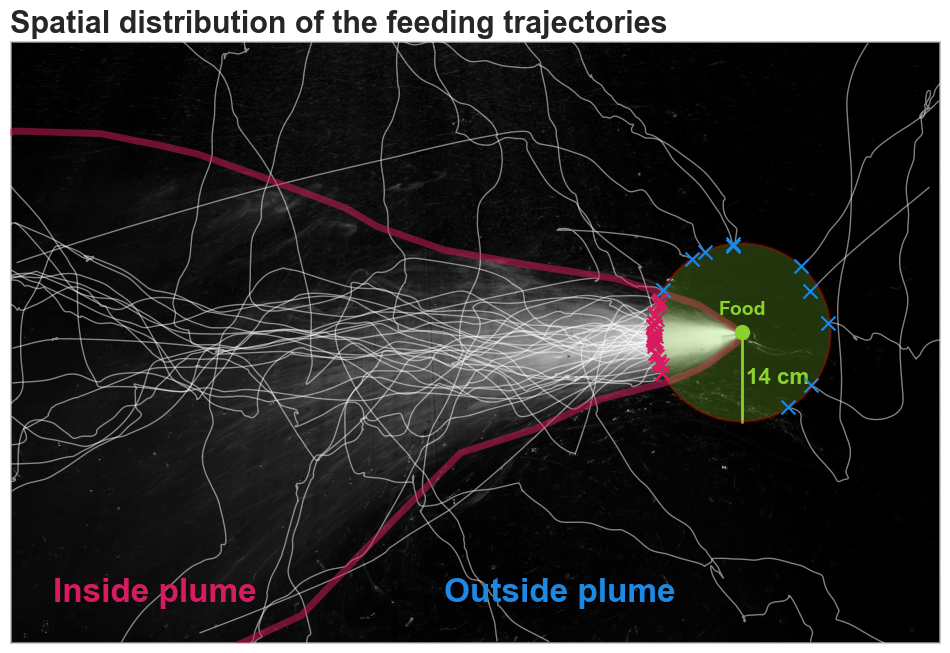

In [19]:
def find_crossing_index(mex, mey, plume_vertices, food_location, food_radius):
    """
    Find the index where mex, mey cross into the food_circle.

    Parameters:
    - mex, mey: Arrays of x and y coordinates
    - plume_vertices: Vertices defining the plume_polygon
    - food_location: (x, y) location of the food

    Returns:
    - index: Index of the crossing point in the mex, mey arrays. Returns None if no crossing found.
    - in_plume: Boolean indicating if the crossing point is in the plume. Returns None if no crossing found.
    """
    for idx, (x, y) in enumerate(zip(mex, mey)):
        dist_to_center = (x - food_location[0])**2 + (y - food_location[1])**2
        if dist_to_center < food_radius**2:
            path = Path(plume_vertices)
            in_plume = path.contains_point((x, y))
            return int(idx), in_plume

    return None, None

crossing_color_key = {'in_plume': '#D81B60', 'out_plume': '#1E88E5', 'food_circle': '#8AD22D'}

path_plume_polygon = '../../DATA/1T/plume_polygon.csv'

dat_polygon = pd.read_csv(path_plume_polygon)

x_verts = np.array(dat_polygon['axis-1'].tolist())
y_verts = np.array(dat_polygon['axis-0'].tolist())


xlim = (400, 1550)
ylim = (220, 965)

plume_vertices = np.stack([x_verts, y_verts], axis=1)

fig, ax = plt.subplots(1, 1, figsize=(12, 12))

ax.imshow(frames_std, cmap='Greys_r', zorder=1, vmax=100)

poly = plt.Polygon(plume_vertices, facecolor='none', edgecolor='#D81B60', linewidth=5, alpha=0.5, zorder=3)
ax.add_patch(poly)

idx_highest = np.argmax(plume_vertices[:, 1])
ax.text(plume_vertices[idx_highest, 0]+90,
        plume_vertices[idx_highest, 1]-130,
        'Inside plume', color=crossing_color_key['in_plume'], ha='center', va='bottom', fontsize=24, weight='bold')

ax.text(plume_vertices[idx_highest, 0]+590,
        plume_vertices[idx_highest, 1]-130,
        'Outside plume', color=crossing_color_key['out_plume'], ha='center', va='bottom', fontsize=24, weight='bold')

ax.plot([xlim[0], xlim[1], xlim[1], xlim[0], xlim[0]], [ylim[0], ylim[0], ylim[1], ylim[1], ylim[0]], color='grey', linewidth=2, zorder=2)
## add text to the bottom right of the plotted rectangle
#ax.text(xlim[1]-40, ylim[1]-25, 'In the open', color='white', ha='right', va='bottom', fontsize=14, weight='bold')

ax.grid(color='white')
ax.set_aspect('equal')

ax.set_xticks([])
ax.set_yticks([])

## find the coordinates of the furthest right vertice of the polygon
idx_right = np.argmax(plume_vertices[:, 0])
food_location = (plume_vertices[idx_right, 0], plume_vertices[idx_right, 1])

food_radius_cm = 14
food_radius = food_radius_cm/2.54 * 20
print(f'Food radius: {food_radius} pixels, {food_radius_cm} cm')
print(f'Food location: {food_location}')


food_circle = plt.Circle(food_location, food_radius, facecolor=crossing_color_key['food_circle'], alpha=0.25, zorder=3, edgecolor='red', linewidth=2)
ax.add_patch(food_circle)
ax.scatter(food_location[0], food_location[1], color=crossing_color_key['food_circle'], marker='o', s=100, zorder=3)
ax.text(food_location[0]-28, food_location[1]-40, 'Food', color=crossing_color_key['food_circle'], ha='left', va='top', fontsize=14, weight='bold')

## draw line from food location to end of circle
ax.plot([food_location[0], food_location[0]],
        [food_location[1], food_location[1]+food_radius],
        color=crossing_color_key['food_circle'], linewidth=2, zorder=2)
## add text just off the mid point of the line
ax.text(food_location[0]+5, food_location[1]+food_radius/2, f'{food_radius_cm} cm',
        color=crossing_color_key['food_circle'], ha='left', va='center', fontsize=16, weight='bold')

ax.set_xlim(xlim[0], xlim[1])
ax.set_ylim(ylim[1], ylim[0])

## subsample gframes
gss = 30 ## 1 picture every 3 seconds

## subset feeding trajectories dataframe
data_fe = pd.DataFrame(columns=data.columns)
subset_cols = ['inBox','mex', 'mey', 'lex', 'ley', 'rex', 'rey',
               'bodyaxis_angle', 'dx', 'dy', 'speed', 'zscore_speed']

## plot all of the food eaten trajectories
ghost_plots = []
gmexs = []
gmeys = []
gframe_idxs = []
final_approach_indexes = []
crossing_indexes = []
in_plume_lst = []
for i, row in data[data['condition'] == 'Food_eaten'].iterrows():
    mex_values = np.array(row['mex'])
    mey_values = np.array(row['mey'])

    inBox = np.array(row['inBox']).astype('int')
    ## find indexes where inBox goes from False to True
    idxs = np.where(np.diff(inBox) == 1)[0]+1

    mex_values = mex_values[idxs[-1]:]
    mey_values = mey_values[idxs[-1]:]

    tmp = pd.DataFrame(columns=data.columns)

    for col in subset_cols:
        tmp[col] = [row[col][idxs[-1]:]]

    animal = row['animal']
    tmp['animal'] = str(animal)
    subdir = row['subdir']
    tmp['subdir'] = str(subdir)
    condition = row['condition']
    tmp['condition'] = str(condition)

    data_fe = pd.concat([data_fe, tmp], axis=0)

    idx, in_plume = find_crossing_index(mex_values, mey_values, plume_vertices, food_location, food_radius)
    crossing_indexes.append(idx)

    final_approach_indexes.append([idxs[-1], idxs[-1]+idx])

    if idx is not None:  # If a crossing point is found
        if in_plume:
            ax.scatter(mex_values[idx], mey_values[idx], color=crossing_color_key['in_plume'], marker='x', s=100, zorder=3)
            in_plume_lst.append(True)
        else:
            ax.scatter(mex_values[idx], mey_values[idx], color=crossing_color_key['out_plume'], marker='x', s=100, zorder=3)
            in_plume_lst.append(False)

    ax.plot(mex_values[:idx], mey_values[:idx], color='white', linewidth=1, alpha=0.5, zorder=2)

    if in_plume == True:
        subdir = row['subdir']
        video_path = glob.glob(os.path.join(subdir, '*_ff.mp4'))[0]

        cap = cv2.VideoCapture(video_path)

        gframes = []
        gidxs = []
        for i in range(idxs[-1], idxs[-1]+idx, gss):
            cap.set(cv2.CAP_PROP_POS_FRAMES, i)
            ret, frame = cap.read()
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            gframes.append(frame)
            gidxs.append(i)
        cap.release()
        gframes = np.array(gframes)
        gmexs.append(mex_values[:idx])
        gmeys.append(mey_values[:idx])
        gframe_idxs.append(gidxs)

        gstd = np.std(gframes, axis=0)
        ghost_plots.append(gstd)

data_fe['final_approach_indexes'] = final_approach_indexes
data_fe['crossing_indexes'] = crossing_indexes
data_fe['in_plume_feeding'] = in_plume_lst

## add a custom legend in the bottom right of the figure
# legend has two elements horizontally arranged
# element one is a x marker with label 'In plume approach', element two is a x marker with label 'Out of plume approach'
# should only be a x marker with no line
"""legend_elements = [Line2D([0], [0], marker='x', color=crossing_color_key['in_plume'], label='In plume approach',
                           markerfacecolor=crossing_color_key['in_plume'], markersize=10, linewidth=0),
                     Line2D([0], [0], marker='x', color=crossing_color_key['out_plume'], label='Out of plume approach',
                            markerfacecolor=crossing_color_key['out_plume'], markersize=10, linewidth=0)]

ax.legend(handles=legend_elements, loc='lower right', fontsize=18, frameon=True,
          bbox_to_anchor=(1, 0))"""

ax.set_title('Spatial distribution of the feeding trajectories ', fontsize=22, loc= 'left', weight='bold')


name_fig = '1t-approaches_food_eaten.png'
fig.savefig(os.path.join(target_dir, name_fig), dpi=300, bbox_inches='tight')

plt.show(fig)
plt.close(fig)

pval =  BinomTestResult(k=31, n=41, alternative='two-sided', statistic=0.7560975609756098, pvalue=2.587114584462037e-16)


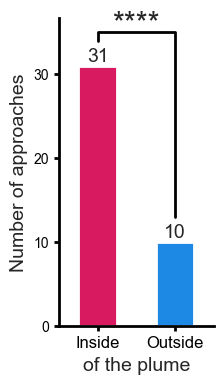

In [20]:
from scipy.stats import binomtest

def convert_p_to_asterisks(p):
    if p < 0.0001:
        return '****'
    elif p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    elif p < 0.1:
        return '.'
    else:
        return 'ns'

fig, ax = plt.subplots(1, 1, figsize=(2,4))

## compare in_plume_feeding True/False
in_plume = data_fe[data_fe['in_plume_feeding'] == True]
out_plume = data_fe[data_fe['in_plume_feeding'] == False]

## run binomial test
## food arc fraction = 17%
pval = binomtest(len(in_plume), len(in_plume)+len(out_plume), p=0.17)
print ('pval = ', pval)
ptxt = convert_p_to_asterisks(pval.pvalue)

## plot data as barplot
ax.bar([0, .5], [len(in_plume), len(out_plume)],
       color=[crossing_color_key['in_plume'], crossing_color_key['out_plume']],
       edgecolor=None, linewidth=2, width=0.25)

## add text labels
ax.text(0, len(in_plume)+.5, str(len(in_plume)), fontsize=14, horizontalalignment='center')
ax.text(.5, len(out_plume)+.5, str(len(out_plume)), fontsize=14, horizontalalignment='center')

## drawn line between the two bars for the binomial test
px = [0, 0, .5, .5, .5]
py = [len(in_plume)+3, len(in_plume)+4, len(in_plume)+4, len(out_plume)+4, len(out_plume)+3]
ax.plot(px, py, color='black', linewidth=2)
ax.text(.25, len(in_plume)+4, ptxt, fontsize=22, horizontalalignment='center')

## add axis labels
ax.set_xticks([0, .5])
ax.set_xlim(-0.25, 0.75)
ax.set_xticklabels(['Inside', 'Outside'], fontsize=12)

yticks = [0, 10, 20, 30]
ax.set_yticks(yticks)

ax.set_ylabel('Number of approaches', fontsize=14)
ax.set_xlabel('of the plume', fontsize=14)

ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True)
ax.tick_params(axis='y', which='both', left=True, right=False, labelleft=True)
## make the ticks markers thicker
ax.tick_params(axis='x', width=2, colors='black')
ax.tick_params(axis='y', width=2, colors='black')

for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2)
    ax.spines[axis].set_color('black')

name_fig = '1t-approaches_food_eaten_barplot.png'
fig.savefig(os.path.join(target_dir, name_fig), dpi=300, bbox_inches='tight')

plt.show(fig)
plt.close(fig)

In [21]:
data_fe

,animal,subdir,condition,inBox,mex,mey,lex,ley,rex,rey,bodyaxis_angle,dx,dy,speed,zscore_speed,final_approach_indexes,crossing_indexes,in_plume_feeding
0,khorne,../../DATA/1T/trajectories\khorne\Food_eaten\0,Food_eaten,"[True, True, True, True, True, True, True, Tru...","[402.6723574142028, 406.54163154569704, 410.42...","[685.1328257139892, 688.2840366169003, 691.448...","[394.5784758854632, 398.4957161388612, 402.363...","[683.1148588113439, 686.0105567279792, 688.871...","[410.76623894294244, 414.5875469525329, 418.47...","[687.1507926166346, 690.5575165058212, 694.025...","[-1.3264577241335607, -1.2954123216055402, -1....","[3.869274131494251, 3.879449001876708, 3.87118...","[3.151210902911089, 3.1647749080566427, 3.0821...","[4.9901315072126415, 5.006588137327367, 4.9483...","[1.8079414166660044, 1.8161860441622941, 1.786...","[5647, 5884]",237,True
0,khorne,../../DATA/1T/trajectories\khorne\Food_eaten\1,Food_eaten,"[True, True, True, True, True, True, True, Tru...","[400.93932901402064, 406.69744513236304, 412.4...","[743.5513328844711, 743.5044953461259, 743.419...","[402.4387518166576, 408.3186467868844, 414.137...","[735.5725116296987, 735.5555873107468, 735.493...","[399.4399062113837, 405.0762434778417, 410.788...","[751.5301541392433, 751.453403381505, 751.3466...","[0.18575882558481482, 0.20119337598866394, 0.2...","[5.7581161183424, 5.765382990989849, 5.6966511...","[-0.046837538345243956, -0.08454993693067081, ...","[5.7583066076158875, 5.766002924438213, 5.7007...","[2.1927904113020746, 2.196646198595776, 2.1639...","[5611, 5941]",330,True
0,khorne,../../DATA/1T/trajectories\khorne\Food_eaten\2,Food_eaten,"[True, True, True, True, True, True, True, Tru...","[400.24653675633556, 401.0111837268828, 401.76...","[448.8456367449748, 447.94842543149787, 447.09...","[395.9785170697416, 396.5110311192049, 397.135...","[441.16418376997, 440.400327389617, 439.647785...","[404.5145564429295, 405.5113363345606, 406.388...","[456.5270897199796, 455.49652347337866, 454.53...","[-0.5071528000916485, -0.5376184062749301, -0....","[0.7646469705472327, 0.7509112245168126, 0.867...","[-0.8972113134769302, -0.8579365372345364, -0....","[1.1788439806005113, 1.1401415565741502, 1.177...","[-0.10148024008348834, -0.12086981541430188, -...","[5632, 5890]",258,True
0,khorne,../../DATA/1T/trajectories\khorne\Food_eaten\3,Food_eaten,"[True, True, True, True, True, True, True, Tru...","[1066.082368375158, 1061.8832371139547, 1057.6...","[963.0763554818134, 960.8319942333858, 958.604...","[1057.4197912040604, 1053.200963694807, 1048.9...","[962.540584860685, 960.3524579482064, 958.1644...","[1074.7449455462556, 1070.5655105331023, 1066....","[963.6121261029418, 961.3115305185653, 959.044...","[-1.5090261380636756, -1.5156207364274528, -1....","[-4.19913126120332, -4.230316630225616, -4.272...","[-2.2443612484275945, -2.2273944363172404, -2....","[4.7612877210118745, 4.78088535387541, 4.78746...","[1.693292684883569, 1.7031109272358913, 1.7064...","[5561, 5905]",344,True
0,khorne,../../DATA/1T/trajectories\khorne\Food_eaten\4,Food_eaten,"[True, True, True, True, True, True, True, Tru...","[697.5574194080061, 697.9059063399611, 698.324...","[964.6391472529856, 964.2735439931208, 963.956...","[705.9229902030231, 706.2333802073643, 706.637...","[960.5840433622474, 960.188066045992, 959.8533...","[689.1918486129891, 689.5784324725578, 690.012...","[968.6942511437238, 968.3590219402497, 968.059...","[1.1194332916471454, 1.114695091451928, 1.1123...","[0.34848693195499436, 0.4190431148214202, 0.51...","[-0.3656032598647698, -0.3172500435306347, -0....","[0.5050830479902798, 0.5255898802292788, 0.570...","[-0.43902856390183886, -0.42875482062871473, -...","[5380, 5745]",365,True
0,khorne,../../DATA/1T/trajectories\khorne\Food_eaten\5,Food_eaten,"[True, True, True, True, True, True, True, Tru...","[400.70264812730295, 402.30652504338286, 404.3...","[399.3976723939013, 401.6637117260967, 404.175...","[408.85985128998004, 410.42240924495366, 412.3...

t-statistic =  1.5916784467438896
p-value =  0.11953117478928096


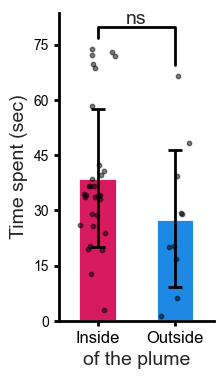

In [22]:
from scipy.stats import ttest_ind

## calculate the amount of time taken for each of the trajectories comparing inside and out
## time is given by the final approach indexes

indexes_inside = data_fe[data_fe['in_plume_feeding'] == True]['final_approach_indexes'].values
time_inside = [(i[1]-i[0])/10 for i in indexes_inside]

indexes_outside = data_fe[data_fe['in_plume_feeding'] == False]['final_approach_indexes'].values
time_outside = [(i[1]-i[0])/10 for i in indexes_outside]

t_stat, p_value = ttest_ind(time_inside, time_outside)
print ('t-statistic = ', t_stat)
print ('p-value = ', p_value)

fig, ax = plt.subplots(1, 1, figsize=(2,4))

## plot data as barplot with error bars
ax.bar([0, .5], [np.mean(time_inside), np.mean(time_outside)],
       color=[crossing_color_key['in_plume'], crossing_color_key['out_plume']],
       edgecolor=None, linewidth=2, width=0.25,
       yerr=[np.std(time_inside), np.std(time_outside)],
       error_kw=dict(lw=2, capsize=5, capthick=2))
## add gittered data points
ax.scatter(np.random.normal(0, 0.05, len(time_inside)), time_inside, color='black', s=10, alpha=0.5)
ax.scatter(np.random.normal(0.5, 0.05, len(time_outside)), time_outside, color='black', s=10, alpha=0.5)

# draw lines for ttest
px = [0, 0, .5, .5]
py = [np.max(time_inside)+3, np.max(time_inside)+6, np.max(time_inside)+6, np.max(time_outside)+3]
ax.plot(px, py, color='black', linewidth=2)

## add text labels
p_txt = convert_p_to_asterisks(p_value)
ax.text(.25, np.max(time_inside)+7, p_txt, fontsize=14, horizontalalignment='center')

## add axis labels
ax.set_xticks([0, .5])
ax.set_xlim(-0.25, 0.75)
ax.set_xticklabels(['Inside', 'Outside'], fontsize=12)

yticks = [0, 15, 30, 45, 60, 75]
ax.set_yticks(yticks)

ax.set_ylabel('Time spent (sec)', fontsize=14)
ax.set_xlabel('of the plume', fontsize=14)

ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True)
ax.tick_params(axis='y', which='both', left=True, right=False, labelleft=True)
## make the ticks markers thicker
ax.tick_params(axis='x', width=2, colors='black')
ax.tick_params(axis='y', width=2, colors='black')

for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2)
    ax.spines[axis].set_color('black')

name_fig = '1t-time_food_eaten_time_barplot.png'
fig.savefig(os.path.join(target_dir, name_fig), dpi=300, bbox_inches='tight')

plt.show(fig)
plt.close(fig)


In [23]:
data = data[data['condition'] != 'Food_eaten'].copy()

## get the crossing indexes for all the trajectories in data
crossing_indexes = []
for i, row in data.iterrows():
    mex_values = np.array(row['mex'])
    mey_values = np.array(row['mey'])

    idx, in_plume = find_crossing_index(mex_values, mey_values, plume_vertices, food_location, food_radius)
    crossing_indexes.append(idx)

data['final_approach_indexes'] = [[0, len(data['mex'].iloc[i])-1] for i in range(len(data['mex']))]
data['crossing_indexes'] = crossing_indexes
data['in_plume_feeding'] = [np.nan for i in range(len(data['mex']))]

data

,animal,subdir,condition,inBox,mex,mey,lex,ley,rex,rey,bodyaxis_angle,dx,dy,speed,zscore_speed,final_approach_indexes,crossing_indexes,in_plume_feeding
9,khorne,../../DATA/1T/trajectories\khorne\Food_not_eat...,Food_not_eaten,"[True, True, True, True, True, True, True, Tru...","[867.7782321352277, 868.4098868720093, 869.103...","[220.3760096390972, 222.62254504851472, 224.94...","[859.7916990734894, 860.442156655386, 861.1662...","[218.44241288276504, 220.4394524234994, 222.58...","[875.7647651969658, 876.3776170886325, 877.039...","[222.30960639542934, 224.80563767353004, 227.2...","[-1.333259912723737, -1.303367686681597, -1.28...","[0.6316547367816838, 0.6931484620570245, 0.750...","[2.2465354094175325, 2.3188348884151537, 2.280...","[2.3336471567624653, 2.4202169386613543, 2.401...","[0.4770660329149106, 0.5204367351313224, 0.510...","[0, 412]",NaN,NaN
10,khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[401.3909255130658, 403.8310148211872, 406.165...","[440.34594049593426, 440.4824909345147, 440.96...","[408.7892003231359, 411.0060588383548, 413.219...","[436.9547971787284, 436.8070729969831, 437.059...","[393.9926507029957, 396.6559708040195, 399.111...","[443.7370838131401, 444.15790887204633, 444.87...","[1.1410041832880435, 1.0973966317585448, 1.064...","[2.440089308121401, 2.3348149470049293, 2.2631...","[0.136550438580457, 0.4848564076436901, 0.7151...","[2.4439070878175566, 2.3846271349606787, 2.373...","[0.5323052922880918, 0.5026065553112394, 0.496...","[0, 654]",NaN,NaN
11,khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[657.559289183019, 658.3439227389397, 659.9528...","[962.4270136912726, 957.2867360210096, 950.986...","[649.7691473232626, 650.6390723674978, 652.283...","[965.5508825641546, 960.0525758525707, 953.351...","[665.3494310427753, 666.0487731103816, 667.621...","[959.3031448183906, 954.5208961894485, 948.621...","[-1.9521669069435865, -1.9154431949942392, -1....","[0.7846335559206636, 1.6089221090035153, 2.166...","[-5.1402776702630035, -6.300322016627092, -6.9...","[5.199817722236151, 6.502513965078152, 7.29820...","[1.9129923731451706, 2.5656317767274475, 2.964...","[0, 336]",NaN,NaN
12,khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[559.7323709455363, 563.1621348289987, 565.898...","[964.6595078906078, 963.7740012767802, 963.078...","[559.3690616385084, 562.5784141925504, 565.259...","[955.8815683918298, 954.8029135622764, 953.953...","[560.0956802525642, 563.745855465447, 566.5374...","[973.4374473893857, 972.745088991284, 972.2043...","[-0.04136529596798977, -0.06497528232707106, -...","[3.4297638834623285, 2.736485164960527, 2.2184...","[-0.8855066138276015, -0.6952540758977648, -0....","[3.542231254369909, 2.8234250987234453, 2.2816...","[1.0825560763349662, 0.7224404904567661, 0.451...","[0, 720]",NaN,NaN
13,khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[False, True, True, True, True, True, True, Tr...","[399.4795337044437, 402.5196917350761, 405.003...","[689.8951027389977, 688.0495017732437, 686.561...","[391.75226708620505, 394.85847811214916, 397.3...","[693.060887880476, 691.1606433982747, 689.7095...","[407.20680032268234, 410.180905358003, 412.662...","[686.7293175975194, 684.9383601482127, 683.412...","[-1.9596282826514724, -1.9565415851581578, -1....","[3.0401580306323694, 2.483372233883699, 2.0115...","[-1.845600965753988, -1.4883950392525094, -1.2...","[3.5565156791458885, 2.8952473892391293, 2.343...","[1.089712447989169, 0.7584228287060936, 0.4821...","[0, 1915]",1382.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266,korra,../../DATA/1T/trajectories\korra\No_food_Contr...,No_food_Control,"[False, True, True, True, True, True, True, Tr...","[399.9455565361995, 401.3393228531709, 402.405

In [24]:
data = pd.concat([data, data_fe], axis=0)
data = data.reset_index(drop=True)
data

,animal,subdir,condition,inBox,mex,mey,lex,ley,rex,rey,bodyaxis_angle,dx,dy,speed,zscore_speed,final_approach_indexes,crossing_indexes,in_plume_feeding
0,khorne,../../DATA/1T/trajectories\khorne\Food_not_eat...,Food_not_eaten,"[True, True, True, True, True, True, True, Tru...","[867.7782321352277, 868.4098868720093, 869.103...","[220.3760096390972, 222.62254504851472, 224.94...","[859.7916990734894, 860.442156655386, 861.1662...","[218.44241288276504, 220.4394524234994, 222.58...","[875.7647651969658, 876.3776170886325, 877.039...","[222.30960639542934, 224.80563767353004, 227.2...","[-1.333259912723737, -1.303367686681597, -1.28...","[0.6316547367816838, 0.6931484620570245, 0.750...","[2.2465354094175325, 2.3188348884151537, 2.280...","[2.3336471567624653, 2.4202169386613543, 2.401...","[0.4770660329149106, 0.5204367351313224, 0.510...","[0, 412]",NaN,NaN
1,khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[401.3909255130658, 403.8310148211872, 406.165...","[440.34594049593426, 440.4824909345147, 440.96...","[408.7892003231359, 411.0060588383548, 413.219...","[436.9547971787284, 436.8070729969831, 437.059...","[393.9926507029957, 396.6559708040195, 399.111...","[443.7370838131401, 444.15790887204633, 444.87...","[1.1410041832880435, 1.0973966317585448, 1.064...","[2.440089308121401, 2.3348149470049293, 2.2631...","[0.136550438580457, 0.4848564076436901, 0.7151...","[2.4439070878175566, 2.3846271349606787, 2.373...","[0.5323052922880918, 0.5026065553112394, 0.496...","[0, 654]",NaN,NaN
2,khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[657.559289183019, 658.3439227389397, 659.9528...","[962.4270136912726, 957.2867360210096, 950.986...","[649.7691473232626, 650.6390723674978, 652.283...","[965.5508825641546, 960.0525758525707, 953.351...","[665.3494310427753, 666.0487731103816, 667.621...","[959.3031448183906, 954.5208961894485, 948.621...","[-1.9521669069435865, -1.9154431949942392, -1....","[0.7846335559206636, 1.6089221090035153, 2.166...","[-5.1402776702630035, -6.300322016627092, -6.9...","[5.199817722236151, 6.502513965078152, 7.29820...","[1.9129923731451706, 2.5656317767274475, 2.964...","[0, 336]",NaN,NaN
3,khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[559.7323709455363, 563.1621348289987, 565.898...","[964.6595078906078, 963.7740012767802, 963.078...","[559.3690616385084, 562.5784141925504, 565.259...","[955.8815683918298, 954.8029135622764, 953.953...","[560.0956802525642, 563.745855465447, 566.5374...","[973.4374473893857, 972.745088991284, 972.2043...","[-0.04136529596798977, -0.06497528232707106, -...","[3.4297638834623285, 2.736485164960527, 2.2184...","[-0.8855066138276015, -0.6952540758977648, -0....","[3.542231254369909, 2.8234250987234453, 2.2816...","[1.0825560763349662, 0.7224404904567661, 0.451...","[0, 720]",NaN,NaN
4,khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[False, True, True, True, True, True, True, Tr...","[399.4795337044437, 402.5196917350761, 405.003...","[689.8951027389977, 688.0495017732437, 686.561...","[391.75226708620505, 394.85847811214916, 397.3...","[693.060887880476, 691.1606433982747, 689.7095...","[407.20680032268234, 410.180905358003, 412.662...","[686.7293175975194, 684.9383601482127, 683.412...","[-1.9596282826514724, -1.9565415851581578, -1....","[3.0401580306323694, 2.483372233883699, 2.0115...","[-1.845600965753988, -1.4883950392525094, -1.2...","[3.5565156791458885, 2.8952473892391293, 2.343...","[1.089712447989169, 0.7584228287060936, 0.4821...","[0, 1915]",1382.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266,ninja,../../DATA/1T/trajectories\ninja\Food_eaten\8,Food_eaten,"[True, True, True, True, True, True, True, Tru...","[613.2152147824427, 615.0888330618131, 616.993...","[220.96

In [25]:
print(len(ghost_plots))

31


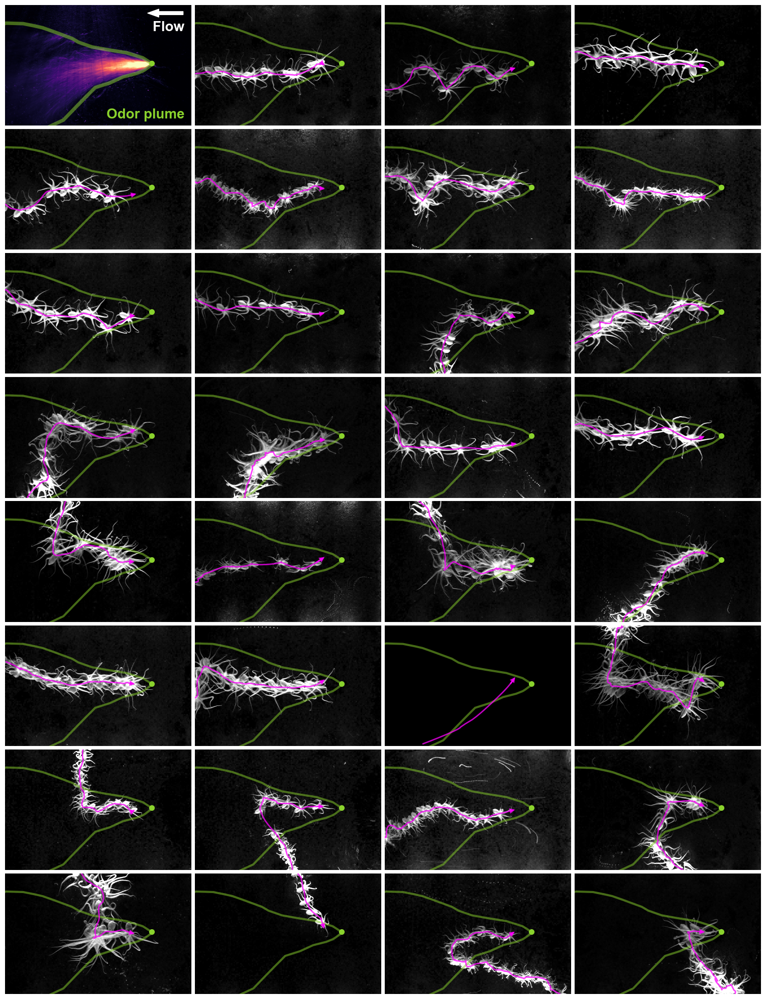

In [26]:
from scipy.interpolate import interp1d

def resample_trajectory(mex, mey, num_points=100):
    length = len(mex)
    new_index = np.linspace(0, length-1, num_points)
    interp_mex = interp1d(np.arange(length), mex, kind='linear')(new_index)
    interp_mey = interp1d(np.arange(length), mey, kind='linear')(new_index)
    return interp_mex, interp_mey

# Resample all trajectories
resampled_trajectories = [resample_trajectory(mex, mey) for mex, mey in zip(gmexs, gmeys)]
data_for_pca = [np.column_stack([mex, mey]).flatten() for mex, mey in resampled_trajectories]

from sklearn.decomposition import PCA

n_components = 2
pca = PCA(n_components=n_components)
principal_components = pca.fit_transform(data_for_pca)

# Compute the Euclidean distance from the origin for each point
distances_from_origin = np.linalg.norm(principal_components, axis=1)

# Get the sorting indices based on the distances
sorting_indices = np.argsort(distances_from_origin)

gmexs = [gmexs[i] for i in sorting_indices]
gmeys = [gmeys[i] for i in sorting_indices]
ghost_plots = [ghost_plots[i] for i in sorting_indices]

xlim = (400, 1550)
ylim = (965, 220)

fig, axs = plt.subplots(8, 4, figsize=(16,20))

ax = axs.flatten()[0]
ax.imshow(frames_std, cmap='magma', zorder=1, vmax=vmax)
poly = plt.Polygon(plume_vertices, facecolor='none', edgecolor=crossing_color_key['food_circle'], linewidth=5, alpha=0.5, zorder=3)
ax.add_patch(poly)
ax.scatter(food_location[0], food_location[1], color=crossing_color_key['food_circle'], marker='o', s=50, zorder=3)
## add text to the bottom right of the plotted rectangle
ax.text(xlim[1]-40, ylim[0]-25, 'Odor plume', color=crossing_color_key['food_circle'], ha='right', va='bottom', fontsize=20, weight='bold')
## add arrow in top right of the plotted rectangle pointing from right to left
ax.arrow(xlim[1]-50, ylim[1]+50, -150, 0, color='white', width=20, head_width=50, head_length=70, zorder=4)
## add text beneath the arrow
ax.text(xlim[1]-140, ylim[1]+180, 'Flow', color='white', ha='center', va='bottom', fontsize=20, weight='bold')

i = 1
for gstd in ghost_plots:
    ax = axs[i//4, i%4]

    vmax = np.mean(gstd) + 7*np.std(gstd)

    ax.imshow(gstd, cmap='Greys_r', zorder=1, vmax=vmax)

    ax.scatter(food_location[0], food_location[1], color=crossing_color_key['food_circle'], marker='o', s=50, zorder=4)

    poly = plt.Polygon(plume_vertices, facecolor='none', edgecolor=crossing_color_key['food_circle'], linewidth=3, alpha=0.5, zorder=3)
    ax.add_patch(poly)

    mex = gmexs[i-1]
    mey = gmeys[i-1]
    ax.plot(mex, mey, color='magenta', linewidth=2, alpha=0.75, zorder=5)
    ## add arrow to the end of the trajectory
    ax.arrow(mex[-5], mey[-5], mex[-1]-mex[-5], mey[-1]-mey[-5], color='magenta', linewidth=2, alpha=0.75, zorder=5, head_width=20, head_length=20, length_includes_head=True)

    i += 1

for ax in axs.flatten():
    ax.set_xticks([])
    ax.set_yticks([])

    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

    ax.set_aspect('equal')

    ax.grid(color='white')
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)

fig.tight_layout(h_pad=.5, w_pad=-3)

fig_name = '1t-approaches_ghost_plots.png'
path_fig = os.path.join('../../DATA/1T', fig_name)
fig.savefig(path_fig, dpi=300, bbox_inches='tight')

plt.show(fig)
plt.close(fig)

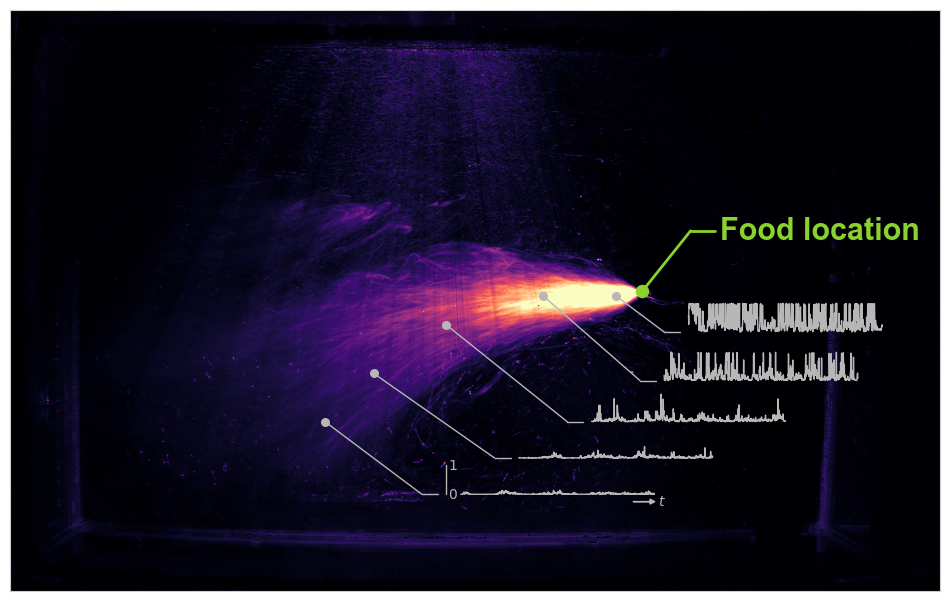

In [27]:

plume_color_key = {
    'data': '#B7B7B7',
}

## show plot of frames_std=
sample_positions = [(1100, 590) , (900, 650), (750, 750) , (1250, 590), (650, 850)]

plot_offsets = [(150, 175) , (200, 200), (200, 175),  (50, 75),(150, 150)]

## for each position get all the pixel values for that pixel in frames across time
sample_values = []
for x, y in sample_positions:
    values = frames[:, y, x]
    ## normalize values using values/255
    values = values/255
    sample_values.append(np.array(values))

fig, ax = plt.subplots(1, 1, figsize=(12, 12))

ax.imshow(frames_std, cmap='magma', vmin=0, vmax=vmax, zorder=1)

food_loc_offset = (100, -125)
ax.scatter(food_location[0], food_location[1], color=crossing_color_key['food_circle'], marker='o', s=75, zorder=4)
locfxs = food_location[0]+food_loc_offset[0]
locfys = food_location[1]+food_loc_offset[1]
ax.plot([food_location[0], locfxs], [food_location[1], locfys], color=crossing_color_key['food_circle'], linewidth=2, zorder=4)
ax.plot([locfxs, locfxs+50], [locfys, locfys], color=crossing_color_key['food_circle'], linewidth=2, zorder=4)
ax.text(locfxs+60, locfys, 'Food location', color=crossing_color_key['food_circle'], ha='left', va='center', fontsize=22, weight='bold')

## show sample positions with values plotted coming out of it to the right
length_values = 400
xoffset = 50
y_scalar = 60
x_shift = 50
for i, (x, y) in enumerate(sample_positions):
    ax.scatter(x, y, color=plume_color_key['data'], s=30, zorder=2)

    ## make array of x values from 0 to 100 with number of values equal to length_values
    values = sample_values[i]
    x_values = np.linspace(0, length_values, len(values))
    x_values = x_values + x + x_shift
    y_values = -values * y_scalar + y

    offsets = plot_offsets[i]

    ax.plot([x, x_values[0]+offsets[0]], [y, max(y_values)+offsets[1]], color=plume_color_key['data'], linewidth=1, zorder=2)

    ax.plot([x_values[0]+offsets[0], (2/3)*xoffset + x_values[0]+offsets[0]], [max(y_values)+offsets[1],max(y_values)+offsets[1]], color=plume_color_key['data'], linewidth=1, zorder=2)

    if i == 4:
        ## at inset axis to the plotted data
        ax.plot(x_values+offsets[0]+xoffset+30, y_values+offsets[1], color=plume_color_key['data'], linewidth=1, zorder=2)
        ax.plot([x_values[0]+offsets[0]+xoffset, x_values[0]+offsets[0]+xoffset], [max(y_values)+offsets[1], max(y_values)+offsets[1]-y_scalar], color=plume_color_key['data'], linewidth=1, zorder=2)
        ax.text(x_values[0]+offsets[0]+xoffset+13, max(y_values)+offsets[1]-y_scalar, '$\\it{1}$', color=plume_color_key['data'], fontsize=10, weight='bold', ha='center', va='center', zorder=2)
        ax.text(x_values[0]+offsets[0]+xoffset+13, max(y_values)+offsets[1], '$\\it{0}$', color=plume_color_key['data'], fontsize=10, weight='bold', ha='center', va='center', zorder=2)
        ax.arrow(x_values[-40]+offsets[0]+xoffset, max(y_values)+offsets[1]+15, 35, 0, color=plume_color_key['data'], linewidth=1, head_width=10, head_length=10, zorder=2)
        ## add text t at end of arrow
        ax.text(x_values[-40]+offsets[0]+xoffset+60, max(y_values)+offsets[1]+15, '$\\it{t}$', color=plume_color_key['data'], fontsize=10, weight='bold', ha='center', va='center', zorder=2)
    else:
        ax.plot(x_values+offsets[0]+xoffset, y_values+offsets[1], color=plume_color_key['data'], linewidth=1, zorder=2)

    ## plot text of sample position and index
    #ax.text(x+10, y+10, f'{i}', color='blue', fontsize=14, weight='bold', ha='center', va='center', zorder=2)

ax.set_xticks([])
ax.set_yticks([])

fig_name = '1t-approaches_plume_dynamics.png'
path_fig = os.path.join('../../DATA/1T', fig_name)
fig.savefig(path_fig, dpi=300, bbox_inches='tight')

plt.show(fig)
plt.close(fig)

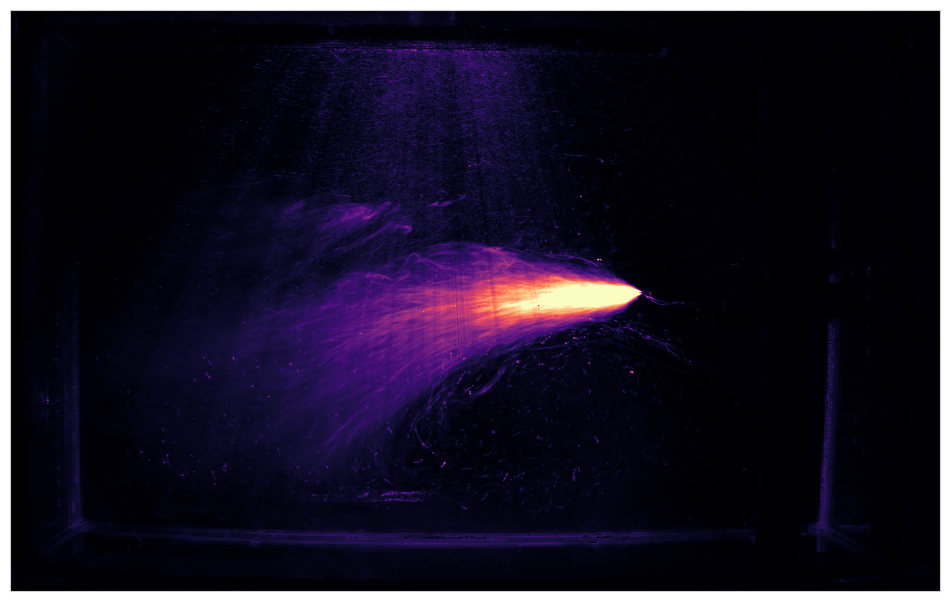

In [28]:
## just plot the frames_std

fig, ax = plt.subplots(1, 1, figsize=(12, 12))

ax.imshow(frames_std, cmap='magma', vmin=0, vmax=vmax, zorder=1)

ax.set_xticks([])
ax.set_yticks([])

fig_name = '1t-approaches_plume_dynamics_frames_std.png'
path_fig = os.path.join('../../DATA/1T', fig_name)
fig.savefig(path_fig, dpi=300, bbox_inches='tight')

plt.show(fig)
plt.close(fig)

In [29]:
## test if mex, mey in plume polygon
insides = []
for i, row in data.iterrows():
    mex = row['mex']
    mey = row['mey']

    path = mpltPath.Path(plume_vertices)
    inside = path.contains_points(np.stack([mex, mey], axis=1))
    insides.append(inside)

## test if inside food circle
inside_food_circle = []
food_location = (plume_vertices[idx_right, 0], plume_vertices[idx_right, 1])
food_radius = food_radius
for i, row in data.iterrows():
    mex = row['mex']
    mey = row['mey']

    inside = (mex - food_location[0])**2 + (mey - food_location[1])**2 <= food_radius**2
    inside_food_circle.append(inside)

data.insert(0, 'inside_plume', insides)
data.insert(0, 'inside_food_circle', inside_food_circle)

In [30]:
data

,inside_food_circle,inside_plume,animal,subdir,condition,inBox,mex,mey,lex,ley,rex,rey,bodyaxis_angle,dx,dy,speed,zscore_speed,final_approach_indexes,crossing_indexes,in_plume_feeding
0,"[False, False, False, False, False, False, Fal...","[False, False, False, False, False, False, Fal...",khorne,../../DATA/1T/trajectories\khorne\Food_not_eat...,Food_not_eaten,"[True, True, True, True, True, True, True, Tru...","[867.7782321352277, 868.4098868720093, 869.103...","[220.3760096390972, 222.62254504851472, 224.94...","[859.7916990734894, 860.442156655386, 861.1662...","[218.44241288276504, 220.4394524234994, 222.58...","[875.7647651969658, 876.3776170886325, 877.039...","[222.30960639542934, 224.80563767353004, 227.2...","[-1.333259912723737, -1.303367686681597, -1.28...","[0.6316547367816838, 0.6931484620570245, 0.750...","[2.2465354094175325, 2.3188348884151537, 2.280...","[2.3336471567624653, 2.4202169386613543, 2.401...","[0.4770660329149106, 0.5204367351313224, 0.510...","[0, 412]",NaN,NaN
1,"[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Tru...",khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[401.3909255130658, 403.8310148211872, 406.165...","[440.34594049593426, 440.4824909345147, 440.96...","[408.7892003231359, 411.0060588383548, 413.219...","[436.9547971787284, 436.8070729969831, 437.059...","[393.9926507029957, 396.6559708040195, 399.111...","[443.7370838131401, 444.15790887204633, 444.87...","[1.1410041832880435, 1.0973966317585448, 1.064...","[2.440089308121401, 2.3348149470049293, 2.2631...","[0.136550438580457, 0.4848564076436901, 0.7151...","[2.4439070878175566, 2.3846271349606787, 2.373...","[0.5323052922880918, 0.5026065553112394, 0.496...","[0, 654]",NaN,NaN
2,"[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Tru...",khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[657.559289183019, 658.3439227389397, 659.9528...","[962.4270136912726, 957.2867360210096, 950.986...","[649.7691473232626, 650.6390723674978, 652.283...","[965.5508825641546, 960.0525758525707, 953.351...","[665.3494310427753, 666.0487731103816, 667.621...","[959.3031448183906, 954.5208961894485, 948.621...","[-1.9521669069435865, -1.9154431949942392, -1....","[0.7846335559206636, 1.6089221090035153, 2.166...","[-5.1402776702630035, -6.300322016627092, -6.9...","[5.199817722236151, 6.502513965078152, 7.29820...","[1.9129923731451706, 2.5656317767274475, 2.964...","[0, 336]",NaN,NaN
3,"[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Tru...",khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[559.7323709455363, 563.1621348289987, 565.898...","[964.6595078906078, 963.7740012767802, 963.078...","[559.3690616385084, 562.5784141925504, 565.259...","[955.8815683918298, 954.8029135622764, 953.953...","[560.0956802525642, 563.745855465447, 566.5374...","[973.4374473893857, 972.745088991284, 972.2043...","[-0.04136529596798977, -0.06497528232707106, -...","[3.4297638834623285, 2.736485164960527, 2.2184...","[-0.8855066138276015, -0.6952540758977648, -0....","[3.542231254369909, 2.8234250987234453, 2.2816...","[1.0825560763349662, 0.7224404904567661, 0.451...","[0, 720]",NaN,NaN
4,"[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Tru...",khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[False, True, True, True, True, True, True, Tr...","[399.4795337044437, 402.5196917350761, 405.003...","[689.8951027389977, 688.0495017732437, 686.561...","[391.75226708620505, 394.85847811214916, 397.3...","[693.060887880476, 691.1606433982747, 689.7095...","[407.20680032268234, 410.180905358003, 412.662...","[686.7293175975194, 684.9383601482127

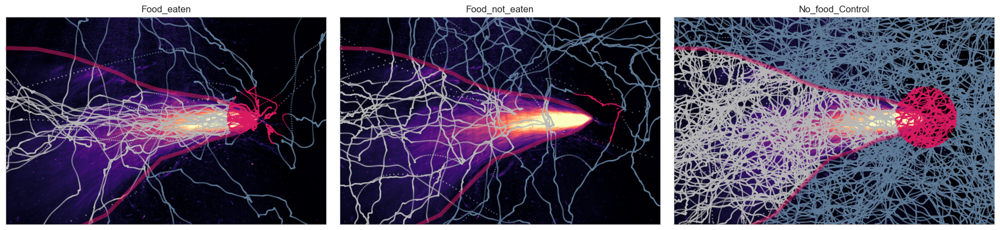

In [31]:
inside_plume_color_key = {True: '#B7B7B7', False: '#607C98'}
inside_food_circle_color_key = {True: '#D81B60'}

xlim = (400, 1550)
ylim = (965, 220)

nrows = 1
ncols = 3

fig, axs = plt.subplots(nrows, ncols, figsize=(ncols*6 , nrows*4))

for i, condition in enumerate(sorted(data['condition'].unique())):
    ax = axs.flatten()[i]

    ax.grid(color='white')

    ax.imshow(frames_std, cmap='magma', vmin=0, vmax=vmax, zorder=1)

    poly = plt.Polygon(plume_vertices, facecolor='none', edgecolor='#D81B60', linewidth=5, alpha=0.5, zorder=3)
    ax.add_patch(poly)


    for j, row in data[data['condition'] == condition].iterrows():
        mex = row['mex']
        mey = row['mey']
        inside_food_circle = row['inside_food_circle']
        insides = row['inside_plume']

        ## insides is a list the same length as mex, mey like [True, False, True, ...]
        ## color the points inside the plume green and outside red
        c = [inside_plume_color_key[inside] for inside in insides]
        for i, inside in enumerate(inside_food_circle):
            if inside:
                c[i] = inside_food_circle_color_key[inside]

        ax.scatter(mex, mey, s=1, c=c, zorder=2, alpha=0.5)


    ax.set_title(condition)
    ax.set_aspect('equal')
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

    ax.set_xticks([])
    ax.set_yticks([])

fig.tight_layout()

plt.show(fig)
plt.close(fig)

In [32]:

def hex_to_rgb(value):
        """Converts a hex color like '#0080F1' to an RGB tuple."""

        # Remove the hash at the start if it's there
        value = value.lstrip('#')

        # Split the string in steps of 2 and convert it to decimal
        return tuple(int(value[i:i+2], 16) for i in (0, 2, 4))

def draw_unit_vector (frame, angle, scalar, center, color):

    unit_vector = (np.cos(angle), np.sin(angle))
    unit_vector = np.array(unit_vector) * scalar
    unit_vector = unit_vector.astype(int)
    unit_vector = tuple(unit_vector)
    cv2.arrowedLine(frame, center, tuple(np.array(center)+unit_vector), hex_to_rgb(color), 5)

    return frame

## mex, mey plot
xlim = (400, 1550)
ylim = (965, 220)

circ_width = 5
center = (300, 300)
N_angular_bins_shell = 100
angular_bin_width = 2*np.pi/N_angular_bins_shell
angular_bins = np.arange(0, 2*np.pi, angular_bin_width)

rollby = int(N_angular_bins_shell/4)
angular_bins = np.roll(angular_bins, rollby)
angular_bins = np.flip(angular_bins)

peak_roll = int(N_angular_bins_shell/10)
peak_thresh = 10

def angular_bin_frame (center, radius, angular_bins, angular_bin_width, circ_width, frame):
    frame = frame.copy()

    ## if rgb convert to grayscale
    if len(frame.shape) == 3:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    pixel_values_per_bin = []
    for bin in angular_bins:
        bin_edge = bin + angular_bin_width

        bin_pixel_values = []
        for i in range(0, circ_width):

            length = radius + i
            nsteps_per_length = int((2*np.pi*length)*(angular_bin_width/(2*np.pi)))
            angles = np.linspace(bin, bin_edge, nsteps_per_length)

            length_pixel_values = []
            for angle in angles:
                unit_vector = (np.cos(angle), np.sin(angle))
                pixel = center + np.array(unit_vector) * length
                pixel = pixel.astype(int)
                pixel_value = frame[pixel[1], pixel[0]]
                length_pixel_values.append(pixel_value)
            length_pixel_values = np.array(length_pixel_values)
            length_pixel_values_avg = np.mean(length_pixel_values)
            bin_pixel_values.append(length_pixel_values_avg)

        bin_pixel_values = np.array(bin_pixel_values)
        bin_pixel_values_avg = np.mean(bin_pixel_values)
        pixel_values_per_bin.append(bin_pixel_values_avg)

    return pixel_values_per_bin

def use_peak_finder(shell, peak_thresh, peak_roll, N_angular_bins_shell):

    peaks_0, props_0 = find_peaks(shell, height=peak_thresh)
    peaks_1, props_1 = find_peaks(np.roll(shell, peak_roll), height=peak_thresh)
    unshared_height_idxs = []
    for m, peak in enumerate(peaks_1):
      h = props_1['peak_heights'][m]
      if h not in props_0['peak_heights']:
        unshared_height_idxs.append(m)
    for m in unshared_height_idxs:
      peaks_0 = np.append(peaks_0, peaks_1[m]-peak_roll)
      props_0['peak_heights'] = np.append(props_0['peak_heights'], props_1['peak_heights'][m])
    for m, peak in enumerate(peaks_0):
      if peak < 0:
        peak = N_angular_bins_shell + peak
        peaks_0[m] = peak

    return peaks_0, props_0['peak_heights']

def shift_HoA_into_shell_FoR (heading_offset_angle, N_angular_bins_shell):
    shifted_hoa = heading_offset_angle.copy()
    scalar = N_angular_bins_shell/(2*np.pi)
    shifted_hoa *= -1
    shifted_hoa += np.pi
    shifted_hoa *= scalar
    return shifted_hoa

def find_closest_peak_to_shifted_hoa(shifted_hoa, peaks):
    if len(peaks) != 0:
        distances = []
        for peak in peaks:
            distance = np.abs(peak - shifted_hoa) ## this is wrong, distance needs to be circular
            distances.append(distance)
        index_closest = np.argmin(distances)
        closest_peak = peaks[index_closest]
    else:
        closest_peak = np.nan
    return closest_peak

def draw_peaks(frame, center, radius, peaks, angular_bins, color):
    for peak in peaks:
        angle = angular_bins[peak]
        unit_vector = (np.cos(angle), np.sin(angle))
        unit_vector = np.array(unit_vector) * radius
        unit_vector = unit_vector.astype(int)
        peak_point = tuple(np.array(center) + unit_vector)
        cv2.circle(frame, peak_point, 5, hex_to_rgb(color), -1)
    return frame

## drawing parameters
show = False
verbose = False
verbose_plot = False
bodyaxis_scalar = 100
dV_scalar = 100
N_drawn_frames = 5
circ_width_draw = 3
hoa_plot_height = 285

color_key = {'bodyaxis_angle':'#0080F1', 'dV_angle':'#02C5B7', 'animal_circle':'#708C7B'}

heading_offset_angles_list = []
trimmed_speed_zscores_list = []
shells_list = []
shells_peaks_list = []
shells_heights_list = []
shifted_heading_offset_angles_list = []
closest_peaks_list = []
distance_to_closest_peaks_list = []

pbar = tqdm (total=len(data), position=0, leave=True)
#for row in data[data['condition'] == 'Food_eaten'].iloc[:1].iterrows():
for row in data.iloc[:].iterrows():
    if verbose:
        print(row)
    condition = row[1]['condition']
    final_approach_indexes = row[1]['final_approach_indexes']
    if condition == 'Food_eaten':
        crossing_index = int(row[1]['crossing_indexes'])
    else:
        crossing_index = final_approach_indexes[-1]
    subdir = row[1]['subdir']
    path_rotated_video = os.path.join(subdir, 'rotated_bg_sub_fc_video.mp4')
    animal = row[1]['animal']
    if verbose:
        print()

    bodyaxis_angles = row[1]['bodyaxis_angle'][:crossing_index]
    dx = row[1]['dx'][:crossing_index]
    dy = row[1]['dy'][:crossing_index]
    speed_zscore = row[1]['zscore_speed'][:crossing_index]
    trimmed_speed_zscores_list.append(speed_zscore)

    dV_angles = np.arctan2(dy, dx)
    if verbose:
        print(f'dV_angles shape: {dV_angles.shape}')

    ## calculate heading offset angle. this is the angle between the body axis and velocity angle
    def angle_difference_array(theta1_array, theta2_array):
        """
        Calculate the smallest angle difference between each pair of angles in theta1_array and theta2_array.
        The result will be in the range [-pi, pi].
        """
        return np.arctan2(np.sin(theta1_array - theta2_array), np.cos(theta1_array - theta2_array))

    heading_offset_angles = angle_difference_array(dV_angles, bodyaxis_angles) ## issue here, value should be between -pi and pi

    if verbose:
        print(f'heading_offset_angles shape: {heading_offset_angles.shape}')
    heading_offset_angles_list.append(heading_offset_angles)

    mex = row[1]['mex'][:crossing_index]
    mey = row[1]['mey'][:crossing_index]
    if verbose:
        print(f'mex shape: {mex.shape}')
        print(f'mey shape: {mey.shape}')

    if verbose:
        ## plot mex, mey
        fig, axs = plt.subplots(1, 1, figsize=(5,5))
        axs.scatter(mex, mey, s=1, c='black')
        axs.set_aspect('equal')
        axs.set_xlim(xlim)
        axs.set_ylim(ylim)
        plt.show()
        plt.close()

    radius = animal_radius_key[animal]

    cap = cv2.VideoCapture(path_rotated_video)
    frames = []
    for i in range(0, int(cap.get(cv2.CAP_PROP_FRAME_COUNT))):
        ret, frame = cap.read()
        if ret:
            frames.append(frame)
        else:
            print(f'frame {i} not read, {subdir}')
            break
    cap.release()
    if verbose:
        print(f'frames read: {len(frames)}')
    frames = frames[final_approach_indexes[0]:final_approach_indexes[1]]
    if verbose:
        print(f'frames used: {len(frames)}')

    frames = np.array(frames)
    std_frames = np.std(frames)
    mean_frames = np.mean(frames)
    if verbose:
        print(f'mean +- std: {mean_frames} +- {std_frames}')
    threshold = mean_frames + 1.5+std_frames
    if verbose:
        print(f'threshold: {threshold}')

    thresholded_frames = []
    for frame in frames:
        # Set everything above the mean + 2*std to 255, keep everything else the same
        thresholded_frame = np.where(frame >= threshold, 255, frame)
        thresholded_frames.append(thresholded_frame)

    shell_pixel_values = []
    for frame in thresholded_frames:
        shell = angular_bin_frame(center, radius, angular_bins, angular_bin_width, circ_width, frame)
        shell_pixel_values.append(shell)
    shells_list.append(shell_pixel_values)

    peaks_list, heights_list = [], []
    for shell in shell_pixel_values:
        peaks, heights = use_peak_finder(shell=shell, peak_thresh=peak_thresh, peak_roll=peak_roll,
                                        N_angular_bins_shell=N_angular_bins_shell)
        peaks_list.append(peaks)
        heights_list.append(heights)
    shells_peaks_list.append(peaks_list)
    shells_heights_list.append(heights_list)

    shifted_heading_offset_angles = []
    for i, heading_offset_angle in enumerate(heading_offset_angles):
        shifted_hoa = shift_HoA_into_shell_FoR(heading_offset_angle, N_angular_bins_shell)
        shifted_heading_offset_angles.append(shifted_hoa)
    shifted_heading_offset_angles_list.append(shifted_heading_offset_angles)

    closest_peaks_to_HoAs = []
    for i, heading_offset_angle in enumerate(shifted_heading_offset_angles):
        closest_peaks_to_HoA = find_closest_peak_to_shifted_hoa(heading_offset_angle, peaks_list[i])
        closest_peaks_to_HoAs.append(closest_peaks_to_HoA)
    closest_peaks_list.append(closest_peaks_to_HoAs)

    distance_between_hoa_and_closest_peak = []
    for i, heading_offset_angle in enumerate(shifted_heading_offset_angles):
        distance = heading_offset_angle - closest_peaks_to_HoAs[i]

        # Adjusting for circular scale: If the absolute distance is greater than 50,
        # we subtract it from 100 to "go the other way" and find the shorter distance.
        if abs(distance) > N_angular_bins_shell/2:
            distance = N_angular_bins_shell - abs(distance)

        # Considering the direction: If the original distance was negative,
        # we need to preserve this information.
        if distance > 0 and (heading_offset_angle - closest_peaks_to_HoAs[i]) < 0:
            distance *= -1  # This inverts the distance's sign if needed.

        distance_between_hoa_and_closest_peak.append(distance)

    distance_to_closest_peaks_list.append(distance_between_hoa_and_closest_peak)

    if verbose_plot:
        fig, ax = plt.subplots(1, 1, figsize=(10,10))

        ax.imshow(shell_pixel_values, cmap='Blues', zorder=2)
        for i, pks in enumerate(peaks_list):
            ax.scatter(pks, np.ones_like(pks)*i, c='orange', s=1, zorder=3)
        ax.scatter(shifted_heading_offset_angles, np.arange(0, len(shifted_heading_offset_angles)), c='red', s=1, zorder=4)
        ax.scatter(closest_peaks_to_HoAs, np.arange(0, len(closest_peaks_to_HoAs)), c='green', s=1, zorder=5)

        xticks = np.arange(0, (N_angular_bins_shell)+N_angular_bins_shell/8, N_angular_bins_shell/8)
        xlabs = [r'$-\pi$',r'$-\frac{3\pi}{4}$',r'$-\frac{\pi}{2}$',r'$-\frac{\pi}{4}$',r'$0$',
            r'$\frac{\pi}{4}$',r'$\frac{\pi}{2}$',r'$\frac{3\pi}{4}$',r'$\pi$']
        region_texts = ['BR', 'R', 'FR', 'F', 'FL', 'L', 'BL']

        for i, xtick in enumerate(xticks[1:-1]):
            ax.plot([xtick, xtick], [0,len(peaks_list)], color='grey', linewidth=1, zorder=3, alpha=1, linestyle='--')

        ax.set_xticks(xticks)
        ax.set_xticklabels(xlabs, fontsize=12)

        ## turn off grid
        ax.grid(color='white')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ## make the spline thicker and black
        for axis in ['bottom', 'left']:
            ax.spines[axis].set_linewidth(2)
            ax.spines[axis].set_color('black')
        ## set ticks to visible
        ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True)
        ax.tick_params(axis='y', which='both', left=True, right=False, labelleft=True)
        ## make the ticks markers thicker
        ax.tick_params(axis='x', width=2, colors='black')
        ax.tick_params(axis='y', width=2, colors='black')

        ## make legend
        lines = [Line2D([0], [0], color='orange', lw=2),
                Line2D([0], [0], color='red', lw=2),
                Line2D([0], [0], color='green', lw=2)]
        labels = ['Peaks', 'HoAs', 'Closest peaks to HoAs']
        ax.legend(lines, labels, loc='upper right', fontsize=12, bbox_to_anchor = (1.1, 1.1), frameon=False)

        fig.tight_layout()

        plt.show(fig)
        plt.close(fig)

        fig, axs = plt.subplots(1, 2, figsize=(10, 5))

        ax = axs[0]
        ax.scatter(heading_offset_angles, shifted_heading_offset_angles, c='black', s=1)
        ax.set_title('Heading offset angles')

        ax = axs[1]
        ax.scatter(distance_between_hoa_and_closest_peak, speed_zscore, c='black', s=1)
        ax.set_title('Distance between HoA and closest peak')

        fig.tight_layout()

        plt.show(fig)
        plt.close(fig)


    # Convert the list back to a NumPy array if needed
    thresholded_frames = np.array(thresholded_frames)

    if show == True:
        drawn_frames = thresholded_frames.copy()
        for i, frame in enumerate(drawn_frames):

            ## draw circle of radius = animal_radius, centered on center, of a width = circ_width
            cv2.circle(frame, center, int(radius), hex_to_rgb(color_key['animal_circle']), circ_width_draw)

            bodyaxis_angle = np.pi/2
            heading_offset_angle = heading_offset_angles[i]

            ## draw bodyaxis unit vector
            frame = draw_unit_vector(frame, bodyaxis_angle, bodyaxis_scalar, center, color_key['bodyaxis_angle'])

            ## draw dV unit vector
            sp = speed_zscore[i]+1
            scalar = dV_scalar * sp
            frame = draw_unit_vector(frame, heading_offset_angle + np.pi/2, scalar, center, color_key['dV_angle'])

            ##add text to the bottom left corner
            text = 'FrN: ' + str(i) + ' HoA:' + str(round(heading_offset_angle,1)) + ' SpZ: ' + str(round(sp, 2))
            cv2.putText(frame, text, (50, 550),
                        cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)

            # Draw the peaks
            peaks = peaks_list[i]
            frame = draw_peaks(frame, center, radius, peaks, angular_bins, "#FF0000")  # red color for peaks

            drawn_frames[i] = frame

        ## show the drawn frames as a 1xN grid with an image taken every len(drawn_frames)//N frames

        nrows = 2
        ncols = N_drawn_frames
        fig, axs = plt.subplots(nrows, ncols, figsize=(ncols*4 , nrows*4))

        # Calculate interval
        drawn_frames_len = len(drawn_frames)
        interval = drawn_frames_len / (N_drawn_frames - 1)

        # Generate indices
        draw_frames_idxs = [int(i * interval) for i in range(N_drawn_frames)]

        # Make sure last index is the last frame
        draw_frames_idxs[-1] = drawn_frames_len - 1

        for i, idx in enumerate(draw_frames_idxs):
            ax = axs[0, i]
            ax.imshow(drawn_frames[idx])
            ax.set_xticks([])
            ax.set_yticks([])

            ax = axs[1, i]

            ax.plot(shell_pixel_values[idx], color='black', linewidth=2, zorder=3)

            ax.scatter(peaks_list[idx], heights_list[idx], color='red', zorder=4, marker='x', s=50)


            if np.isnan(closest_peaks_to_HoAs[idx]) == False:
                ax.plot([shifted_heading_offset_angles[idx], closest_peaks_to_HoAs[idx]],
                        [hoa_plot_height, hoa_plot_height], color=color_key['dV_angle'], linewidth=1, zorder=1)
                ## get height closest peak
                closest_peak_height = heights_list[idx][np.where(peaks_list[idx] == closest_peaks_to_HoAs[idx])[0][0]]
                ax.plot([closest_peaks_to_HoAs[idx], closest_peaks_to_HoAs[idx]],
                        [closest_peak_height, hoa_plot_height + 2.5], color=color_key['dV_angle'], linewidth=1, zorder=1)


            ax.axhline(y=peak_thresh, color='black', linewidth=1, zorder=1, alpha=.5, linestyle='--')

            yticks = np.arange(0, 255+255/5, 255/5)
            xticks = np.arange(0, N_angular_bins_shell+N_angular_bins_shell/8, N_angular_bins_shell/8)
            xlabs = [r'$-\pi$',r'$-\frac{3\pi}{4}$',r'$-\frac{\pi}{2}$',r'$-\frac{\pi}{4}$',r'$0$',
                r'$\frac{\pi}{4}$',r'$\frac{\pi}{2}$',r'$\frac{3\pi}{4}$',r'$\pi$']
            region_texts = ['BR', 'R', 'FR', 'F', 'FL', 'L', 'BL']

            for i, xtick in enumerate(xticks[1:-1]):
                ax.plot([xtick, xtick], [0, 255], color='black', linewidth=1, zorder=1, alpha=.5, linestyle='--')
                text = region_texts[i]
                ax.text(xtick, 265, text, horizontalalignment='center', verticalalignment='center', fontsize=12)
            ax.axhline(y=255, color='black', linewidth=1, zorder=1, alpha=.5, linestyle='--')

            yticks = np.arange(0, 255+255/5, 255/5)

            ax.set_ylim([0, 290])
            ax.set_xlim([0, N_angular_bins_shell])
            ax.set_xticks(xticks)
            ax.set_xticklabels(xlabs, fontsize=12)
            ax.set_yticks(yticks)
            if i == 0:
                ax.set_yticklabels([int(s) for s in yticks], fontsize=12)
                ax.set_ylabel('Pixel Value', fontsize=12)
            else:
                ax.set_yticklabels(['' for s in yticks])

            ax.grid(color='white')
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ## make the spline thicker and black
            for axis in ['bottom', 'left']:
                ax.spines[axis].set_linewidth(2)
                ax.spines[axis].set_color('black')
            ## set ticks to visible
            ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True)
            ax.tick_params(axis='y', which='both', left=True, right=False, labelleft=True)
            ## make the ticks markers thicker
            ax.tick_params(axis='x', width=2, colors='black')
            ax.tick_params(axis='y', width=2, colors='black')

        plt.show(fig)
        plt.close(fig)

        ## save the drawn frames as a video
        name_drawn_frames_video = 'rotated_bg_fc_video_drawn_frames.mp4'
        path_drawn_frames_video = os.path.join(subdir, name_drawn_frames_video)

        shape_0, shape_1 = drawn_frames[0].shape[1], drawn_frames[0].shape[0]

        video = cv2.VideoWriter(path_drawn_frames_video,
                                cv2.VideoWriter_fourcc(*'mp4v'),
                                10,
                                (shape_0, shape_1))

        for frame in drawn_frames:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            video.write(frame)
        video.release()

    pbar.update(n=1)
pbar.close()

if len(heading_offset_angles_list) == data.shape[0]:
    print('All data processed successfully')
    data['heading_offset_angles'] = heading_offset_angles_list
    data['trimmed_speed_zscores'] = trimmed_speed_zscores_list
    data['shells'] = shells_list
    data['shells_peaks'] = shells_peaks_list
    data['shells_heights'] = shells_heights_list
    data['shifted_heading_offset_angles'] = shifted_heading_offset_angles_list
    data['closest_peaks'] = closest_peaks_list
    data['distance_to_closest_peaks'] = distance_to_closest_peaks_list


100%|██████████| 271/271 [1:59:11<00:00, 26.39s/it]  

All data processed successfully


In [33]:
from skimage.filters import threshold_otsu
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops
from skimage.morphology import closing, square

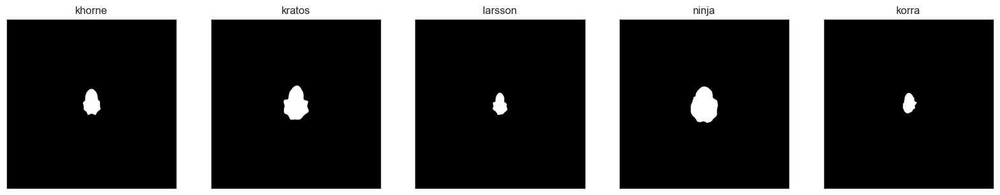

In [34]:
animals = ['khorne', 'kratos', 'larsson', 'ninja', 'korra']
paths_mean_imgs = [os.path.join('../../DATA/1T/trajectories', animal, f'mean_frames_{animal}.png') for animal in animals]
mean_imgs_dict = {}
for animal, path_mean_img in zip(animals,paths_mean_imgs):
    img = cv2.imread(path_mean_img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    threshold = threshold_otsu(img)
    mask = img > threshold

    mean_imgs_dict[animal] = mask

fig, axs = plt.subplots(1,5, figsize=(20,4))

for ax, animal in zip(axs, animals):
    ax.imshow(mean_imgs_dict[animal], cmap='gray')
    ax.set_title(animal, fontsize=12)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')

plt.show(fig)
plt.close(fig)

In [35]:
## defining the four quadrants of the image
## they are defined as the four quadrants of a cartesian plane
## with the format (x1, y1, x2, y2)
q1 = (0, 0, 299, 299)
q2 = (299, 0, 600, 299)
q3 = (299, 299, 600, 600)
q4 = (0, 299, 299, 600)
quadrants = [q1, q2, q3, q4]

show = False
make_display_video = True

threshold = 10

convex_hull_coordinates = []

pbar = tqdm (total=len(data), position=0, leave=True)
#for row in data[data['condition'] == 'Food_eaten'].iloc[:1].iterrows():
for row in data.iloc[:].iterrows():
    if verbose:
        print(row)
    condition = row[1]['condition']
    final_approach_indexes = row[1]['final_approach_indexes']
    if condition == 'Food_eaten':
        crossing_index = int(row[1]['crossing_indexes'])
    else:
        crossing_index = final_approach_indexes[-1]
    subdir = row[1]['subdir']
    path_rotated_video = os.path.join(subdir, 'rotated_bg_sub_fc_video.mp4')
    animal = row[1]['animal']

    cap = cv2.VideoCapture(path_rotated_video)
    frames = []
    for i in range(0, int(cap.get(cv2.CAP_PROP_FRAME_COUNT))):
        ret, frame = cap.read()
        if ret:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            frames.append(frame)
        else:
            print(f'frame {i} not read, {subdir}')
            break
    cap.release()

    mean_animal_mask = mean_imgs_dict[animal]

    frames = frames[final_approach_indexes[0]:final_approach_indexes[1]]
    tframes = []
    for frame in frames:
        tframe = frame.copy()
        tframe = tframe > threshold
        tframe = closing(tframe, square(3))
        tframe = clear_border(tframe)

        label_image = label(tframe)
        regions = regionprops(label_image)

        ## keep all regions which intersect with mean_animal_mask
        fused_mask = np.zeros_like(tframe)
        for region in regions:
            if np.any(mean_animal_mask[region.coords[:, 0], region.coords[:, 1]]):
                # Set the pixels of this region to 1 (or true) in the fused_mask
                fused_mask[region.coords[:, 0], region.coords[:, 1]] = 1
        tframes.append(fused_mask)
    tframes = np.array(tframes)
    del frames

    ## get the convex hull of each tframe
    convex_hulls = []
    for tframe in tframes:
        tframe = tframe.copy()
        tframe = tframe.astype(np.uint8)
        contours, hierarchy = cv2.findContours(tframe, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

        # Create an empty list to collect points from all contours
        all_points = []

        # Iterate over all contours and add their points to the list
        for contour in contours:
            for point in contour:
                all_points.append(point)

        # Check if there are any points collected
        if len(all_points) > 0:
            # Convert the list of points to a numpy array
            all_points = np.array(all_points, dtype=np.int32)

            # Compute the convex hull for the combined set of points
            convex_hull = cv2.convexHull(all_points)
            convex_hulls.append(convex_hull)
        else:
            convex_hulls.append(np.array([]))

    convex_hull_coordinates.append(convex_hulls)

    if show:
        show_n_frames = 5
        fig, axs = plt.subplots(1, show_n_frames, figsize=(show_n_frames*4, 4))
        # Total number of frames
        total_frames = len(tframes)
        # Compute indices of frames to display
        f_idxs = np.linspace(0, total_frames - 1, show_n_frames, dtype=int)

        for i, idx in enumerate(f_idxs):

            tframe = tframes[idx].copy()
            tframe[mean_animal_mask] = 0
            axs[i].imshow(tframe, cmap='gray')

            ## draw the convex hull
            convex_hull = convex_hulls[idx]
            convex_hull = convex_hull.reshape(convex_hull.shape[0], convex_hull.shape[2])
            axs[i].scatter(convex_hull[:, 0], convex_hull[:, 1], s=50, color='red', marker='.')
            ## draw the line between the convex hull points, and the first point
            axs[i].plot([p[0] for p in convex_hull]+[convex_hull[0][0]],
                        [p[1] for p in convex_hull]+[convex_hull[0][1]], color='red')

            axs[i].set_xticks([])
            axs[i].set_yticks([])
            axs[i].set_title(f'frame {i}')

        plt.show(fig)
        plt.close(fig)

    if make_display_video:
        path_video = os.path.join(subdir, 'area_calculation_diagostic_video.mp4')
        video = cv2.VideoWriter(path_video,
                                cv2.VideoWriter_fourcc(*'mp4v'),
                                10,
                                (600, 600))
        for idx in range(len(tframes)):
            tframe = tframes[idx].copy()
            tframe = tframe.astype(np.uint8)
            tframe[mean_animal_mask] = 0
            tframe = tframe*255  # Scale to 0-255 for coloring
            tframe = cv2.cvtColor(tframe, cv2.COLOR_GRAY2BGR)  # Convert to BGR for coloring

            # Draw the convex hull
            convex_hull = convex_hulls[idx]
            if len(convex_hull) > 0:
                convex_hull = convex_hull.reshape(convex_hull.shape[0], convex_hull.shape[2])
                for point in convex_hull:
                    cv2.circle(tframe, (point[0], point[1]), 5, (0, 0, 255), -1)  # Red dots

                # Draw line between the convex hull points
                for j in range(len(convex_hull)):
                    if j == len(convex_hull) - 1:
                        cv2.line(tframe, (convex_hull[j][0], convex_hull[j][1]),
                                       (convex_hull[0][0], convex_hull[0][1]), (0, 0, 255), 2)
                    else:
                        cv2.line(tframe, (convex_hull[j][0], convex_hull[j][1]),
                                       (convex_hull[j+1][0], convex_hull[j+1][1]), (0, 0, 255), 2)

            video.write(tframe)

        video.release()

    pbar.update(n=1)
pbar.close()

if len(convex_hull_coordinates) == data.shape[0]:
    data['convex_hull_coordinates'] = convex_hull_coordinates

100%|██████████| 271/271 [58:47<00:00, 13.02s/it]  


In [36]:
data

,inside_food_circle,inside_plume,animal,subdir,condition,inBox,mex,mey,lex,ley,...,in_plume_feeding,heading_offset_angles,trimmed_speed_zscores,shells,shells_peaks,shells_heights,shifted_heading_offset_angles,closest_peaks,distance_to_closest_peaks,convex_hull_coordinates
0,"[False, False, False, False, False, False, Fal...","[False, False, False, False, False, False, Fal...",khorne,../../DATA/1T/trajectories\khorne\Food_not_eat...,Food_not_eaten,"[True, True, True, True, True, True, True, Tru...","[867.7782321352277, 868.4098868720093, 869.103...","[220.3760096390972, 222.62254504851472, 224.94...","[859.7916990734894, 860.442156655386, 861.1662...","[218.44241288276504, 220.4394524234994, 222.58...",...,NaN,"[2.6299644207730504, 2.583697413719633, 2.5351...","[0.4770660329149106, 0.5204367351313224, 0.510...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.55, 68.25, 9...","[[8, 15, 26, 29, 40, 49, 51, 68, 72, 85], [8, ...","[[92.0, 205.3, 242.45, 168.35, 255.0, 80.45, 1...","[8.142816227815567, 8.879178515277461, 9.65239...","[8, 8, 8, 8, 17, 17, 17, 16, 16, 16, 16, 28, 2...","[0.14281622781556713, 0.8791785152774612, 1.65...","[[[[362 214]], [[364 215]], [[368 219]], [[384..."
1,"[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Tru...",khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[401.3909255130658, 403.8310148211872, 406.165...","[440.34594049593426, 440.4824909345147, 440.96...","[408.7892003231359, 411.0060588383548, 413.219...","[436.9547971787284, 436.8070729969831, 437.059...",...,NaN,"[-1.085101244762082, -0.8926430668695644, -0.7...","[0.5323052922880918, 0.5026065553112394, 0.496...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[49, 58], [49, 57], [49, 57], [48, 57], [48, ...","[[192.0, 255.0], [242.8, 255.0], [155.85, 255....","[67.2699226859054, 64.20685565090004, 62.07784...","[58, 57, 57, 57, 57, 57, 56, 56, 55, 55, 54, 5...","[9.2699226859054, 7.206855650900039, 5.0778413...","[[[[364 311]], [[345 361]], [[344 363]], [[343..."
2,"[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Tru...",khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[657.559289183019, 658.3439227389397, 659.9528...","[962.4270136912726, 957.2867360210096, 950.986...","[649.7691473232626, 650.6390723674978, 652.283...","[965.5508825641546, 960.0525758525707, 953.351...",...,NaN,"[0.5328455307379418, 0.5946745506445323, 0.600...","[1.9129923731451706, 2.5656317767274475, 2.964...","[[143.65, 230.35, 255.0, 193.8, 57.2, 18.9, 3....","[[2, 20, 24, 29, 37, 42, 76, 79, 81, 85, 88, 9...","[[255.0, 116.55, 255.0, 129.7, 141.85, 28.0, 2...","[41.51949998786321, 40.5354605733971, 40.44219...","[42, 37, 38, 38, 34, 33, 33, 33, 32, 33, 35, 4...","[-0.48050001213678684, 3.5354605733971027, 2.4...","[[[[402 101]], [[404 102]], [[405 103]], [[422..."
3,"[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Tru...",khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[559.7323709455363, 563.1621348289987, 565.898...","[964.6595078906078, 963.7740012767802, 963.078...","[559.3690616385084, 562.5784141925504, 565.259...","[955.8815683918298, 954.8029135622764, 953.953...",...,NaN,"[-0.21130003107253903, -0.1838286687050039, -0...","[1.0825560763349662, 0.7224404904567661, 0.451...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.25, 0.4...","[[24, 44, 48, 50, 56], [23, 44, 52, 56], [22, ...","[[255.0, 255.0, 117.1, 131.7, 255.0], [255.0, ...","[53.36294444206656, 52.925724130640376, 52.644...","[56, 52, 56, 57, 56, 56, 56, 56, 43, 43, 42, 4...","[-2.6370555579334365, 0.9257241306403756, -3.3...","[[[[300 256]], [[330 272]], [[359 306]], [[362..."
4,"[False, False, False, False, False, False, Fal...","[True, True, 

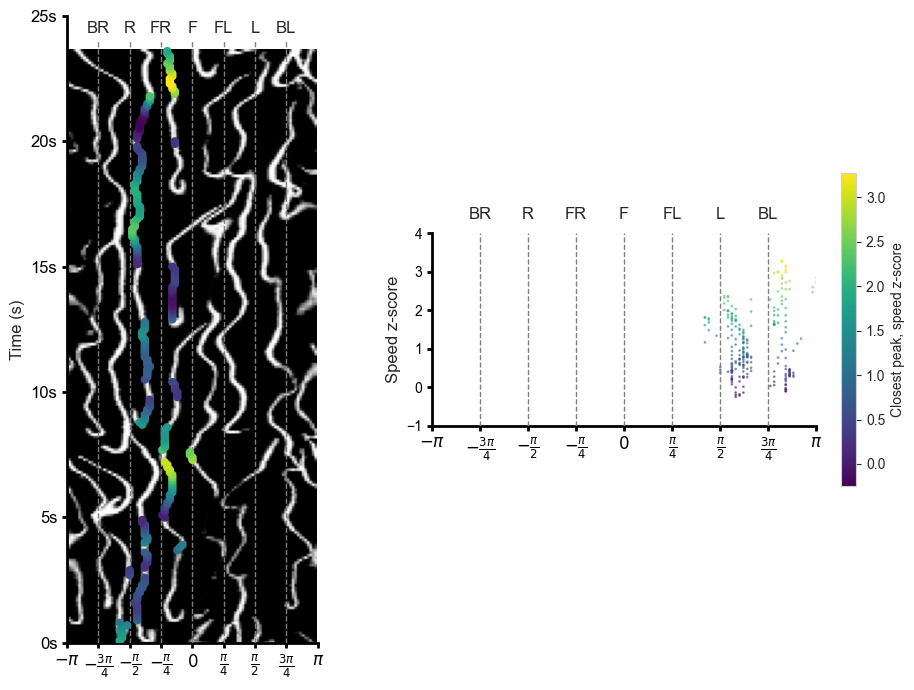

In [37]:
for row in data[data['condition'] == 'Food_eaten'].iloc[:1].iterrows():
    closest_peaks = row[1]['closest_peaks'][:250]
    distance_to_closest_peaks = row[1]['distance_to_closest_peaks'][:250]
    shells = row[1]['shells'][:250]
    speed_zscores = row[1]['trimmed_speed_zscores'][:250]

    fig, axs = plt.subplots(1, 2, figsize=(10,7))

    ax = axs[0]
    ax.imshow(shells, cmap='Greys_r', zorder=1)
    xticks = np.arange(0, N_angular_bins_shell+N_angular_bins_shell/8, N_angular_bins_shell/8)
    xlabs = [r'$-\pi$',r'$-\frac{3\pi}{4}$',r'$-\frac{\pi}{2}$',r'$-\frac{\pi}{4}$',r'$0$',
        r'$\frac{\pi}{4}$',r'$\frac{\pi}{2}$',r'$\frac{3\pi}{4}$',r'$\pi$']
    region_texts = ['BR', 'R', 'FR', 'F', 'FL', 'L', 'BL']

    yticks = [0, 50, 100, 150, 200, 250]
    ylabs = [str(int(s/10))+'s' for s in yticks]
    ax.set_yticks(yticks)
    ax.set_yticklabels(ylabs, fontsize=12)

    for i, xtick in enumerate(xticks[1:-1]):
        ax.plot([xtick, xtick], [0, 240], color='grey', linewidth=1, zorder=3, alpha=1, linestyle='--')
        text = region_texts[i]
        ax.text(xtick, 245, text, horizontalalignment='center', verticalalignment='center', fontsize=12, zorder=3)

    ax.set_xlim([0, N_angular_bins_shell])
    ax.set_xticks(xticks)
    ax.set_xticklabels(xlabs, fontsize=12)

    ax.set_ylim([0, 250])

    c = speed_zscores
    vmin = np.min(speed_zscores)
    vmax = np.max(speed_zscores)

    g = ax.scatter(closest_peaks, np.arange(len(closest_peaks)), c=c, vmin=vmin, vmax=vmax, s=25, zorder=3, cmap='viridis')

    ## turn off grid
    ax.grid(color='white')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ## make the spline thicker and black
    for axis in ['bottom', 'left']:
        ax.spines[axis].set_linewidth(2)
        ax.spines[axis].set_color('black')
    ## set ticks to visible
    ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True)
    ax.tick_params(axis='y', which='both', left=True, right=False, labelleft=True)
    ## make the ticks markers thicker
    ax.tick_params(axis='x', width=2, colors='black')
    ax.tick_params(axis='y', width=2, colors='black')

    ax.set_ylabel('Time (s)', fontsize=12)

    ax=axs[1]

    ax.scatter(closest_peaks, speed_zscores, s=1, c=c, alpha=0.5, cmap ='viridis')
    cmap = plt.cm.viridis
    norm = plt.Normalize(vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    fig.colorbar(sm, ax=ax, label='Closest peak, speed z-score', shrink=.5)

    shift = N_angular_bins_shell/2
    xticks = np.arange(-shift, (N_angular_bins_shell-shift)+N_angular_bins_shell/8, N_angular_bins_shell/8)
    xlabs = [r'$-\pi$',r'$-\frac{3\pi}{4}$',r'$-\frac{\pi}{2}$',r'$-\frac{\pi}{4}$',r'$0$',
        r'$\frac{\pi}{4}$',r'$\frac{\pi}{2}$',r'$\frac{3\pi}{4}$',r'$\pi$']
    region_texts = ['BR', 'R', 'FR', 'F', 'FL', 'L', 'BL']

    for i, xtick in enumerate(xticks[1:-1]):
        ax.plot([xtick, xtick], [-1,4], color='grey', linewidth=1, zorder=3, alpha=1, linestyle='--')
        text = region_texts[i]
        ax.text(xtick, 4.5, text, horizontalalignment='center', verticalalignment='center', fontsize=12, zorder=3)

    ax.set_xlim([0, N_angular_bins_shell])
    ax.set_xticks(xticks)
    ax.set_xticklabels(xlabs, fontsize=12)

    ax.set_ylabel('Speed z-score', fontsize=12)

    ax.set_xlim([-50, 50])
    ax.set_ylim([-1, 4])

    ## turn off grid
    ax.grid(color='white')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ## make the spline thicker and black
    for axis in ['bottom', 'left']:
        ax.spines[axis].set_linewidth(2)
        ax.spines[axis].set_color('black')
    ## set ticks to visible
    ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True)
    ax.tick_params(axis='y', which='both', left=True, right=False, labelleft=True)
    ## make the ticks markers thicker
    ax.tick_params(axis='x', width=2, colors='black')
    ax.tick_params(axis='y', width=2, colors='black')

    ax.set_aspect(10)

    fig.tight_layout()

    plt.show(fig)
    plt.close(fig)


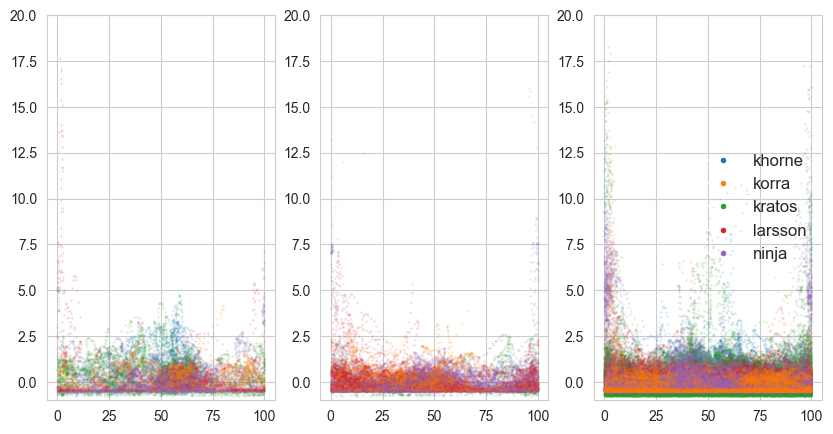

In [38]:
fig, axs = plt.subplots(1, 3, figsize=(10, 5))

animals = np.unique(data['animal'].values)
animals_color_ket = {animals[0]: '#1f77b4', animals[1]: '#ff7f0e', animals[2]: '#2ca02c', animals[3]: '#d62728', animals[4]: '#9467bd'}

for i, condition in enumerate(conditions):
    ax=axs[i]
    tmp = data[data['condition']==condition]

    animals_list = tmp['animal'].values

    trimmed_speed_zscores = tmp['trimmed_speed_zscores'].values

    heading_offset_angles = tmp['shifted_heading_offset_angles']

    for animal, hoa, sp in zip(animals_list, heading_offset_angles, trimmed_speed_zscores):
        ax.scatter(hoa, sp, s=1, c=animals_color_ket[animal], alpha=0.1)

    ax.set_ylim(-1, 20)

## legend
lines = [Line2D([0], [0], marker='o', color='w', label=animal, markerfacecolor=animals_color_ket[animal], markersize=5) for animal in animals]
labels = [animal for animal in animals]
ax.legend(lines, labels, loc='right', frameon=False, fontsize=12)

plt.show(fig)
plt.close(fig)

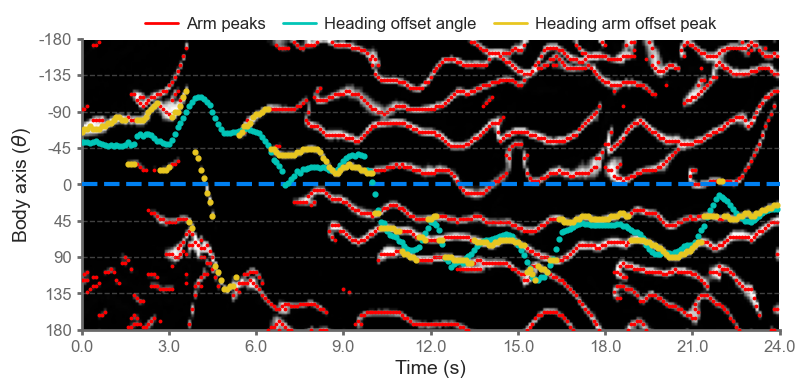

In [39]:
heading_offset_color = '#02C5B7'
heading_arm_offset_color = "#E8C620"
peaks_color = "#FF0000"
bodyaxis_color = '#0080F1'

fig, ax = plt.subplots(1, 1, figsize=(12, 4))  # Adjusted the figsize for better aspect ratio after rotation

stt, stp = 120, 360

xtick_step = 30
xticks = np.arange(0, stp-stt+xtick_step, xtick_step)
xlabs = xticks/10

scatter_size = 3

# Rotate the image by 90 degrees
ax.imshow(np.flipud(np.rot90(shell_pixel_values[stt:stp])), cmap='Greys_r', zorder=2, )
          #extent=[0, len(peaks_list[stt:stp]), 0, (N_angular_bins_shell)+N_angular_bins_shell/8])

for i, pks in enumerate(peaks_list[stt:stp]):
    ax.scatter(np.ones_like(pks)*i, pks, c=peaks_color, s=scatter_size, zorder=3)  # Swapped x and y

ax.scatter(np.arange(0, len(shifted_heading_offset_angles[stt:stp])), shifted_heading_offset_angles[stt:stp], c=heading_offset_color, s=scatter_size*4, zorder=4)  # Swapped x and y
ax.scatter(np.arange(0, len(closest_peaks_to_HoAs[stt:stp])), closest_peaks_to_HoAs[stt:stp], c=heading_arm_offset_color, s=scatter_size*4, zorder=5)  # Swapped x and y

yticks = np.arange(0, (N_angular_bins_shell)+N_angular_bins_shell/8, N_angular_bins_shell/8)  # yticks instead of xticks
ylabs = [r'$\pi$',r'$\frac{3\pi}{4}$',r'$\frac{\pi}{2}$',r'$\frac{\pi}{4}$',
         r'$0$',
         r'$-\frac{\pi}{4}$',r'$-\frac{\pi}{2}$',r'$-\frac{3\pi}{4}$',r'$-\pi$']  # ylabs instead of xlabs
ylabs = [180, 135, 90, 45, 0, -45, -90, -135, -180]

for i, ytick in enumerate(yticks[1:-1]):

    ## check if middle ytick
    if i == 3:
        ax.plot([0, len(peaks_list[stt:stp])],
                [ytick, ytick], color=bodyaxis_color ,
                linewidth=3, zorder=3, alpha=1, linestyle='--')  # Adjusted for horizontal lines
    else:
        ax.plot([0, len(peaks_list[stt:stp])],
                [ytick, ytick], color='grey',
                linewidth=1, zorder=3, alpha=0.5, linestyle='--')  # Adjusted for horizontal lines

ax.set_xticks(xticks)
ax.set_xticklabels(xlabs, fontsize=12)

ax.set_yticks(yticks)  # Setting y ticks
ax.set_yticklabels(ylabs, fontsize=12)  # Setting y labels

axis_color = 'dimgrey'
## turn off grid
ax.grid(color='white')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
## make the spline thicker and black
for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2)
    ax.spines[axis].set_color(axis_color)

## set ticks to visible
ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True)
ax.tick_params(axis='y', which='both', left=True, right=False, labelleft=True)
## make the ticks markers thicker
ax.tick_params(axis='x', width=2, colors=axis_color)
ax.tick_params(axis='y', width=2, colors=axis_color)

ax.set_xlim(xticks[0], xticks[-1])
ax.set_ylim(yticks[0], yticks[-1])

## make legend
lines = [Line2D([0], [0], color=peaks_color, lw=2),
        Line2D([0], [0], color=heading_offset_color, lw=2),
        Line2D([0], [0], color=heading_arm_offset_color, lw=2)]
labels = ['Arm peaks', 'Heading offset angle', 'Heading arm offset peak']
# Adjust the font size, and reposition the legend. Also, adjust the spacing if necessary.
legend = ax.legend(lines, labels, loc='upper center', fontsize=12,  # Smaller font size
                   bbox_to_anchor=(0.5, 1.1), ncol=3,
                   borderaxespad=0., frameon=False,
                   columnspacing=1.0, handletextpad=0.5)  # Adjust spacing


ax.set_ylabel(r'Body axis ($\theta$)', fontsize=14)
ax.set_xlabel('Time (s)', fontsize=14)

fig.tight_layout()

name_fig = 'shell_trace_example.png'
fig.savefig(os.path.join(target_dir, name_fig), dpi=300, transparent=True)

plt.show(fig)
plt.close(fig)

In [40]:
data.columns

Index(['inside_food_circle', 'inside_plume', 'animal', 'subdir', 'condition',
       'inBox', 'mex', 'mey', 'lex', 'ley', 'rex', 'rey', 'bodyaxis_angle',
       'dx', 'dy', 'speed', 'zscore_speed', 'final_approach_indexes',
       'crossing_indexes', 'in_plume_feeding', 'heading_offset_angles',
       'trimmed_speed_zscores', 'shells', 'shells_peaks', 'shells_heights',
       'shifted_heading_offset_angles', 'closest_peaks',
       'distance_to_closest_peaks', 'convex_hull_coordinates'],
      dtype='object')

../../DATA/1T/trajectories\khorne\Food_not_eaten\0


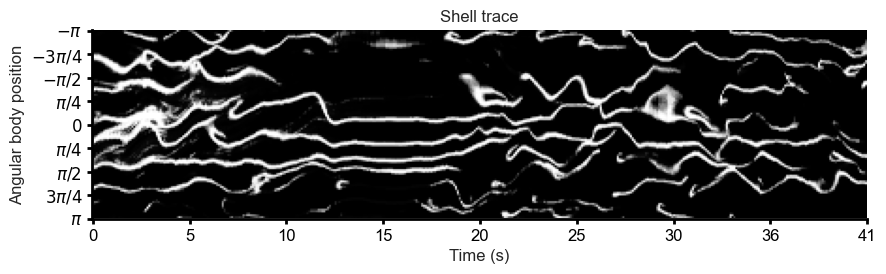

In [41]:

for row in data.iloc[:1].iterrows():
    fig, ax = plt.subplots(1, 1, figsize=(10,5))

    shell = row[1]['shells']
    subdir = row[1]['subdir']
    print(subdir)
    path_fig = os.path.join(subdir, 'shell_trace.png')

    # plot shell rotated 90 degrees
    # shell is an image
    shell = np.rot90(shell, k=1)
    ax.imshow(shell, cmap='Greys_r', zorder=2)

    h = shell.shape[1]
    xticks = np.arange(0, h+h/8, h/8)
    ax.set_xticks(xticks)
    xlabs = (xticks/10).astype(int)
    ax.set_xticklabels(xlabs, fontsize=12)

    yticks = np.arange(0, (N_angular_bins_shell)+N_angular_bins_shell/8, N_angular_bins_shell/8)
    ylabs = [r'$-\pi$',r'$-3\pi/4$',r'$-\pi/2$',r'$\pi/4$',r'$0$',
        r'$\pi/4$',r'$\pi/2$',r'$3\pi/4$',r'$\pi$']
    ax.set_yticks(yticks)
    ax.set_yticklabels(ylabs, fontsize=12)

    ax.set_ylabel('Angular body position', fontsize=12)
    ax.set_xlabel('Time (s)', fontsize=12)
    ax.set_title('Shell trace', fontsize=12)

    ## turn off grid
    ax.grid(color='white')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ## make the spline thicker and black
    for axis in ['bottom', 'left']:
        ax.spines[axis].set_linewidth(2)
        ax.spines[axis].set_color('black')
    ## set ticks to visible
    ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True)
    ax.tick_params(axis='y', which='both', left=True, right=False, labelleft=True)
    ## make the ticks markers thicker
    ax.tick_params(axis='x', width=2, colors='black')
    ax.tick_params(axis='y', width=2, colors='black')

    fig.savefig(path_fig, dpi=300, bbox_inches='tight')

    plt.show(fig)
    plt.close(fig)


In [42]:
data

,inside_food_circle,inside_plume,animal,subdir,condition,inBox,mex,mey,lex,ley,...,in_plume_feeding,heading_offset_angles,trimmed_speed_zscores,shells,shells_peaks,shells_heights,shifted_heading_offset_angles,closest_peaks,distance_to_closest_peaks,convex_hull_coordinates
0,"[False, False, False, False, False, False, Fal...","[False, False, False, False, False, False, Fal...",khorne,../../DATA/1T/trajectories\khorne\Food_not_eat...,Food_not_eaten,"[True, True, True, True, True, True, True, Tru...","[867.7782321352277, 868.4098868720093, 869.103...","[220.3760096390972, 222.62254504851472, 224.94...","[859.7916990734894, 860.442156655386, 861.1662...","[218.44241288276504, 220.4394524234994, 222.58...",...,NaN,"[2.6299644207730504, 2.583697413719633, 2.5351...","[0.4770660329149106, 0.5204367351313224, 0.510...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.55, 68.25, 9...","[[8, 15, 26, 29, 40, 49, 51, 68, 72, 85], [8, ...","[[92.0, 205.3, 242.45, 168.35, 255.0, 80.45, 1...","[8.142816227815567, 8.879178515277461, 9.65239...","[8, 8, 8, 8, 17, 17, 17, 16, 16, 16, 16, 28, 2...","[0.14281622781556713, 0.8791785152774612, 1.65...","[[[[362 214]], [[364 215]], [[368 219]], [[384..."
1,"[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Tru...",khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[401.3909255130658, 403.8310148211872, 406.165...","[440.34594049593426, 440.4824909345147, 440.96...","[408.7892003231359, 411.0060588383548, 413.219...","[436.9547971787284, 436.8070729969831, 437.059...",...,NaN,"[-1.085101244762082, -0.8926430668695644, -0.7...","[0.5323052922880918, 0.5026065553112394, 0.496...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[49, 58], [49, 57], [49, 57], [48, 57], [48, ...","[[192.0, 255.0], [242.8, 255.0], [155.85, 255....","[67.2699226859054, 64.20685565090004, 62.07784...","[58, 57, 57, 57, 57, 57, 56, 56, 55, 55, 54, 5...","[9.2699226859054, 7.206855650900039, 5.0778413...","[[[[364 311]], [[345 361]], [[344 363]], [[343..."
2,"[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Tru...",khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[657.559289183019, 658.3439227389397, 659.9528...","[962.4270136912726, 957.2867360210096, 950.986...","[649.7691473232626, 650.6390723674978, 652.283...","[965.5508825641546, 960.0525758525707, 953.351...",...,NaN,"[0.5328455307379418, 0.5946745506445323, 0.600...","[1.9129923731451706, 2.5656317767274475, 2.964...","[[143.65, 230.35, 255.0, 193.8, 57.2, 18.9, 3....","[[2, 20, 24, 29, 37, 42, 76, 79, 81, 85, 88, 9...","[[255.0, 116.55, 255.0, 129.7, 141.85, 28.0, 2...","[41.51949998786321, 40.5354605733971, 40.44219...","[42, 37, 38, 38, 34, 33, 33, 33, 32, 33, 35, 4...","[-0.48050001213678684, 3.5354605733971027, 2.4...","[[[[402 101]], [[404 102]], [[405 103]], [[422..."
3,"[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Tru...",khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[559.7323709455363, 563.1621348289987, 565.898...","[964.6595078906078, 963.7740012767802, 963.078...","[559.3690616385084, 562.5784141925504, 565.259...","[955.8815683918298, 954.8029135622764, 953.953...",...,NaN,"[-0.21130003107253903, -0.1838286687050039, -0...","[1.0825560763349662, 0.7224404904567661, 0.451...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.25, 0.4...","[[24, 44, 48, 50, 56], [23, 44, 52, 56], [22, ...","[[255.0, 255.0, 117.1, 131.7, 255.0], [255.0, ...","[53.36294444206656, 52.925724130640376, 52.644...","[56, 52, 56, 57, 56, 56, 56, 56, 43, 43, 42, 4...","[-2.6370555579334365, 0.9257241306403756, -3.3...","[[[[300 256]], [[330 272]], [[359 306]], [[362..."
4,"[False, False, False, False, False, False, Fal...","[True, True, 

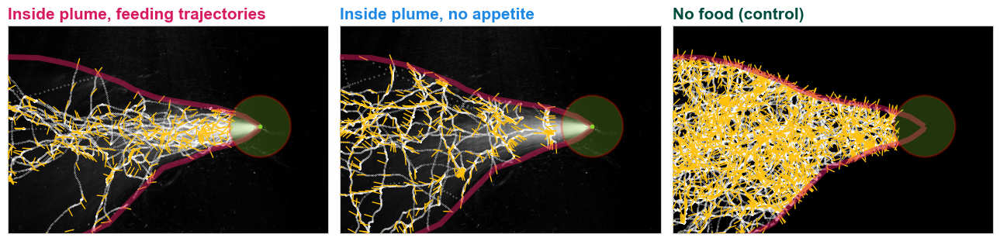

In [57]:
color_key = {'Food_eaten': '#D81B60',
                'Food_not_eaten': '#1E88E5',
               'No_food_Control': '#004D40'}

bodyaxis_ss = 30
bodyaxis_scalar = 30
bodyaxis_color = '#FFC107'

xlim = (400, 1550)
ylim = (965, 220)

fig, axs = plt.subplots(1,3,figsize=(13,5))

ax=axs[0]
condition = 'Food_eaten'
tmp = data[data['condition']==condition]
for i, row in enumerate(tmp.iloc[0:].iterrows()):

    tmptmp = row[1]
    app_idxs = tmptmp['final_approach_indexes']
    inPlume = tmptmp['inside_plume']
    inFood = tmptmp['inside_food_circle']

    ## get indexes where inPlume == True and inFood == False
    testIdxs = np.where((inPlume==True) & (inFood==False))[0]

    x = tmptmp['mex'][testIdxs]
    y = tmptmp['mey'][testIdxs]

    bodyaxis = tmptmp['bodyaxis_angle'][testIdxs]
    for j in range(0, len(bodyaxis), bodyaxis_ss):
        ## get unitvector bodyaxis
        angle = bodyaxis[j]
        x1 = x[j]
        y1 = y[j]
        x2 = x1 + bodyaxis_scalar*np.cos(angle)
        y2 = y1 + bodyaxis_scalar*np.sin(angle)

        ax.plot([x1, x2], [y1, y2], color=bodyaxis_color, linewidth=1, zorder=3)

    ax.scatter(x, y, color='white', linewidth=1, zorder=2, s=.05)

ax.imshow(frames_std, cmap='Greys_r', zorder=1, vmax=100)

poly = plt.Polygon(plume_vertices, facecolor='none', edgecolor='#D81B60', linewidth=5, alpha=0.5, zorder=3)
ax.add_patch(poly)

food_circle = plt.Circle(food_location, food_radius, facecolor=crossing_color_key['food_circle'], alpha=0.25, zorder=3, edgecolor='red', linewidth=2)
ax.add_patch(food_circle)
ax.scatter(food_location[0], food_location[1], color=crossing_color_key['food_circle'], marker='o', s=10, zorder=3)

ax.set_aspect('equal')
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Inside plume, feeding trajectories', fontsize=15, loc='left', color=color_key[condition], fontweight='bold')
## add text to the plots top right
#ax.text(-1.5, 0.95, 'Odor tracking', color=color_key[condition], ha='right', fontsize=15)

ax.set_xticks([])
ax.set_yticks([])

##
ax = axs[1]
condition = 'Food_not_eaten'

tmp = data[data['condition']==condition]
for i, row in enumerate(tmp.iloc[0:].iterrows()):

    tmptmp = row[1]
    app_idxs = tmptmp['final_approach_indexes']
    inPlume = tmptmp['inside_plume']
    inFood = tmptmp['inside_food_circle']

    ## get indexes where inPlume == True and inFood == False
    testIdxs = np.where((inPlume==True) & (inFood==False))[0]

    x = tmptmp['mex'][testIdxs]
    y = tmptmp['mey'][testIdxs]
    bodyaxis = tmptmp['bodyaxis_angle'][testIdxs]
    for j in range(0, len(bodyaxis), bodyaxis_ss):
        ## get unitvector bodyaxis
        angle = bodyaxis[j]
        x1 = x[j]
        y1 = y[j]
        x2 = x1 + bodyaxis_scalar*np.cos(angle)
        y2 = y1 + bodyaxis_scalar*np.sin(angle)

        ax.plot([x1, x2], [y1, y2], color=bodyaxis_color, linewidth=1, zorder=3)

    ax.scatter(x, y, color='white', linewidth=1, zorder=2, s=.05)

ax.imshow(frames_std, cmap='Greys_r', zorder=1, vmax=100)

poly = plt.Polygon(plume_vertices, facecolor='none', edgecolor='#D81B60', linewidth=5, alpha=0.5, zorder=3)
ax.add_patch(poly)

food_circle = plt.Circle(food_location, food_radius, facecolor=crossing_color_key['food_circle'], alpha=0.25, zorder=3, edgecolor='red', linewidth=2)
ax.add_patch(food_circle)
ax.scatter(food_location[0], food_location[1], color=crossing_color_key['food_circle'], marker='o', s=10, zorder=3)

ax.set_aspect('equal')
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('Inside plume, no appetite', fontsize=15, loc='left', color=color_key[condition], fontweight='bold')

ax.set_xticks([])
ax.set_yticks([])

##
ax = axs[2]
condition = 'No_food_Control'

tmp = data[data['condition']==condition]
for i, row in enumerate(tmp.iloc[0:].iterrows()):

    tmptmp = row[1]
    app_idxs = tmptmp['final_approach_indexes']
    inPlume = tmptmp['inside_plume']
    inFood = tmptmp['inside_food_circle']

    ## get indexes where inPlume == True and inFood == False
    testIdxs = np.where((inPlume==True) & (inFood==False))[0]

    x = tmptmp['mex'][testIdxs]
    y = tmptmp['mey'][testIdxs]

    bodyaxis = tmptmp['bodyaxis_angle'][testIdxs]
    for j in range(0, len(bodyaxis), bodyaxis_ss):
        ## get unitvector bodyaxis
        angle = bodyaxis[j]
        x1 = x[j]
        y1 = y[j]
        x2 = x1 + bodyaxis_scalar*np.cos(angle)
        y2 = y1 + bodyaxis_scalar*np.sin(angle)

        ax.plot([x1, x2], [y1, y2], color=bodyaxis_color, linewidth=1, zorder=3)

    ax.scatter(x, y, color='white', linewidth=1, zorder=2, s=.05)

background = np.zeros(frames_std.shape, dtype=np.uint8)
ax.imshow(background, cmap='Greys_r', zorder=1, vmax=100)

poly = plt.Polygon(plume_vertices, facecolor='none', edgecolor='#D81B60', linewidth=5, alpha=0.5, zorder=3)
ax.add_patch(poly)

food_circle = plt.Circle(food_location, food_radius, facecolor=crossing_color_key['food_circle'], alpha=0.25, zorder=3, edgecolor='red', linewidth=2)
ax.add_patch(food_circle)
#ax.scatter(food_location[0], food_location[1], color=crossing_color_key['food_circle'], marker='o', s=10, zorder=3)

ax.set_aspect('equal')
ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_title('No food (control)', fontsize=15, loc='left', color=color_key[condition], fontweight='bold')

ax.set_xticks([])
ax.set_yticks([])

fig.tight_layout()

name_fig = '1Trajectories'
path_save = os.path.join(target_dir, name_fig + '.png')
plt.savefig(path_save, dpi=300, transparent=False)

plt.show(fig)
plt.close(fig)

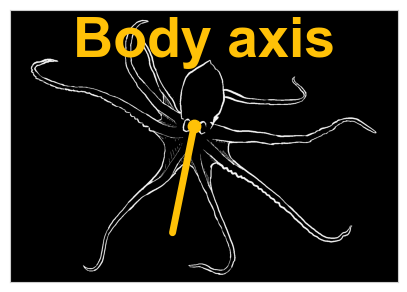

In [44]:

path_octopus_image = os.path.join(target_dir, 'Octopus.png')
octopus_image = cv2.imread(path_octopus_image, cv2.IMREAD_UNCHANGED)
octopus_image = cv2.cvtColor(octopus_image, cv2.COLOR_BGR2GRAY)

xc0, xc1 = 450, 2050
yc0, yc1 = 225, 1350

xem = 760
yem = 480

bodyaxis = np.pi/2+.2
bodyaxis_scalar = 450

octopus_image = octopus_image[yc0:yc1, xc0:xc1]

## draw bodyaxis line on image
x2 = xem + bodyaxis_scalar*np.cos(bodyaxis)
y2 = yem + bodyaxis_scalar*np.sin(bodyaxis)

fig, ax = plt.subplots(1, 1, figsize=(5, 5))

ax.imshow(octopus_image, zorder=1, cmap='Greys_r')

ax.scatter(xem, yem, color=bodyaxis_color, s=80, zorder=2)
ax.plot([xem, x2], [yem, y2], color=bodyaxis_color, linewidth=5, zorder=2)

ax.set_aspect('equal')

ax.text(0.5, 0.88, 'Body axis', fontsize=40, color=bodyaxis_color, fontweight='bold', ha='center', va='center', transform=ax.transAxes)

ax.set_xticks([])
ax.set_yticks([])

name_fig = 'octopus_bodyaxis.png'
path_fig = os.path.join(target_dir, name_fig)
plt.savefig(path_fig, dpi=300, bbox_inches='tight')

plt.show(fig)
plt.close(fig)

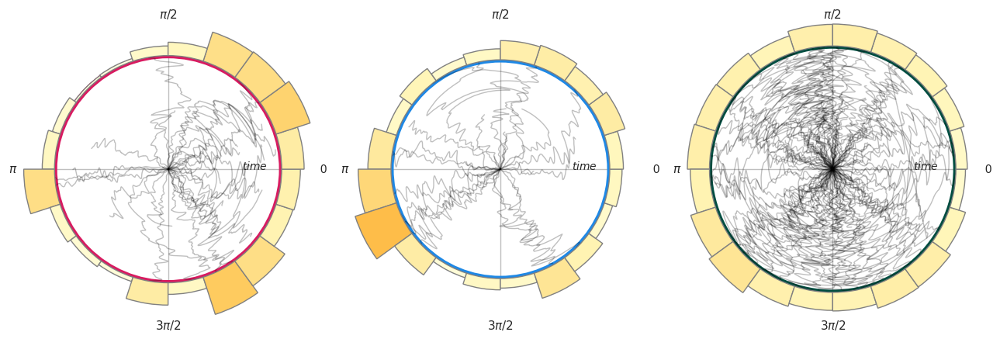

In [45]:
fig, axs = plt.subplots(1,3,figsize=(13,5), subplot_kw={'projection': 'polar'})

max_time = 400

line_alpha=0.25

circle_linewidth = 5

ax=axs[0]
condition = 'Food_eaten'
tmp = data[data['condition']==condition]

nbins = 20
thetas = []

for i, row in enumerate(tmp.iloc[0:].iterrows()):

    tmptmp = row[1]
    app_idxs = tmptmp['final_approach_indexes']
    inPlume = tmptmp['inside_plume']
    inFood = tmptmp['inside_food_circle']

    ## get indexes where inPlume == True and inFood == False
    testIdxs = np.where((inPlume==True) & (inFood==False))[0]

    bodyaxis = tmptmp['bodyaxis_angle'][testIdxs]
    polar_radius = np.arange(0, len(bodyaxis))/max_time


    ax.plot(bodyaxis[:max_time], polar_radius[:max_time], color='black', alpha=line_alpha, linewidth=1, zorder=2)

    ## concatenate bodyaxis angles
    thetas = np.concatenate((thetas, bodyaxis))

#ax.set_rlim(radius_limit)

hist, bin_edges = np.histogram(thetas, nbins, range = [-3/2*np.pi, np.pi/2], density=True)
bins = [(i + j)/2 for i,j in list(zip(bin_edges[:-1], bin_edges[1:]))]

bars = ax.bar(bins, hist, zorder=4, width=(2*np.pi/nbins), bottom=1)

# Use custom colors and opacity
for r, bar in zip(hist, bars):
    bar.set_facecolor(plt.cm.YlOrBr(r))
    bar.set_alpha(1)
    bar.set_alpha(1)
    bar.set_edgecolor('gray')

ax.set_rticks([])
ax.xaxis.grid([])

circle = plt.Circle((0,0), 1,
                    transform=ax.transData._b, color=color_key[condition], alpha=1, fill=False, linewidth=circle_linewidth)
ax.add_artist(circle)
ax.spines['polar'].set_visible(False)

ax.set_xticks([0, np.pi/2, np.pi, 1.5*np.pi])
ax.set_xticklabels([r'0', r'$\pi/2$', r'$\pi$',r'$3\pi/2$'], fontsize=11)
ax.tick_params(axis='x', which='major', pad=-15)

ax.plot([np.pi, np.pi], [0,1], zorder=0, color='black', linewidth=1, alpha=0.25)
ax.plot([np.pi/2, np.pi/2], [0,1], zorder=0, color='black', linewidth=1, alpha=0.25)
ax.plot([0,0], [0,1], zorder=0, color='black', linewidth=1, alpha=0.25)
ax.plot([np.pi*1.5, np.pi*1.5], [0,1], zorder=0, color='black', linewidth=1, alpha=0.25)

ax.text(0, .65, '$\it{time}$')

ax = axs[1]
condition = 'Food_not_eaten'

tmp = data[data['condition']==condition]
for i, row in enumerate(tmp.iloc[0:].iterrows()):

    tmptmp = row[1]
    app_idxs = tmptmp['final_approach_indexes']
    inPlume = tmptmp['inside_plume']
    inFood = tmptmp['inside_food_circle']

    ## get indexes where inPlume == True and inFood == False
    testIdxs = np.where((inPlume==True) & (inFood==False))[0]

    bodyaxis = tmptmp['bodyaxis_angle'][testIdxs]
    polar_radius = np.arange(0, len(bodyaxis))/max_time


    ax.plot(bodyaxis[:max_time], polar_radius[:max_time], color='black', alpha=line_alpha, linewidth=1, zorder=2)

    ## concatenate bodyaxis angles
    thetas = np.concatenate((thetas, bodyaxis))

#ax.set_rlim(radius_limit)

hist, bin_edges = np.histogram(thetas, nbins, range = [-3/2*np.pi, np.pi/2], density=True)
bins = [(i + j)/2 for i,j in list(zip(bin_edges[:-1], bin_edges[1:]))]

bars = ax.bar(bins, hist, zorder=4, width=(2*np.pi/nbins), bottom=1)

# Use custom colors and opacity
for r, bar in zip(hist, bars):
    bar.set_facecolor(plt.cm.YlOrBr(r))
    bar.set_alpha(1)
    bar.set_alpha(1)
    bar.set_edgecolor('gray')

ax.set_rticks([])
ax.xaxis.grid([])

circle = plt.Circle((0,0), 1,
                    transform=ax.transData._b, color=color_key[condition], alpha=1, fill=False, linewidth=circle_linewidth)
ax.add_artist(circle)
ax.spines['polar'].set_visible(False)

ax.set_xticks([0, np.pi/2, np.pi, 1.5*np.pi])
ax.set_xticklabels([r'0', r'$\pi/2$', r'$\pi$',r'$3\pi/2$'], fontsize=11)
ax.tick_params(axis='x', which='major', pad=-15)

ax.plot([np.pi, np.pi], [0,1], zorder=0, color='black', linewidth=1, alpha=0.25)
ax.plot([np.pi/2, np.pi/2], [0,1], zorder=0, color='black', linewidth=1, alpha=0.25)
ax.plot([0,0], [0,1], zorder=0, color='black', linewidth=1, alpha=0.25)
ax.plot([np.pi*1.5, np.pi*1.5], [0,1], zorder=0, color='black', linewidth=1, alpha=0.25)

ax.text(0, .65, '$\it{time}$')

ax = axs[2]
condition = 'No_food_Control'

tmp = data[data['condition']==condition]
for i, row in enumerate(tmp.iloc[0:].iterrows()):

    tmptmp = row[1]
    app_idxs = tmptmp['final_approach_indexes']
    inPlume = tmptmp['inside_plume']
    inFood = tmptmp['inside_food_circle']

    ## get indexes where inPlume == True and inFood == False
    testIdxs = np.where((inPlume==True) & (inFood==False))[0]

    bodyaxis = tmptmp['bodyaxis_angle'][testIdxs]
    polar_radius = np.arange(0, len(bodyaxis))/max_time


    ax.plot(bodyaxis[:max_time], polar_radius[:max_time], color='black', alpha=line_alpha, linewidth=1, zorder=2)

    ## concatenate bodyaxis angles
    thetas = np.concatenate((thetas, bodyaxis))

#ax.set_rlim(radius_limit)

hist, bin_edges = np.histogram(thetas, nbins, range = [-3/2*np.pi, np.pi/2], density=True)
bins = [(i + j)/2 for i,j in list(zip(bin_edges[:-1], bin_edges[1:]))]

bars = ax.bar(bins, hist, zorder=4, width=(2*np.pi/nbins), bottom=1)

# Use custom colors and opacity
for r, bar in zip(hist, bars):
    bar.set_facecolor(plt.cm.YlOrBr(r))
    bar.set_alpha(1)
    bar.set_edgecolor('gray')

ax.set_rticks([])
ax.xaxis.grid([])

circle = plt.Circle((0,0), 1,
                    transform=ax.transData._b, color=color_key[condition], alpha=1, fill=False, linewidth=circle_linewidth)
ax.add_artist(circle)
ax.spines['polar'].set_visible(False)

ax.set_xticks([0, np.pi/2, np.pi, 1.5*np.pi])
ax.set_xticklabels([r'0', r'$\pi/2$', r'$\pi$',r'$3\pi/2$'], fontsize=11)
ax.tick_params(axis='x', which='major', pad=-15)

ax.plot([np.pi, np.pi], [0,1], zorder=0, color='black', linewidth=1, alpha=0.25)
ax.plot([np.pi/2, np.pi/2], [0,1], zorder=0, color='black', linewidth=1, alpha=0.25)
ax.plot([0,0], [0,1], zorder=0, color='black', linewidth=1, alpha=0.25)
ax.plot([np.pi*1.5, np.pi*1.5], [0,1], zorder=0, color='black', linewidth=1, alpha=0.25)

ax.text(0, .65, '$\it{time}$')

fig.tight_layout()

name_fig = 'bodyaxis_polar_histograms'
fig.savefig(os.path.join(target_dir, name_fig + '.png'), format='png', dpi=300, bbox_inches='tight')

plt.show(fig)
plt.close(fig)

In [46]:
data.columns

Index(['inside_food_circle', 'inside_plume', 'animal', 'subdir', 'condition',
       'inBox', 'mex', 'mey', 'lex', 'ley', 'rex', 'rey', 'bodyaxis_angle',
       'dx', 'dy', 'speed', 'zscore_speed', 'final_approach_indexes',
       'crossing_indexes', 'in_plume_feeding', 'heading_offset_angles',
       'trimmed_speed_zscores', 'shells', 'shells_peaks', 'shells_heights',
       'shifted_heading_offset_angles', 'closest_peaks',
       'distance_to_closest_peaks', 'convex_hull_coordinates'],
      dtype='object')

In [47]:
data['closest_peaks']

0      [8, 8, 8, 8, 17, 17, 17, 16, 16, 16, 16, 28, 2...
1      [58, 57, 57, 57, 57, 57, 56, 56, 55, 55, 54, 5...
2      [42, 37, 38, 38, 34, 33, 33, 33, 32, 33, 35, 4...
3      [56, 52, 56, 57, 56, 56, 56, 56, 43, 43, 42, 4...
4      [32, 32, 32, 32, 32, 31, 32, 32, 32, 33, 33, 3...
                             ...                        
266    [9, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, ...
267    [51, 49, 47, 47, 47, 46, 55, 44, 44, 44, 44, 4...
268    [50, 51, 52, 52, 53, 53, 53, 53, 53, 52, 52, 6...
269    [62, 61, 60, 60, 59, 59, 80, 81, 81, 81, 81, 5...
270    [53, 53, 53, 53, 53, 53, 53, 53, 53, 52, 53, 5...
Name: closest_peaks, Length: 271, dtype: object

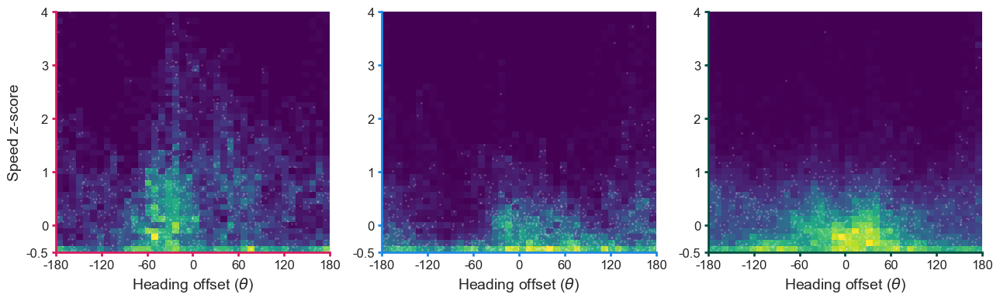

In [48]:
fig, axs = plt.subplots(1,3,figsize=(13,4))

zmax = 4
zmin = -.5
ndots = 1000
coldots = 'white'

bins = [40,40]

yticks = [zmin, 0, 1, 2, 3, zmax]
xticks = [-np.pi, -(2/3)*np.pi, -(1/3)*np.pi, 0, (1/3)*np.pi, (2/3)*np.pi, np.pi]
xticklabels =[-180, -120, -60, 0, 60, 120, 180]

cmap = 'viridis'

### test ###
ax=axs[0]
condition = 'Food_eaten'

heading_offset_angles = []
speed_zscores = []

tmp = data[data['condition']==condition]
for i, row in enumerate(tmp.iloc[0:].iterrows()):

    tmptmp = row[1]
    app_idxs = tmptmp['final_approach_indexes']
    inPlume = tmptmp['inside_plume']
    inFood = tmptmp['inside_food_circle']

    ## get indexes where inPlume == True and inFood == False
    testIdxs = np.where((inPlume==True) & (inFood==False))[0]
    ## if there is a jump in the indexes, drop all indexes after the jump
    if np.any(np.diff(testIdxs) > 1):
        testIdxs = testIdxs[:np.where(np.diff(testIdxs) > 1)[0][0]+1]

    heading_offset_angle = tmptmp['heading_offset_angles'][testIdxs[:-1]]
    speed_zscore = tmptmp['zscore_speed'][testIdxs[:-1]]

    ## concatentate heading offset angles and speed zscores
    heading_offset_angles = np.concatenate((heading_offset_angles, heading_offset_angle))
    speed_zscores = np.concatenate((speed_zscores, speed_zscore))

ax.hist2d(heading_offset_angles, speed_zscores, bins=bins, range=[[-np.pi, np.pi], [zmin, zmax]], cmap=cmap)
random_indices = np.random.choice(np.arange(len(heading_offset_angles)), size=ndots, replace=False)
ax.scatter(heading_offset_angles[random_indices], speed_zscores[random_indices], s=1, color=coldots, alpha=0.15)

ax.set_yticks(yticks)
ax.set_yticklabels(yticks, fontsize=12)

ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels, fontsize=12)

ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True, color=color_key[condition], width=2)
ax.tick_params(axis='y', which='both', left=True, right=False, labelleft=True, color=color_key[condition], width=2)

for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2)
    ax.spines[axis].set_color(color_key[condition])

ax.set_ylabel('Speed z-score', fontsize=14)
ax.set_xlabel(r'Heading offset ($\theta$)', fontsize=14)

### no app ###
ax = axs[1]
condition = 'Food_not_eaten'

heading_offset_angles = []
speed_zscores = []

tmp = data[data['condition']==condition]
for i, row in enumerate(tmp.iloc[0:].iterrows()):

    tmptmp = row[1]
    app_idxs = tmptmp['final_approach_indexes']
    inPlume = tmptmp['inside_plume']
    inFood = tmptmp['inside_food_circle']

    ## get indexes where inPlume == True and inFood == False
    testIdxs = np.where((inPlume==True) & (inFood==False))[0]

    heading_offset_angle = tmptmp['heading_offset_angles'][testIdxs[:-1]]
    speed_zscore = tmptmp['zscore_speed'][testIdxs[:-1]]

    ## concatentate heading offset angles and speed zscores
    heading_offset_angles = np.concatenate((heading_offset_angles, heading_offset_angle))
    speed_zscores = np.concatenate((speed_zscores, speed_zscore))

ax.hist2d(heading_offset_angles, speed_zscores, bins=bins, range=[[-np.pi, np.pi], [zmin, zmax]], cmap=cmap)
random_indices = np.random.choice(np.arange(len(heading_offset_angles)), size=ndots, replace=False)
ax.scatter(heading_offset_angles[random_indices], speed_zscores[random_indices], s=1, color=coldots, alpha=0.15)

ax.set_yticks(yticks)
ax.set_yticklabels(yticks, fontsize=12)

ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels, fontsize=12)

ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True, color=color_key[condition], width=2)
ax.tick_params(axis='y', which='both', left=True, right=False, labelleft=True, color=color_key[condition], width=2)

for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2)
    ax.spines[axis].set_color(color_key[condition])

ax.set_xlabel(r'Heading offset ($\theta$)', fontsize=14)

### control ###
ax = axs[2]
condition = 'No_food_Control'

heading_offset_angles = []
speed_zscores = []

tmp = data[data['condition']==condition]
for i, row in enumerate(tmp.iloc[0:].iterrows()):

    tmptmp = row[1]
    app_idxs = tmptmp['final_approach_indexes']
    inPlume = tmptmp['inside_plume']
    inFood = tmptmp['inside_food_circle']

    ## get indexes where inPlume == True and inFood == False
    testIdxs = np.where((inPlume==True) & (inFood==False))[0]

    heading_offset_angle = tmptmp['heading_offset_angles'][testIdxs[:-1]]
    speed_zscore = tmptmp['zscore_speed'][testIdxs[:-1]]

    ## concatentate heading offset angles and speed zscores
    heading_offset_angles = np.concatenate((heading_offset_angles, heading_offset_angle))
    speed_zscores = np.concatenate((speed_zscores, speed_zscore))

ax.hist2d(heading_offset_angles, speed_zscores, bins=bins, range=[[-np.pi, np.pi], [zmin, zmax]], cmap=cmap)

random_indices = np.random.choice(np.arange(len(heading_offset_angles)), size=ndots, replace=False)
ax.scatter(heading_offset_angles[random_indices], speed_zscores[random_indices], s=1, color=coldots, alpha=0.15)

ax.set_yticks(yticks)
ax.set_yticklabels(yticks, fontsize=12)

ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels, fontsize=12)

ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True, color=color_key[condition], width=2)
ax.tick_params(axis='y', which='both', left=True, right=False, labelleft=True, color=color_key[condition], width=2)

for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2)
    ax.spines[axis].set_color(color_key[condition])

ax.set_xlabel(r'Heading offset ($\theta$)', fontsize=14)

fig.tight_layout()

name_fig = 'heading_offset_vs_speed_zscore.png'
fig.savefig(os.path.join(target_dir, name_fig), dpi=300, transparent=True)

plt.show(fig)
plt.close(fig)

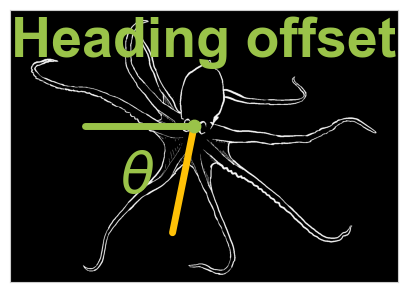

In [49]:
heading_offset_color = "#9AC349"

path_octopus_image = os.path.join(target_dir, 'Octopus.png')
octopus_image = cv2.imread(path_octopus_image, cv2.IMREAD_UNCHANGED)
octopus_image = cv2.cvtColor(octopus_image, cv2.COLOR_BGR2GRAY)

xc0, xc1 = 450, 2050
yc0, yc1 = 225, 1350

xem = 760
yem = 480

bodyaxis = np.pi/2+.2
bodyaxis_scalar = 450

heading_offset = np.pi
heading_offset_scalar = 450

octopus_image = octopus_image[yc0:yc1, xc0:xc1]

## draw bodyaxis line on image
x2 = xem + bodyaxis_scalar*np.cos(bodyaxis)
y2 = yem + bodyaxis_scalar*np.sin(bodyaxis)

## draw heading offset line on image
x3 = xem + heading_offset_scalar*np.cos(heading_offset)
y3 = yem + heading_offset_scalar*np.sin(heading_offset)

fig, ax = plt.subplots(1, 1, figsize=(5, 5))

ax.imshow(octopus_image, zorder=1, cmap='Greys_r')

ax.scatter(xem, yem, color=heading_offset_color , s=80, zorder=3)
ax.plot([xem, x2], [yem, y2], color=bodyaxis_color, linewidth=5, zorder=2)
ax.plot([xem, x3], [yem, y3], color=heading_offset_color, linewidth=5, zorder=2)

ax.set_aspect('equal')

ax.text(0.5, 0.88, 'Heading offset', fontsize=40, color=heading_offset_color, fontweight='bold', ha='center', va='center', transform=ax.transAxes)

## add theta text label to arc location between bodyaxis and heading offset
ax.text(0.33, 0.38, r'$\theta$', fontsize=40, color=heading_offset_color, fontweight='bold', ha='center', va='center', transform=ax.transAxes)

ax.set_xticks([])
ax.set_yticks([])

name_fig = 'octopus_heading_offset.png'
path_fig = os.path.join(target_dir, name_fig)
plt.savefig(path_fig, dpi=300, bbox_inches='tight')

plt.show(fig)
plt.close(fig)

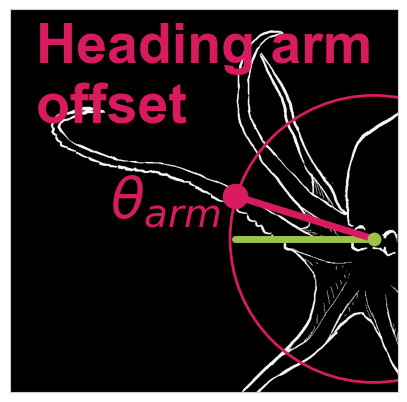

In [50]:
heading_offset_color = "#9AC349"
heading_arm_offset_color = "#D81B60"

path_octopus_image = os.path.join(target_dir, 'Octopus.png')
octopus_image = cv2.imread(path_octopus_image, cv2.IMREAD_UNCHANGED)
octopus_image = cv2.cvtColor(octopus_image, cv2.COLOR_BGR2GRAY)

xc0, xc1 = 450, 2050
yc0, yc1 = 225, 1350

xem = 760
yem = 480

arm_pos_x = xem - 290
arm_pos_y = yem - 90

bodyaxis = np.pi/2+.2
bodyaxis_scalar = 450

heading_offset = np.pi
heading_offset_scalar = 290

circle_radius = 300

octopus_image = octopus_image[yc0:yc1, xc0:xc1]

## draw bodyaxis line on image
x2 = xem + bodyaxis_scalar*np.cos(bodyaxis)
y2 = yem + bodyaxis_scalar*np.sin(bodyaxis)

## draw heading offset line on image
x3 = xem + heading_offset_scalar*np.cos(heading_offset)
y3 = yem + heading_offset_scalar*np.sin(heading_offset)

fig, ax = plt.subplots(1, 1, figsize=(5, 5))

ax.imshow(octopus_image, zorder=1, cmap='Greys_r')

circle = plt.Circle((xem, yem), circle_radius, color=heading_arm_offset_color, fill=False, linewidth=2, zorder=2)
ax.add_artist(circle)

ax.scatter(xem, yem, color=heading_offset_color , s=80, zorder=3)
#ax.plot([xem, x2], [yem, y2], color=bodyaxis_color, linewidth=5, zorder=2)
ax.plot([xem, x3], [yem, y3], color=heading_offset_color, linewidth=5, zorder=2)

ax.scatter(arm_pos_x, arm_pos_y, color=heading_arm_offset_color, s=300, zorder=3, )
ax.plot([xem, arm_pos_x], [yem, arm_pos_y], color=heading_arm_offset_color, linewidth=5, zorder=2)

ax.set_aspect('equal')

ax.text(0.5, 0.82, 'Heading arm\noffset            ', fontsize=40, color=heading_arm_offset_color, fontweight='bold', ha='center', va='center', transform=ax.transAxes)

## add theta text label to arc location between bodyaxis and heading offset
#ax.text(0.33, 0.38, r'$\theta$', fontsize=40, color=heading_offset_color, fontweight='bold', ha='center', va='center', transform=ax.transAxes)
ax.text(0.4, 0.5, r'$\theta_{arm}$', fontsize=40, color=heading_arm_offset_color, fontweight='bold', ha='center', va='center', transform=ax.transAxes)

ax.set_xticks([])
ax.set_yticks([])

ax.set_xlim(0, xem+50)
ax.set_ylim(800, 0)

name_fig = 'octopus_heading_arm_offset.png'
path_fig = os.path.join(target_dir, name_fig)
plt.savefig(path_fig, dpi=300, bbox_inches='tight')

plt.show(fig)
plt.close(fig)

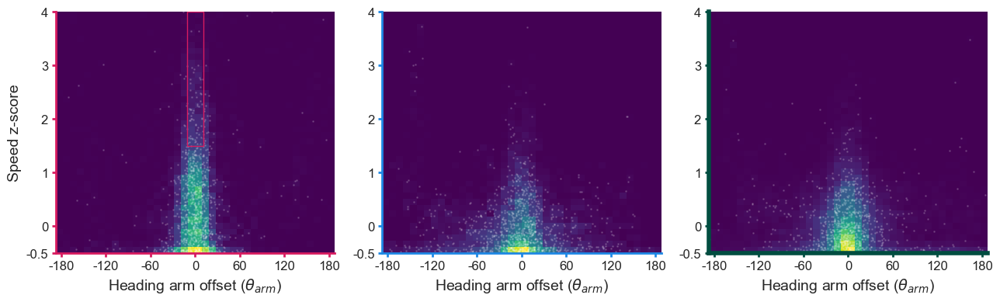

In [51]:
## making the above peak, but with distance_to_closest_peaks instead of heading offset angle

fig, axs = plt.subplots(1,3,figsize=(13,4))

## high speed low offset trajs bounds
offset_bounds = [-5,5]
speed_bounds = [2,4]

def test_if_values_within_bounds (v0, v1, b0, b1):
    """
    v0 : float
    v1 : float
    b0 : list with 2 values, [min, max]
    b1 : list with 2 values, [min, max]
    """

    if (v0>=b0[0]) and (v0<=b0[1]) and (v1>=b1[0]) and (v1<=b1[1]):
        return True
    else:
        return False

zmax = 4
zmin = -.5

bins = [40,40]
rngx = [-50, 50]
rngy = [zmin, zmax]

## high speed low offset trajs bounds
offset_bounds = [-3,3]
speed_bounds = [1.5,4]

xticks = [-48, -32, -16, 0, 16, 32, 48]
xticklabels =[-180, -120, -60, 0, 60, 120, 180]

cmap = 'viridis'
nsamp_scatter = 1000
coldots = 'white'

yticks = [zmin, 0, 1, 2, 3, zmax]

### test ###
ax=axs[0]
condition = 'Food_eaten'

distances_to_closest_peaks = []
speed_zscores = []

tmp = data[data['condition']==condition]
for i, row in enumerate(tmp.iloc[0:].iterrows()):

    tmptmp = row[1]
    app_idxs = tmptmp['final_approach_indexes']
    inPlume = tmptmp['inside_plume']
    inFood = tmptmp['inside_food_circle']

    ## get indexes where inPlume == True and inFood == False
    testIdxs = np.where((inPlume==True) & (inFood==False))[0]
    ## if there is a jump in the indexes, drop all indexes after the jump
    if np.any(np.diff(testIdxs) > 1):
        testIdxs = testIdxs[:np.where(np.diff(testIdxs) > 1)[0][0]+1]

    distance_to_closest_peaks = np.array(tmptmp['distance_to_closest_peaks'])[testIdxs[:-1]]
    speed_zscore = tmptmp['zscore_speed'][testIdxs[:-1]]

    ## concatentate heading offset angles and speed zscores
    distances_to_closest_peaks = np.concatenate((distances_to_closest_peaks, distance_to_closest_peaks))
    speed_zscores = np.concatenate((speed_zscores, speed_zscore))

## drop nans
speed_zscores = speed_zscores[~np.isnan(distances_to_closest_peaks)]
distances_to_closest_peaks = distances_to_closest_peaks[~np.isnan(distances_to_closest_peaks)]

## get row indexes where distance_to_closest_peaks and speed_zscore are within bounds
withins = []
for i, (pk, sp) in enumerate(zip(distances_to_closest_peaks, speed_zscores)):
    within = test_if_values_within_bounds(pk, sp, offset_bounds, speed_bounds)
    withins.append(within)
withins = np.array(withins)

ax.hist2d(distances_to_closest_peaks, speed_zscores, bins=bins, range=[rngx, rngy], cmap=cmap)
random_indices = np.random.choice(np.arange(len(distances_to_closest_peaks)), size=nsamp_scatter, replace=False)
ax.scatter(distances_to_closest_peaks[random_indices], speed_zscores[random_indices], s=1, color=coldots, alpha=0.15)

rect = patches.Rectangle((offset_bounds[0], speed_bounds[0]),
                         offset_bounds[1]-offset_bounds[0],
                         speed_bounds[1]-speed_bounds[0],
                         linewidth=1, edgecolor=heading_arm_offset_color, facecolor='none')
ax.add_patch(rect)

"""withins_R = []
for i, (pk, sp) in enumerate(zip(distances_to_closest_peaks[random_indices], speed_zscores[random_indices])):
    within = test_if_values_within_bounds(pk, sp, offset_bounds, speed_bounds)
    withins_R.append(within)
withins_R = np.array(withins_R)
ax.scatter(distances_to_closest_peaks[random_indices][withins_R], speed_zscores[random_indices][withins_R], s=1, color='red', alpha=1)"""

"""rect = patches.Rectangle((offset_bounds[0], speed_bounds[0]),
                         offset_bounds[1]-offset_bounds[0],
                         speed_bounds[1]-speed_bounds[0],
                         linewidth=1, edgecolor=heading_arm_offset_color, facecolor='none')
ax.add_patch(rect)"""

ax.set_yticks(yticks)
ax.set_yticklabels(yticks, fontsize=12)

ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels, fontsize=12)

ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True, color=color_key[condition], width=2)
ax.tick_params(axis='y', which='both', left=True, right=False, labelleft=True, color=color_key[condition], width=2)

for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2)
    ax.spines[axis].set_color(color_key[condition])

ax.set_ylabel('Speed z-score', fontsize=14)
ax.set_xlabel(r'Heading arm offset ($\theta_{arm}$)', fontsize=14)

### no app ###
ax = axs[1]
condition = 'Food_not_eaten'

distances_to_closest_peaks = []
speed_zscores = []

tmp = data[data['condition']==condition]
for i, row in enumerate(tmp.iloc[0:].iterrows()):

    tmptmp = row[1]
    app_idxs = tmptmp['final_approach_indexes']
    inPlume = tmptmp['inside_plume']
    inFood = tmptmp['inside_food_circle']

    ## get indexes where inPlume == True and inFood == False
    testIdxs = np.where((inPlume==True) & (inFood==False))[0]
    ## if there is a jump in the indexes, drop all indexes after the jump
    if np.any(np.diff(testIdxs) > 1):
        testIdxs = testIdxs[:np.where(np.diff(testIdxs) > 1)[0][0]+1]

    distance_to_closest_peaks = np.array(tmptmp['distance_to_closest_peaks'])[testIdxs[:-1]]
    speed_zscore = tmptmp['zscore_speed'][testIdxs[:-1]]

    ## concatentate heading offset angles and speed zscores
    distances_to_closest_peaks = np.concatenate((distances_to_closest_peaks, distance_to_closest_peaks))
    speed_zscores = np.concatenate((speed_zscores, speed_zscore))

## drop nans
speed_zscores = speed_zscores[~np.isnan(distances_to_closest_peaks)]
distances_to_closest_peaks = distances_to_closest_peaks[~np.isnan(distances_to_closest_peaks)]

ax.hist2d(distances_to_closest_peaks, speed_zscores, bins=bins, range=[rngx, rngy], cmap=cmap)
random_indices = np.random.choice(np.arange(len(distances_to_closest_peaks)), size=nsamp_scatter, replace=False)
ax.scatter(distances_to_closest_peaks[random_indices], speed_zscores[random_indices], s=1, color=coldots, alpha=0.15)

ax.set_yticks(yticks)
ax.set_yticklabels(yticks, fontsize=12)

ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels, fontsize=12)

ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True, color=color_key[condition], width=2)
ax.tick_params(axis='y', which='both', left=True, right=False, labelleft=True, color=color_key[condition], width=2)

for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2)
    ax.spines[axis].set_color(color_key[condition])

ax.set_xlabel(r'Heading arm offset ($\theta_{arm}$)', fontsize=14)

### control ###
ax = axs[2]
condition = 'No_food_Control'

distances_to_closest_peaks = []
speed_zscores = []

tmp = data[data['condition']==condition]
for i, row in enumerate(tmp.iloc[0:].iterrows()):

    tmptmp = row[1]
    app_idxs = tmptmp['final_approach_indexes']
    inPlume = tmptmp['inside_plume']
    inFood = tmptmp['inside_food_circle']

    ## get indexes where inPlume == True and inFood == False
    testIdxs = np.where((inPlume==True) & (inFood==False))[0]
    ## if there is a jump in the indexes, drop all indexes after the jump
    if np.any(np.diff(testIdxs) > 1):
        testIdxs = testIdxs[:np.where(np.diff(testIdxs) > 1)[0][0]+1]

    distance_to_closest_peaks = np.array(tmptmp['distance_to_closest_peaks'])[testIdxs[:-1]]
    speed_zscore = tmptmp['zscore_speed'][testIdxs[:-1]]

    ## concatentate heading offset angles and speed zscores
    distances_to_closest_peaks = np.concatenate((distances_to_closest_peaks, distance_to_closest_peaks))
    speed_zscores = np.concatenate((speed_zscores, speed_zscore))

## drop nans
speed_zscores = speed_zscores[~np.isnan(distances_to_closest_peaks)]
distances_to_closest_peaks = distances_to_closest_peaks[~np.isnan(distances_to_closest_peaks)]

ax.hist2d(distances_to_closest_peaks, speed_zscores, bins=bins, range=[rngx, rngy], cmap=cmap)
random_indices = np.random.choice(np.arange(len(distances_to_closest_peaks)), size=nsamp_scatter, replace=False)
ax.scatter(distances_to_closest_peaks[random_indices], speed_zscores[random_indices], s=1, color=coldots, alpha=0.15)

ax.set_yticks(yticks)
ax.set_yticklabels(yticks, fontsize=12)

ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels, fontsize=12)


ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True, color=color_key[condition], width=2)
ax.tick_params(axis='y', which='both', left=True, right=False, labelleft=True, color=color_key[condition], width=2)

for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(4)
    ax.spines[axis].set_color(color_key[condition])

ax.set_xlabel(r'Heading arm offset ($\theta_{arm}$)', fontsize=14)

fig.tight_layout()

name_fig = 'distance_to_closest_peaks_vs_speed_zscore.png'
fig.savefig(os.path.join(target_dir, name_fig), dpi=300, transparent=True)

plt.show(fig)
plt.close(fig)

100%|██████████| 271/271 [00:00<00:00, 1594.13it/s]


Food_not_eaten ../../DATA/1T/trajectories\khorne\Food_not_eaten\0 155 155
No_food_Control ../../DATA/1T/trajectories\khorne\No_food_Control\0 251 251
No_food_Control ../../DATA/1T/trajectories\khorne\No_food_Control\1 336 336
No_food_Control ../../DATA/1T/trajectories\khorne\No_food_Control\10 609 609
No_food_Control ../../DATA/1T/trajectories\khorne\No_food_Control\11 379 379
No_food_Control ../../DATA/1T/trajectories\khorne\No_food_Control\12 365 365
No_food_Control ../../DATA/1T/trajectories\khorne\No_food_Control\13 0 0
No_food_Control ../../DATA/1T/trajectories\khorne\No_food_Control\14 221 221
No_food_Control ../../DATA/1T/trajectories\khorne\No_food_Control\15 585 585
No_food_Control ../../DATA/1T/trajectories\khorne\No_food_Control\16 383 383
No_food_Control ../../DATA/1T/trajectories\khorne\No_food_Control\17 339 339
No_food_Control ../../DATA/1T/trajectories\khorne\No_food_Control\18 330 330
No_food_Control ../../DATA/1T/trajectories\khorne\No_food_Control\19 0 0
No_food_Cont

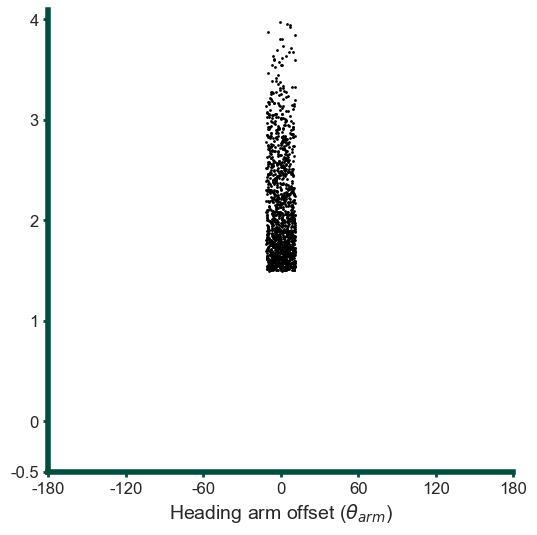

In [52]:
## high speed low offset trajs bounds
offset_bounds = [-3,3]
speed_bounds = [1.5,4]

def test_if_values_within_bounds (v0, v1, b0, b1):
    """
    v0 : float
    v1 : float
    b0 : list with 2 values, [min, max]
    b1 : list with 2 values, [min, max]
    """

    if (v0>=b0[0]) and (v0<=b0[1]) and (v1>=b1[0]) and (v1<=b1[1]):
        return True
    else:
        return False

distances_to_closest_peaks = []
speed_zscores = []

in_plume_distances_to_closest_peaks = []
in_plume_speed_zscores = []

withins_list = []
within_idxs_list = []
withins_plume_list = []

pbar = tqdm(total=len(data), position=0, leave=True)
for i, row in enumerate(data.iloc[0:].iterrows()):

    tmptmp = row[1]
    app_idxs = tmptmp['final_approach_indexes']
    inPlume = tmptmp['inside_plume']
    inFood = tmptmp['inside_food_circle']

    ## get indexes where inPlume == True and inFood == False
    testIdxs = np.where((inPlume==True) & (inFood==False))[0]
    ## if there is a jump in the indexes, drop all indexes after the jump
    if np.any(np.diff(testIdxs) > 1):
        testIdxs = testIdxs[:np.where(np.diff(testIdxs) > 1)[0][0]+1]
    withins_plume_list.append(testIdxs)

    distance_to_closest_peaks = np.array(tmptmp['distance_to_closest_peaks'])[testIdxs[:-1]]
    speed_zscore = tmptmp['zscore_speed'][testIdxs[:-1]]

    in_plume_distances_to_closest_peaks.append(distance_to_closest_peaks.copy())
    in_plume_speed_zscores.append(speed_zscore.copy())

    ## get row indexes where distance_to_closest_peaks and speed_zscore are within bounds
    withins = []
    for i, (pk, sp) in enumerate(zip(distance_to_closest_peaks, speed_zscore)):
        within = test_if_values_within_bounds(pk, sp, offset_bounds, speed_bounds)
        withins.append(within)
    withins = np.array(withins)

    withins_list.append(withins)

    print(tmptmp['condition'], tmptmp['subdir'], len(withins), len(distance_to_closest_peaks))

    idxs_within = []
    for within, idx in zip(withins, testIdxs[:-1]):
        if within == True:
            idxs_within.append(idx)
    within_idxs_list.append(idxs_within)

    distance_to_closest_peaks = np.array(distance_to_closest_peaks)[withins == True]
    speed_zscore = np.array(speed_zscore)[withins == True]

    distances_to_closest_peaks = np.concatenate((distances_to_closest_peaks, distance_to_closest_peaks))
    speed_zscores = np.concatenate((speed_zscores, speed_zscore))

    pbar.update(1)
pbar.close()

fig, ax = plt.subplots(1,1,figsize=(6,6))

ax.scatter(distances_to_closest_peaks, speed_zscores, s=1, color='black', alpha=1)

ax.set_yticks(yticks)
ax.set_yticklabels(yticks, fontsize=12)

ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels, fontsize=12)


ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True, color=color_key[condition], width=2)
ax.tick_params(axis='y', which='both', left=True, right=False, labelleft=True, color=color_key[condition], width=2)

for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(4)
    ax.spines[axis].set_color(color_key[condition])

ax.set_xlabel(r'Heading arm offset ($\theta_{arm}$)', fontsize=14)

plt.show(fig)
plt.close(fig)

data['within_plume_list'] = withins_plume_list
data['within_fast_aligned_motion_box'] = withins_list
data['within_fast_aligned_motion_box_idxs'] = within_idxs_list
data['in_plume_distances_to_closest_peaks'] = in_plume_distances_to_closest_peaks
data['in_plume_speed_zscores'] = in_plume_speed_zscores


In [53]:
for row in data.iterrows():
    row = row[1]
    print(row['subdir'], row['condition'], len(row['within_fast_aligned_motion_box']), len(row['in_plume_distances_to_closest_peaks']))

../../DATA/1T/trajectories\khorne\Food_not_eaten\0 Food_not_eaten 155 155
../../DATA/1T/trajectories\khorne\No_food_Control\0 No_food_Control 251 251
../../DATA/1T/trajectories\khorne\No_food_Control\1 No_food_Control 336 336
../../DATA/1T/trajectories\khorne\No_food_Control\10 No_food_Control 609 609
../../DATA/1T/trajectories\khorne\No_food_Control\11 No_food_Control 379 379
../../DATA/1T/trajectories\khorne\No_food_Control\12 No_food_Control 365 365
../../DATA/1T/trajectories\khorne\No_food_Control\13 No_food_Control 0 0
../../DATA/1T/trajectories\khorne\No_food_Control\14 No_food_Control 221 221
../../DATA/1T/trajectories\khorne\No_food_Control\15 No_food_Control 585 585
../../DATA/1T/trajectories\khorne\No_food_Control\16 No_food_Control 383 383
../../DATA/1T/trajectories\khorne\No_food_Control\17 No_food_Control 339 339
../../DATA/1T/trajectories\khorne\No_food_Control\18 No_food_Control 330 330
../../DATA/1T/trajectories\khorne\No_food_Control\19 No_food_Control 0 0
../../DATA/1

In [54]:
data

,inside_food_circle,inside_plume,animal,subdir,condition,inBox,mex,mey,lex,ley,...,shells_heights,shifted_heading_offset_angles,closest_peaks,distance_to_closest_peaks,convex_hull_coordinates,within_plume_list,within_fast_aligned_motion_box,within_fast_aligned_motion_box_idxs,in_plume_distances_to_closest_peaks,in_plume_speed_zscores
0,"[False, False, False, False, False, False, Fal...","[False, False, False, False, False, False, Fal...",khorne,../../DATA/1T/trajectories\khorne\Food_not_eat...,Food_not_eaten,"[True, True, True, True, True, True, True, Tru...","[867.7782321352277, 868.4098868720093, 869.103...","[220.3760096390972, 222.62254504851472, 224.94...","[859.7916990734894, 860.442156655386, 861.1662...","[218.44241288276504, 220.4394524234994, 222.58...",...,"[[92.0, 205.3, 242.45, 168.35, 255.0, 80.45, 1...","[8.142816227815567, 8.879178515277461, 9.65239...","[8, 8, 8, 8, 17, 17, 17, 16, 16, 16, 16, 28, 2...","[0.14281622781556713, 0.8791785152774612, 1.65...","[[[[362 214]], [[364 215]], [[368 219]], [[384...","[257, 258, 259, 260, 261, 262, 263, 264, 265, ...","[False, False, False, False, False, False, Fal...","[268, 269, 270, 271, 272, 273, 319, 320, 321, ...","[-0.6879697255377435, 0.9062786569145569, -3.0...","[0.890045616091114, 1.0183667207415892, 1.2084..."
1,"[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Tru...",khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[401.3909255130658, 403.8310148211872, 406.165...","[440.34594049593426, 440.4824909345147, 440.96...","[408.7892003231359, 411.0060588383548, 413.219...","[436.9547971787284, 436.8070729969831, 437.059...",...,"[[192.0, 255.0], [242.8, 255.0], [155.85, 255....","[67.2699226859054, 64.20685565090004, 62.07784...","[58, 57, 57, 57, 57, 57, 56, 56, 55, 55, 54, 5...","[9.2699226859054, 7.206855650900039, 5.0778413...","[[[[364 311]], [[345 361]], [[344 363]], [[343...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[False, False, False, False, False, False, Fal...",[],"[9.2699226859054, 7.206855650900039, 5.0778413...","[0.5323052922880918, 0.5026065553112394, 0.496..."
2,"[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Tru...",khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[657.559289183019, 658.3439227389397, 659.9528...","[962.4270136912726, 957.2867360210096, 950.986...","[649.7691473232626, 650.6390723674978, 652.283...","[965.5508825641546, 960.0525758525707, 953.351...",...,"[[255.0, 116.55, 255.0, 129.7, 141.85, 28.0, 2...","[41.51949998786321, 40.5354605733971, 40.44219...","[42, 37, 38, 38, 34, 33, 33, 33, 32, 33, 35, 4...","[-0.48050001213678684, 3.5354605733971027, 2.4...","[[[[402 101]], [[404 102]], [[405 103]], [[422...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[True, False, True, True, False, False, False,...","[0, 2, 3, 104, 107, 218, 219, 220, 221, 222, 2...","[-0.48050001213678684, 3.5354605733971027, 2.4...","[1.9129923731451706, 2.5656317767274475, 2.964..."
3,"[False, False, False, False, False, False, Fal...","[True, True, True, True, True, True, True, Tru...",khorne,../../DATA/1T/trajectories\khorne\No_food_Cont...,No_food_Control,"[True, True, True, True, True, True, True, Tru...","[559.7323709455363, 563.1621348289987, 565.898...","[964.6595078906078, 963.7740012767802, 963.078...","[559.3690616385084, 562.5784141925504, 565.259...","[955.8815683918298, 954.8029135622764, 953.953...",...,"[[255.0, 255.0, 117.1, 131.7, 255.0], [255.0, ...","[53.36294444206656, 52.925724130640376, 52.644...","[56, 52, 56, 57, 56, 56, 56, 56, 43, 43, 42, 4...","[-2.6370555579334365, 0.9257241306403756, -3.3...","[[[[300 256]], [[330 272]], [[359 306]], [[362...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[False, False, False, False, False, False, Fal...","[353, 354, 355, 3

In [55]:
# Save data
path_data = os.path.join(data_root, '1t_trajectories_data.pickle')
data.to_pickle(path_data)